<div class="alert alert-block alert-success">

## <center> Tracking Issues created for Repos on GitHub </center>
## <center> Plot and Forecast Issues </center>
    

</div>

<div class="alert alert-block alert-danger">
    
### Deliverables:
- Submit a single ZIP file  that has the folowing items:
    1. Your PDF document for the analysis report.
    2. Your IPYNB script with the name GitHub_Repos_Issues_Forecasting.ipynb that has your source code and output for the requirements listed
    2. Your HTML/PDF document that has your source code and output for the requirements listed

<br>
    
</div>

<hr style="border:2px solid black"> </hr>
<div class="alert alert-info">



        
## REQUIREMENT 1

Use Python/GitHub API to retrieve Issues/Repos information of the **past 2 months** for the following  repositories:
- https://github.com/meta-llama/llama3
- https://github.com/ollama/ollama
- https://github.com/langchain-ai/langchain
- https://github.com/langchain-ai/langgraph
- https://github.com/microsoft/autogen
- https://github.com/openai/openai-cookbook
- https://github.com/elastic/elasticsearch
- https://github.com/milvus-io/pymilvus


## Important: Data Retrieval Timeframe

 - For **chart visualizations below**, retrieve **past 2 years** of data.
 - For **semantic search and vector embeddings**, use **past 2 months** of data from the above repositories.

    
</div>



In [148]:
!pip install tensorflow pandas numpy requests matplotlib scikit-learn python-dateutil
!pip install pygithub
!pip install scikit-learn 

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from github import Github
import requests
from datetime import datetime, timedelta
import time

In [ ]:
# Add github token here for sure.
GITHUB_TOKEN = ""
headers = {"Authorization": f"token {GITHUB_TOKEN}"}

REPOSITORY = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]

end_date = datetime.now()
start_date = end_date - timedelta(days = 365 * 2)
print(365 * 2)

git = Github(GITHUB_TOKEN)

730


In [ ]:
def fetch_issues(repoName):
    repo = git.get_repo(repoName)
    print(f"Fetching issues for {repoName}")
    allIssues = repo.get_issues(state='all', since=start_date)
    issueObjects = []
    for issue in allIssues:
        issueObjects.append({
            'title': issue.title,
            'created_at': issue.created_at,
            'closed_at': issue.closed_at,
            'number': issue.number,
        })

    return issueObjects

# Fetching issues data for each repository
issues_data = {repo: fetch_issues(repo) for repo in REPOSITORY}

Fetching issues for meta-llama/llama3
Fetching issues for ollama/ollama
Fetching issues for langchain-ai/langchain
Fetching issues for langchain-ai/langgraph
Fetching issues for microsoft/autogen
Fetching issues for openai/openai-cookbook
Fetching issues for elastic/elasticsearch
Fetching issues for milvus-io/pymilvus


In [ ]:
import csv

# Save issues data to a CSV
def save_issues_to_csv(issues_data, filename="issues_all_repo.csv"):

    for repo, issues in issues_data.items():
        print(len(issues))
        repoName = repo.replace("/", "_")
        fileName = f"issue_{repoName}.csv"
        with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=issues[0].keys())
            writer.writeheader()
            writer.writerows(issues)

    all_entries = []
    for repo, issues in issues_data.items():
        for issue in issues:
            entry = {"repository": repo, **issue}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved issues data to {filename}")

save_issues_to_csv(issues_data)

issues_df = pd.read_csv("issues_all_repo.csv")

row_count = issues_df.shape[0]
row_count


388
10125
21749
3226
5601
1382
37429
1426
Saved issues data to issues_all_repo.csv


81326

In [ ]:
starsDict = dict()
forkedDict = dict()

for repoName in REPOSITORY:
    repo = git.get_repo(repoName)
    starsDict[repoName] = repo.stargazers_count
    forkedDict[repoName] = repo.forks_count

print(starsDict)
print(forkedDict)

stars_df = pd.DataFrame(list(starsDict.items()), columns=["Repository", "Stars"])
forked_df = pd.DataFrame(list(forkedDict.items()), columns=["Repository", "Forks"])

stars_df.to_csv("all_repo_stars.csv", index = False)
forked_df.to_csv("all_repo_forkedIssues.csv", index = False)

{'meta-llama/llama3': 28631, 'ollama/ollama': 138123, 'langchain-ai/langchain': 106094, 'langchain-ai/langgraph': 11756, 'microsoft/autogen': 43492, 'openai/openai-cookbook': 63369, 'elastic/elasticsearch': 72430, 'milvus-io/pymilvus': 1159}
{'meta-llama/llama3': 3365, 'ollama/ollama': 11506, 'langchain-ai/langchain': 17235, 'langchain-ai/langgraph': 1953, 'microsoft/autogen': 6552, 'openai/openai-cookbook': 10293, 'elastic/elasticsearch': 25177, 'milvus-io/pymilvus': 350}


In [ ]:
from datetime import datetime, timedelta, timezone

endDate = datetime.now(timezone.utc)
startDate = end_date - timedelta(days=2*365)

def fetch_pulls(repoName):
    repo = git.get_repo(repoName)
    print(f"Fetching pulls for {repoName}")
    allPulls = repo.get_pulls(state='all')
    print(f"Done pulls for {repoName}")
    allPullsObj = []

    for issue in allPulls:
        createdAt = issue.created_at.replace(tzinfo=None)
        if createdAt >= startDate:
            issue_created = issue.created_at.replace(tzinfo=None)
            closed_at = issue.closed_at.replace(tzinfo=None) if issue.closed_at else None
            merged_at = issue.merged_at.replace(tzinfo=None) if issue.merged_at else None

            allPullsObj.append({
                "repo": repoName,
                "pull_id": issue.id,
                'title': issue.title,
                'created_at': issue_created,
                'closed_at': closed_at,
                'merged_at': merged_at,
                'number': issue.number,
                'state': issue.state,
              })
    return allPullsObj

# Fetching issues data for each repository
pulls_data = {repo: fetch_pulls(repo) for repo in REPOSITORY}
print(pulls_data)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Save issues data to a CSV
def save_pulls_to_csv(pulls_data, filename="pulls_all_repo.csv"):

    for repo, issues in pulls_data.items():
        print(len(issues))
        repoName = repo.replace("/", "_")
        fileName = f"pulls_{repoName}.csv"
        with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=issues[0].keys())
            writer.writeheader()
            writer.writerows(issues)

    all_entries = []
    for repo, allPulls in pulls_data.items():
        for issue in allPulls:
            entry = {"repository": repo, **issue}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved allPulls data to {filename}")

save_pulls_to_csv(pulls_data)

pulls_df = pd.read_csv("pulls_all_repo.csv")
pulls_df.shape

99
3304
15391
2629
2913
865
24419
902
Saved allPulls data to pulls_all_repo.csv


(50522, 9)

In [ ]:
from datetime import datetime, timedelta, timezone

endDate = datetime.now(timezone.utc)
startDate = end_date - timedelta(days=2*365)

def fetch_commits(repoName):
    repo = git.get_repo(repoName)
    print(f"Fetching pulls for {repoName}")
    allCommits = repo.get_commits(since = start_date, until = end_date)
    print(f"Done commits for {repoName}")
    allCommitsObj = []
    print(allCommits)
    for commit in allCommits:
        allCommitsObj.append({
            "repo": repoName,
            "commit_id": commit.sha,
            'commit_date': commit.commit.author.date
          })
    return allCommitsObj

# Fetching issues data for each repository
commited_data = {repo: fetch_commits(repo) for repo in REPOSITORY}
print(commited_data)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import csv

# Save commits data to a CSV
def save_commits_to_csv(commits_data, filename="commits_all_repo.csv"):

    for repo, commits in commits_data.items():
        print(len(commits))
        repoName = repo.replace("/", "_")
        fileName = f"commits_{repoName}.csv"
        with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=commits[0].keys())
            writer.writeheader()
            writer.writerows(commits)
        print(f"Commited to {fileName}")

    all_entries = []
    for repo, commits in commits_data.items():
        for issue in commits:
            entry = {"repository": repo, **issue}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved commits data to {filename}")

save_commits_to_csv(commited_data)

commits_df = pd.read_csv("commits_all_repo.csv")
commits_df.shape

132
Commited to commits_meta-llama_llama3.csv
4176
Commited to commits_ollama_ollama.csv
11749
Commited to commits_langchain-ai_langchain.csv
5029
Commited to commits_langchain-ai_langgraph.csv
2955
Commited to commits_microsoft_autogen.csv
689
Commited to commits_openai_openai-cookbook.csv
16866
Commited to commits_elastic_elasticsearch.csv
473
Commited to commits_milvus-io_pymilvus.csv
Saved commits data to commits_all_repo.csv


(42069, 4)

In [ ]:
## Branches

from datetime import datetime, timedelta, timezone

endDate = datetime.now(timezone.utc)
startDate = end_date - timedelta(days=2*365)

def fetch_branches(repoName):
    repo = git.get_repo(repoName)
    print(f"Fetching branches for {repoName}")
    allbranches = repo.get_branches()
    print(f"Done branches for {repoName}")
    allBranchesObj = []
    print(allbranches)
    for branch in allbranches:
        branch_name = branch.name
        commit_sha = branch.commit.sha
        commit = branch.commit
        commit_date = commit.commit.author.date
        commitDate = commit_date.replace(tzinfo=None)
        if commitDate >= startDate:

            allBranchesObj.append({
                "repo": repoName,
                "branch_name": branch_name,
                "branch_commit_id": commit_sha,
                'commit_date': commitDate
              })
        pass
    return allBranchesObj

branch_data = {repo: fetch_branches(repo) for repo in REPOSITORY}
print(branch_data)

Fetching branches for meta-llama/llama3
Done branches for meta-llama/llama3
Fetching branches for ollama/ollama
Done branches for ollama/ollama
Fetching branches for langchain-ai/langchain
Done branches for langchain-ai/langchain
Fetching branches for langchain-ai/langgraph
Done branches for langchain-ai/langgraph
Fetching branches for microsoft/autogen
Done branches for microsoft/autogen
Fetching branches for openai/openai-cookbook
Done branches for openai/openai-cookbook
Fetching branches for elastic/elasticsearch
Done branches for elastic/elasticsearch
Fetching branches for milvus-io/pymilvus
Done branches for milvus-io/pymilvus


In [ ]:
import csv

# Save branches data to a CSV
def save_branches_to_csv(branches_data, filename="branches_all_repo.csv"):

    for repo, branches in branches_data.items():
        print(len(branches))
        repoName = repo.replace("/", "_")
        fileName = f"branches_{repoName}.csv"
        with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=branches[0].keys())
            writer.writeheader()
            writer.writerows(branches)
        print(f"branched to {fileName}")

    all_entries = []
    for repo, branches in branches_data.items():
        for branch in branches:
            entry = {"repository": repo, **branch}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved branches data to {filename}")

save_branches_to_csv(branch_data)

branches_df = pd.read_csv("branches_all_repo.csv")
branches_df.shape

19
branched to branches_meta-llama_llama3.csv
234
branched to branches_ollama_ollama.csv
784
branched to branches_langchain-ai_langchain.csv
151
branched to branches_langchain-ai_langgraph.csv
188
branched to branches_microsoft_autogen.csv
53
branched to branches_openai_openai-cookbook.csv
311
branched to branches_elastic_elasticsearch.csv
5
branched to branches_milvus-io_pymilvus.csv
Saved branches data to branches_all_repo.csv


(1745, 5)

In [ ]:
## Contributions

from datetime import datetime, timedelta, timezone

git = Github(GITHUB_TOKEN)

endDate = datetime.now(timezone.utc)
startDate = end_date - timedelta(days=2*365)

headers = {
    "Accept": "application/vnd.github+json",
    "Authorization": f"Bearer {GITHUB_TOKEN}",
}

def fetch_contributors(repoName):
    repo = git.get_repo(repoName)
    print(f"Fetching contributors for {repoName}")
    allContributors = repo.get_contributors()
    print(f"Done contributors for {repoName}")
    allContributorsObj = []

    # print(allContributors)
    for contributor in allContributors:
        # print(contributor)
        login = contributor.login
        name = contributor.name
        email = contributor.email
        contributions = contributor.contributions
        avatar_url = contributor.avatar_url
        html_url = contributor.html_url

        userURL = f"https://api.github.com/users/{login}/events/public"
        eventRes = requests.get(userURL, headers=headers, params={"per_page": 100})
        time.sleep(4)
        if eventRes.status_code == 200:
            events = eventRes.json()
            for event in events:
                createdEventDate = event.get("created_at")
                if createdEventDate:
                    event_datetime = datetime.fromisoformat(createdEventDate[:-1])
                    if start_date <= event_datetime <= end_date:
                        allContributorsObj.append({
                            "repository": repo,
                            "contributor": login,
                            "event_date": createdEventDate,
                            "contributorName": name
                        })
                        break
    return allContributorsObj

contributors_data = {repo: fetch_contributors(repo) for repo in REPOSITORY}
print(contributors_data) 

Fetching contributors for meta-llama/llama3
Done contributors for meta-llama/llama3
Fetching contributors for ollama/ollama
Done contributors for ollama/ollama
Fetching contributors for langchain-ai/langchain
Done contributors for langchain-ai/langchain
Fetching contributors for langchain-ai/langgraph
Done contributors for langchain-ai/langgraph
Fetching contributors for microsoft/autogen
Done contributors for microsoft/autogen
Fetching contributors for openai/openai-cookbook
Done contributors for openai/openai-cookbook
Fetching contributors for elastic/elasticsearch
Done contributors for elastic/elasticsearch
Fetching contributors for milvus-io/pymilvus
Done contributors for milvus-io/pymilvus


In [4]:
import csv
# Save contributor data to a CSV
def save_contributor_to_csv(contributor_data, filename="contributor_all_repo.csv"):

    for repo, contributor in contributor_data.items():
        print(len(contributor))
        repoName = repo.replace("/", "_")
        fileName = f"contributor_{repoName}.csv"
        with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=contributor[0].keys())
            writer.writeheader()
            writer.writerows(contributor)
        print(f"contributor to {fileName}")

    all_entries = []
    for repo, contributor in contributor_data.items():
        for contri in contributor:
            entry = {"repository": repo, **contri}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved contributor data to {filename}")

save_contributor_to_csv(contributors_data)

contributor_df = pd.read_csv("contributor_all_repo.csv")
contributor_df.shape 

Saved contributor data to contributor_all_repo.csv


In [ ]:
# Releases

from datetime import datetime, timedelta, timezone

git = Github(GITHUB_TOKEN)

endDate = datetime.now(timezone.utc)
startDate = end_date - timedelta(days=2*365)

def fetch_releases(repoName):
    repo = Github(GITHUB_TOKEN).get_repo(repoName)
    print(f"Fetching releases for {repoName}")

    releases = repo.get_releases()  # Gets all releases (paginated)
    releases_data = []

    for release in releases:
        start_date1 = start_date.replace(tzinfo=timezone.utc)
        end_date1 = end_date.replace(tzinfo=timezone.utc)

        if start_date1 <= release.published_at <= end_date1:
            releases_data.append({
                "repo": repoName,
                "release_id": release.id,
                "name": release.title,
                "tag_name": release.tag_name,
                "published_at": release.published_at,
                "tag_name": release.tag_name,
            })

    return releases_data

releases_data = {repo: fetch_releases(repo) for repo in REPOSITORY}
print(releases_data)


In [ ]:
import csv

# Save releases data to a CSV
def save_releases_to_csv(releases_data, filename="releases_all_repo.csv"):

    for repo, releases in releases_data.items():
        print(len(releases))
        repoName = repo.replace("/", "_")
        fileName = f"releases_{repoName}.csv"
        if releases:
            with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
                writer = csv.DictWriter(csvfile, fieldnames=releases[0].keys())
                writer.writeheader()
                writer.writerows(releases)
        print(f"releases to {fileName}")

    all_entries = []
    for repo, releases in releases_data.items():
        for release in releases:
            entry = {"repository": repo, **release}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved releases data to {filename}")

save_releases_to_csv(releases_data)

releases_df = pd.read_csv("releases_all_repo.csv")
releases_df.shape

<hr style="border:1px solid black"> </hr>

<div class="alert alert-info">   
    
## REQUIREMENT 2
- A line chart to plot the issues for every repository
    
</div>


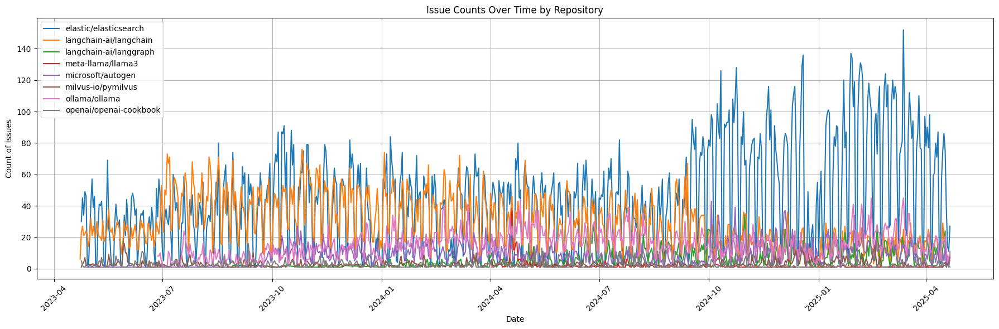

In [ ]:
#Add your code for requirement 2 in this cell

import pandas as pd
from datetime import datetime, timedelta
import pytz

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days = 365* 2)).astimezone(pytz.UTC)

req2 = pd.read_csv('dataset/issues_all_repo.csv')
req2 = req2.dropna(subset="created_at")

req2['created_at'] = pd.to_datetime(req2['created_at'], errors='coerce').dt.tz_convert('UTC')

req2['only_date'] = req2['created_at'].dt.date
req2 = req2[req2['created_at'] >= oldDate]

issues = req2.groupby(['repository', 'only_date']).size().reset_index(name="Count-of-Issues")
issues.tail(35)

issues['only_date'] = pd.to_datetime(issues['only_date'])

plt.figure(figsize=(18, 6))
 
for repo in issues["repository"].unique():
    repo_data = issues[issues["repository"] == repo]
    plt.plot(repo_data["only_date"], repo_data["Count-of-Issues"], label=repo)

# Adding labels and title
plt.title("Issue Counts Over Time by Repository")
plt.xlabel("Date")
plt.ylabel("Count of Issues")
plt.xticks(rotation=45)
plt.legend(title="Repository Name")
plt.grid(True)
plt.tight_layout()
 
plt.show()

 

<hr style="border:1px solid black"> </hr>

<div class="alert alert-info">   
    
## REQUIREMENT 3
- A bar chart to plot the issues created for every month for every repository
    
</div>

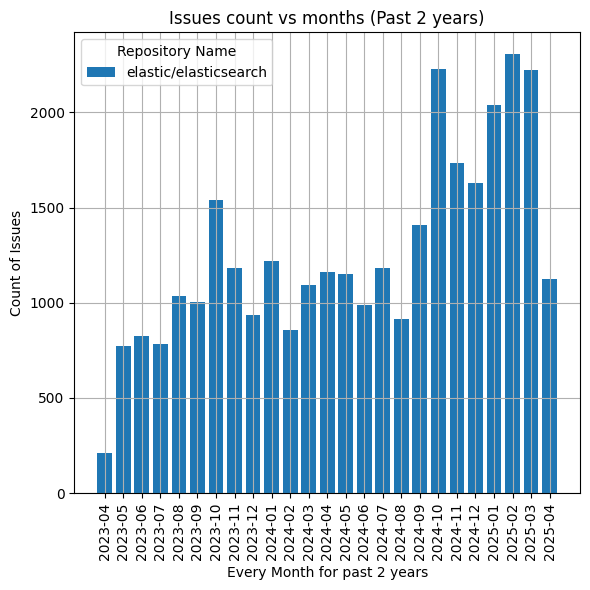

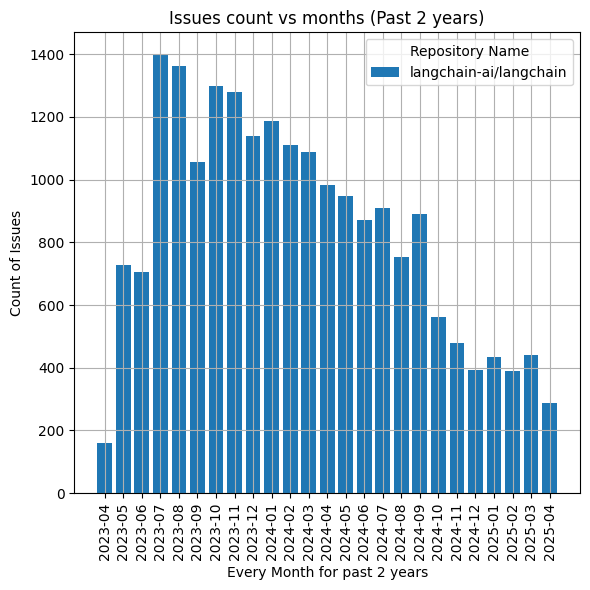

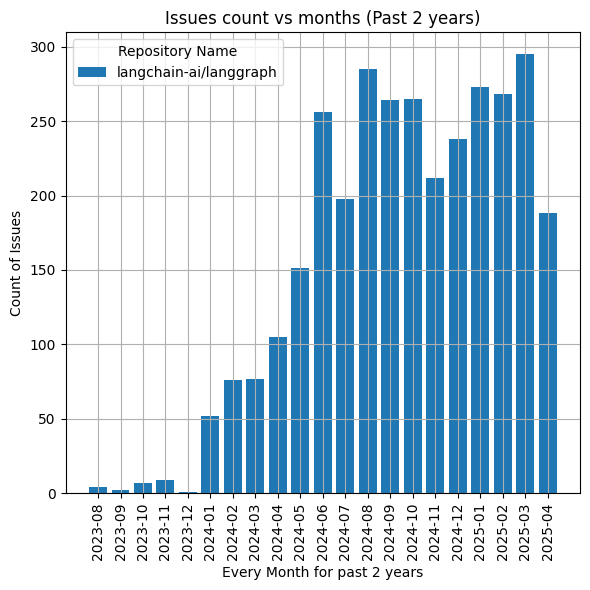

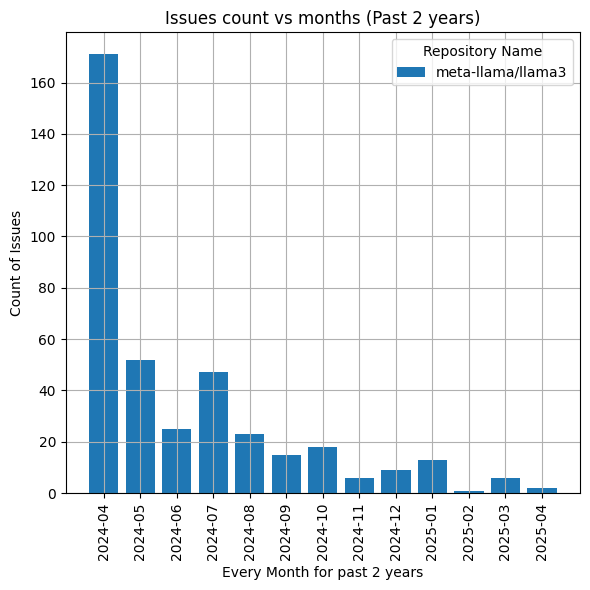

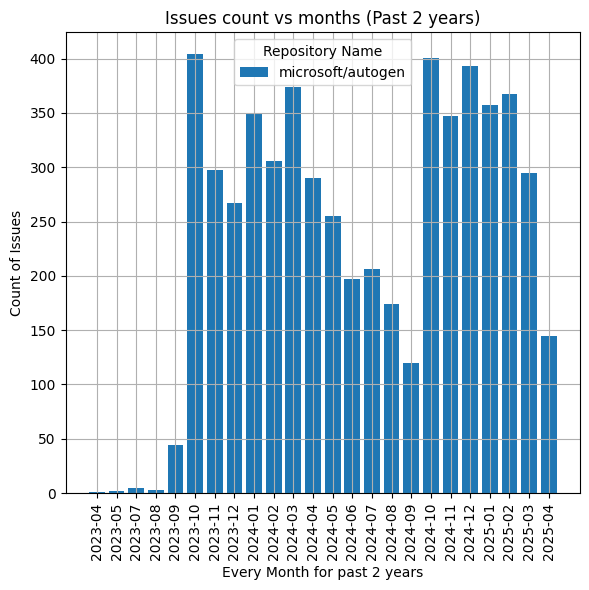

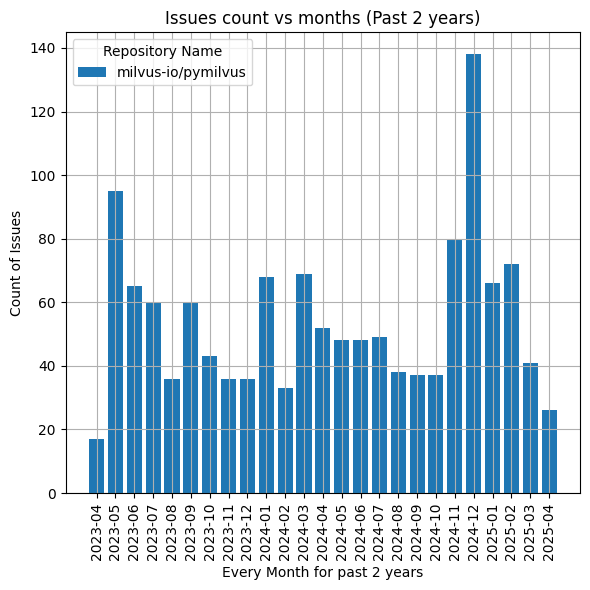

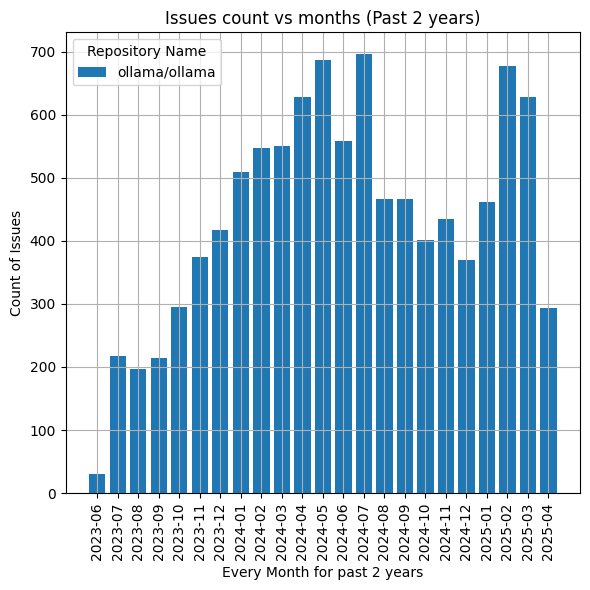

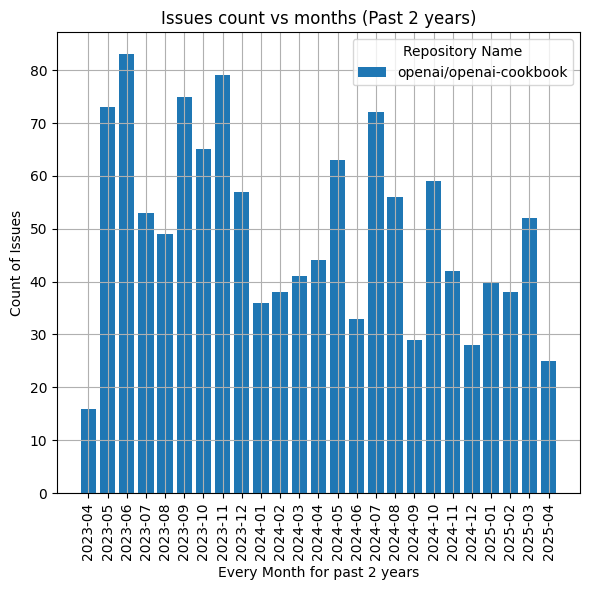

In [51]:
#Add your code for requirement 3 in this cell

from datetime import datetime, timedelta
import pytz

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days = 365 * 2)).astimezone(pytz.UTC)

req3 = pd.read_csv('dataset/issues_all_repo.csv')
req3 = req3.dropna(subset="created_at")

req3['created_at'] = pd.to_datetime(req3['created_at'], errors='coerce').dt.tz_convert('UTC')

req3['only_date'] = req3['created_at'].dt.date
req3 = req3[req3['created_at'] >= oldDate]

req3['only_date'] = pd.to_datetime(req3['only_date'])

req3["month"] = req3["only_date"].dt.to_period("M")

issues = req3.groupby(['repository', 'month']).size().reset_index(name="Count-of-Issues")

issues.head(35)

issues["month"] = issues["month"].astype(str)
 
for repo in issues["repository"].unique():
    plt.figure(figsize=(6, 6))
    repo_data = issues[issues["repository"] == repo]
    plt.bar(repo_data["month"], repo_data["Count-of-Issues"], label=repo)

    plt.title("Issues count vs months (Past 2 years)")
    plt.xlabel("Every Month for past 2 years")
    plt.ylabel("Count of Issues")
    plt.xticks(rotation=90)
    plt.legend(title="Repository Name")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 4
- A bar chart to plot the starts for every repository
    
</div>

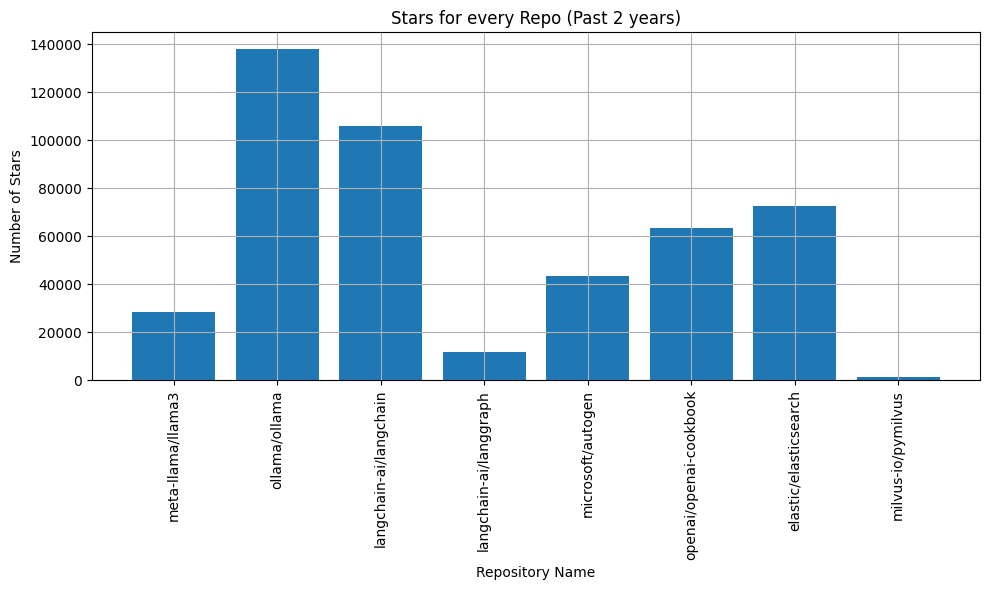

In [59]:
#Add your code for requirement 4 in this cell
req4 = pd.read_csv('dataset/all_repo_stars.csv')
req4.head()

plt.figure(figsize=(10,6))
plt.bar(req4["Repository"], req4["Stars"])
plt.title("Stars for every Repo (Past 2 years)")
plt.xlabel("Repository Name")
plt.ylabel("Number of Stars")
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 5
- A bar chart to plot the forks for every repository
    
</div>

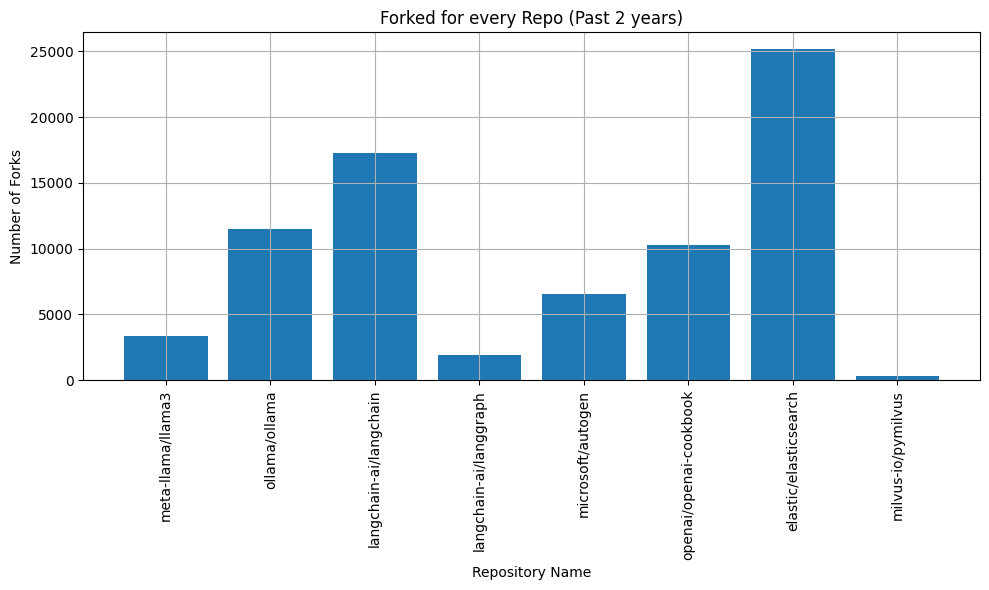

In [63]:
#Add your code for requirement 5 in this cell

req5 = pd.read_csv('dataset/all_repo_forkedIssues.csv')
req5.head()

plt.figure(figsize=(10,6))
plt.bar(req5["Repository"], req5["Forks"])
plt.title("Forked for every Repo (Past 2 years)")
plt.xlabel("Repository Name")
plt.ylabel("Number of Forks")
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 6
- A bar chart to plot the issues closed for every week for every repository
    
</div>

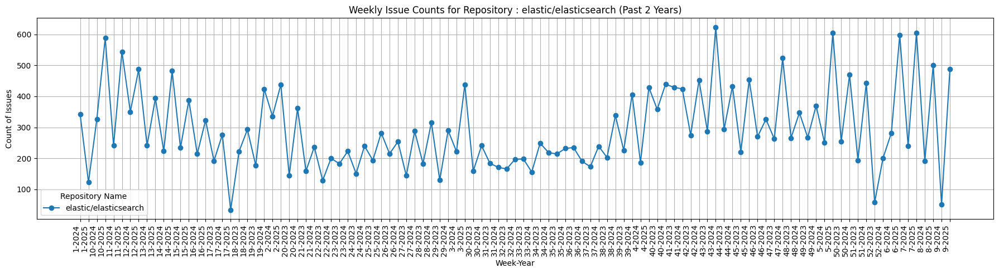

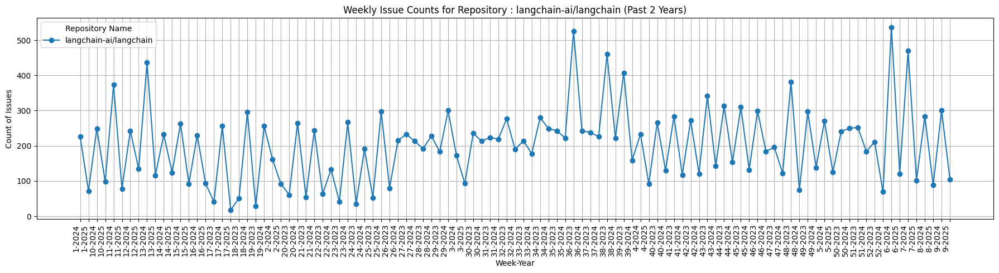

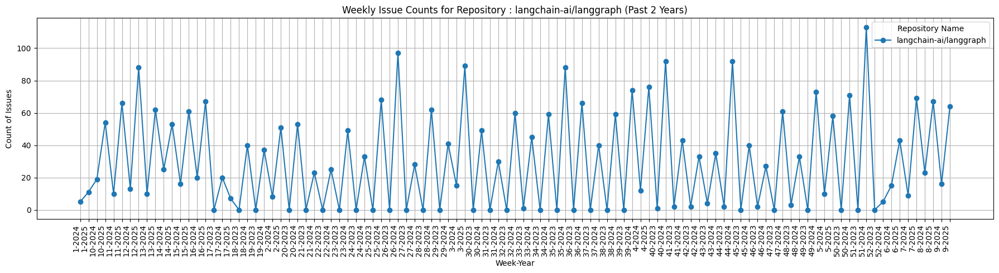

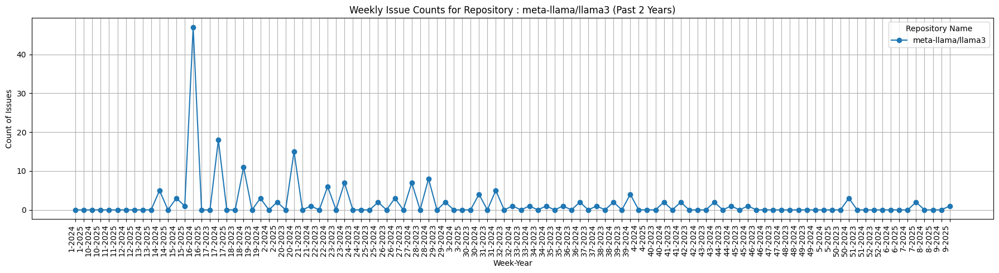

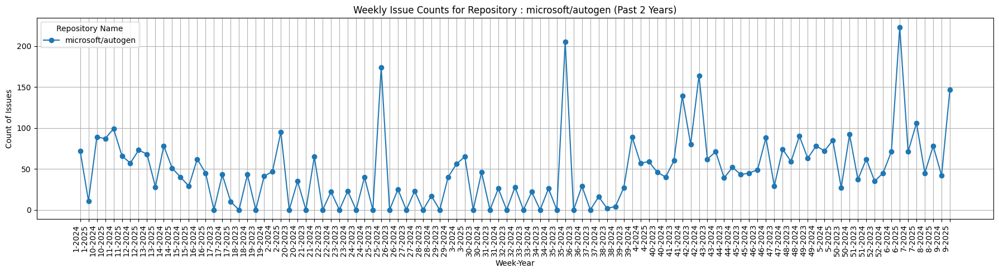

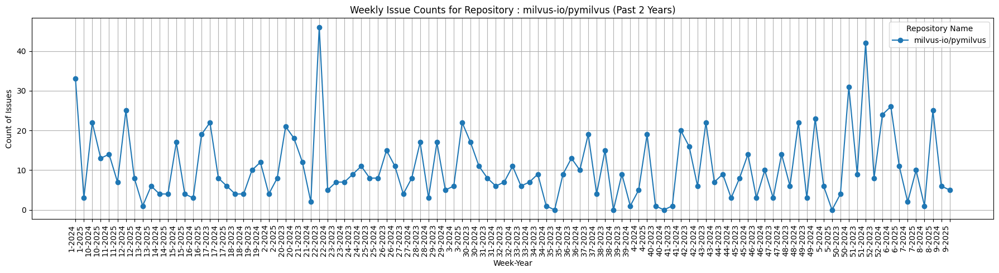

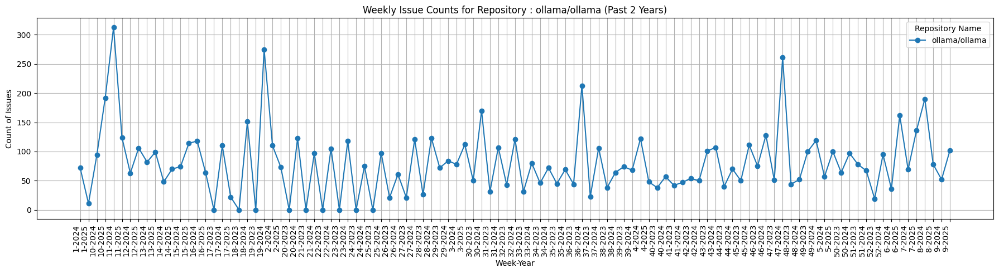

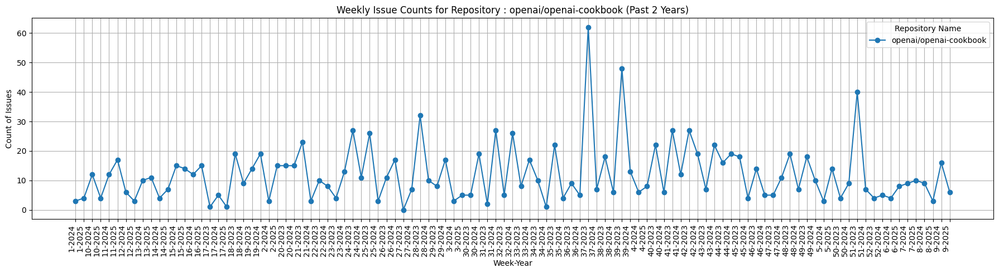

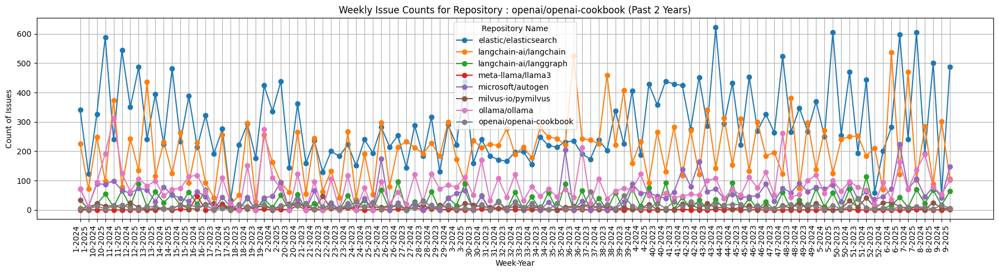

In [122]:
from datetime import datetime, timedelta
import pytz
import pandas as pd


nowDate = datetime.now()
oldDate = (nowDate - timedelta(days=365 * 2)).astimezone(pytz.UTC)

req6 = pd.read_csv('dataset/issues_all_repo.csv')

req6['closed_at'] = pd.to_datetime(req6['closed_at'], errors='coerce')

issues = req6.dropna(subset=['closed_at'])
issues = issues[issues['closed_at'] >= oldDate]

issues['week_based'] = issues['closed_at'].apply(lambda x: f"{x.isocalendar().week}-{x.year}")

weeklyInfo = issues.groupby(['repository', 'week_based']).size().reset_index(name='Count-of-Issues')

pivot_data = weeklyInfo.pivot(index='week_based', columns='repository', values='Count-of-Issues').fillna(0)


for repoName in pivot_data.columns:
    plt.figure(figsize=(18, 5))
    plt.plot(pivot_data.index, pivot_data[repoName], label=repoName, marker='o', linestyle='-')
    plt.title(f"Weekly Issue Counts for Repository : {repoName} (Past 2 Years)")
    plt.xlabel("Week-Year")
    plt.ylabel("Count of Issues")
    plt.xticks(rotation=90, ha='right')
    plt.legend(title="Repository Name")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

plt.figure(figsize=(18, 5))
for repoName in pivot_data.columns:
    plt.plot(pivot_data.index, pivot_data[repoName], label=repoName, marker='o', linestyle='-')
plt.title(f"Weekly Issue Counts for Repository : {repoName} (Past 2 Years)")
plt.xlabel("Week-Year")
plt.ylabel("Count of Issues")
plt.xticks(rotation=90, ha='right')
plt.legend(title="Repository Name")
plt.grid(True)
plt.tight_layout()
plt.show()

<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 7
- A stack-bar Chart to plot the created and closed issues for every repository
    
</div>

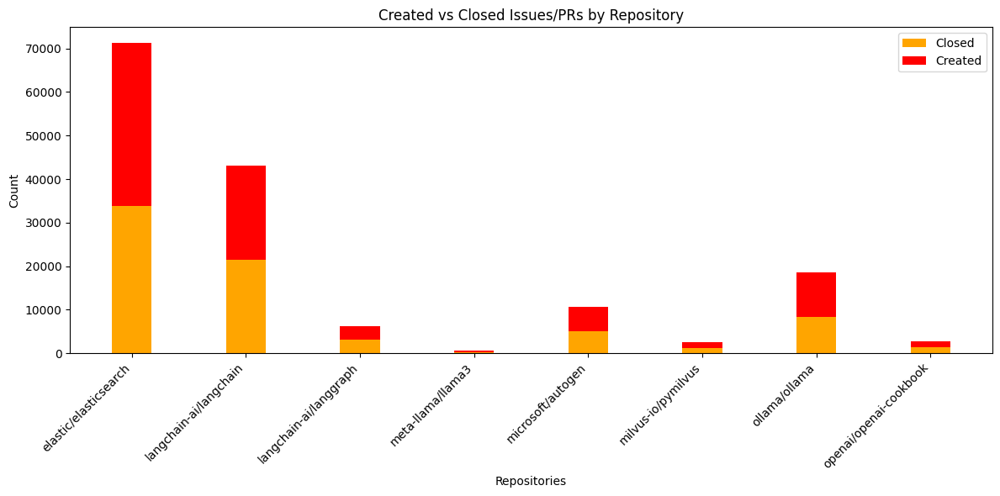

In [143]:
#Add your code for requirement 7 in this cell

from datetime import datetime, timedelta
import pytz
import pandas as pd

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days=365 * 2)).astimezone(pytz.UTC)

req7 = pd.read_csv('dataset/issues_all_repo.csv')

req7['created_at'] = pd.to_datetime(req7['created_at'], errors='coerce')
req7['closed_at'] = pd.to_datetime(req7['closed_at'], errors='coerce')

issues = req7[(req7['created_at'] >= oldDate) | (req7['closed_at'] >= oldDate)]

createdColumnSum = req7.groupby('repository')['created_at'].count()
closedColumnSum =  req7.dropna(subset = ['closed_at']).groupby('repository')['closed_at'].count()

repositories = [
    'elastic/elasticsearch',
    'langchain-ai/langchain',
    'langchain-ai/langgraph',
    'meta-llama/llama3',
    'microsoft/autogen',
    'milvus-io/pymilvus',
    'ollama/ollama',
    'openai/openai-cookbook'
]
createdByList =[]
for i in createdColumnSum:
    createdByList.append(i)

closedByList =[]
for i in closedColumnSum:
    closedByList.append(i)

fig, ax = plt.subplots(figsize=(12, 6))
bar_width = 0.35
x = np.arange(len(repositories))

bars1 = ax.bar(x, closedByList, bar_width, label='Closed', color='orange')
bars2 = ax.bar(x, createdByList, bar_width, bottom=closedByList, label='Created', color='red')
ax.set_xlabel('Repositories')
ax.set_ylabel('Count')
ax.set_title('Created vs Closed Issues/PRs by Repository')
ax.set_xticks(x)
ax.set_xticklabels(repositories, rotation=45, ha='right')
ax.legend()
plt.tight_layout()
plt.show()


<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
#### REQUIREMENT 8 (TENSORFLOW/KERAS LSTM) - It is availale  in GitHub_Repos_Issues_Forecasting-LSTM.ipynb file 
</div>

<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
#### REQUIREMENT 9 (TENSORFLOW/KERAS LSTM) - It is availale  in GitHub_Repos_Issues_Forecasting-Prophet.ipynb file 
</div>

<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 10 (STATSMODEL)
- Use StatsModel package to forecast the following for every repository
    
</div>

In [18]:
%pip install statsmodels

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 47.5 MB/s eta 0:00:00a 0:00:01

[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python3.10 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


<div class="alert alert-block alert-danger">   
    
#### REQ10-1). The day of the week maximum number of issues created
    
</div>

The day of the week maximum number of issues created on Thursday for repository : meta-llama/llama3


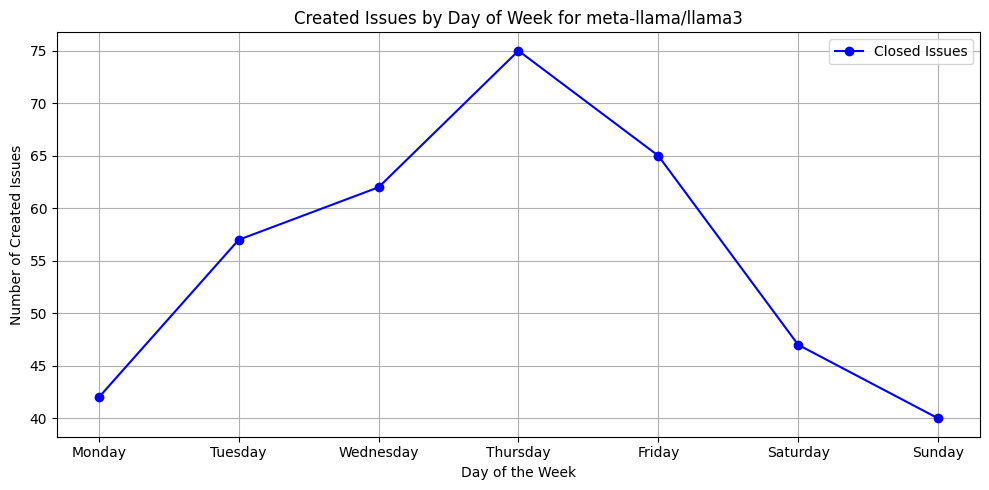

The day of the week maximum number of issues created on Thursday for repository : ollama/ollama


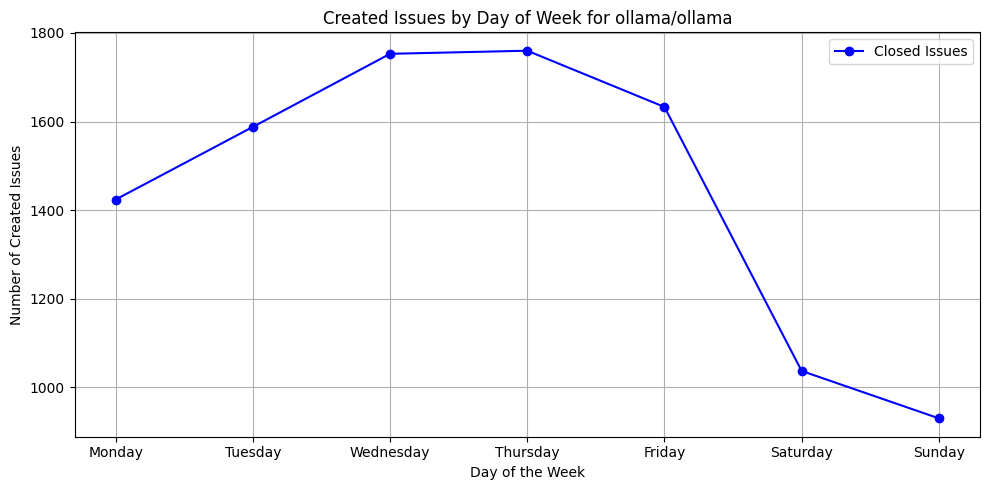

The day of the week maximum number of issues created on Wednesday for repository : langchain-ai/langchain


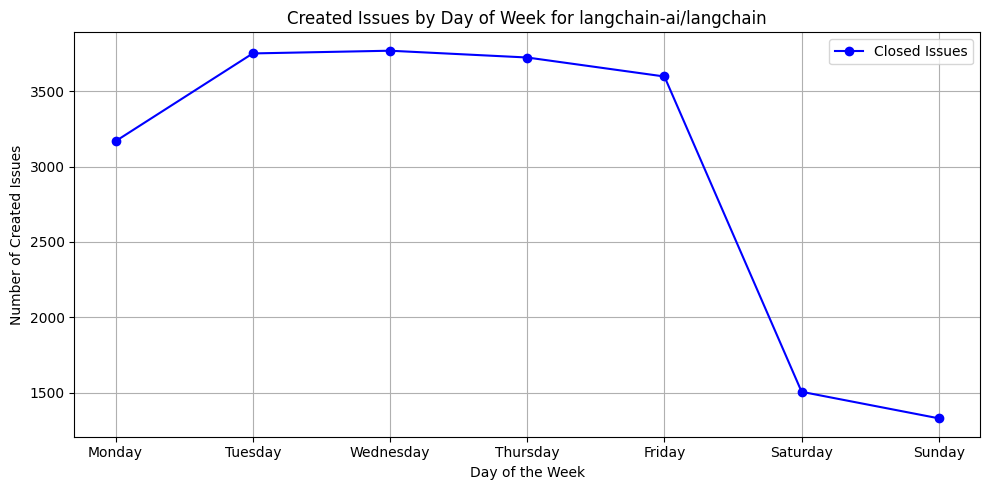

The day of the week maximum number of issues created on Wednesday for repository : langchain-ai/langgraph


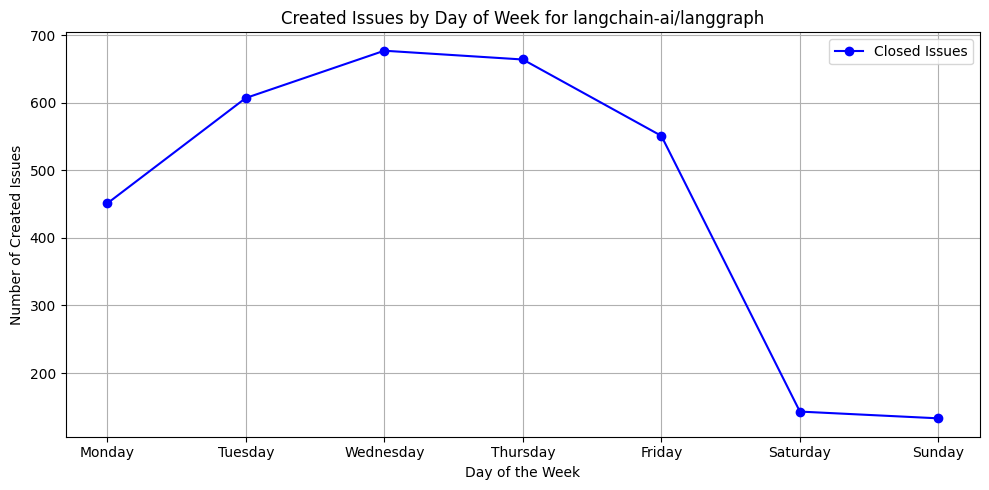

The day of the week maximum number of issues created on Tuesday for repository : microsoft/autogen


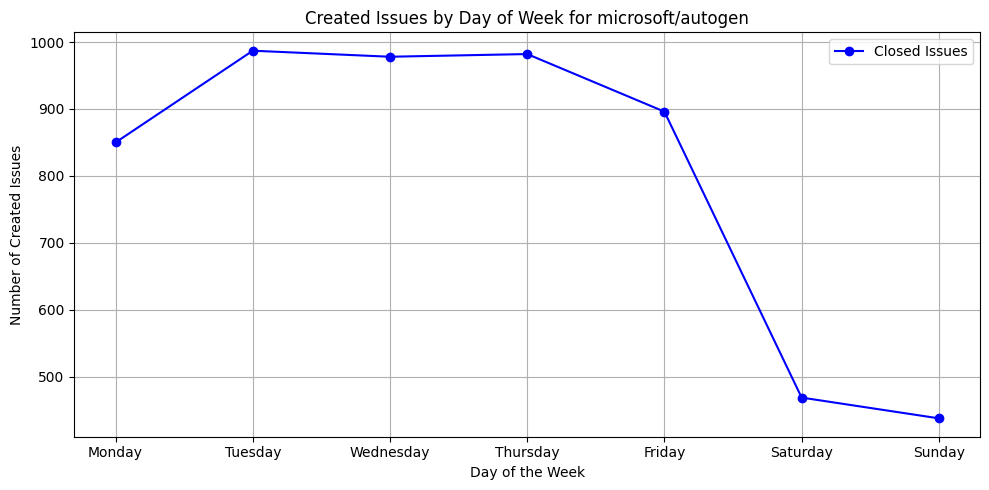

The day of the week maximum number of issues created on Wednesday for repository : openai/openai-cookbook


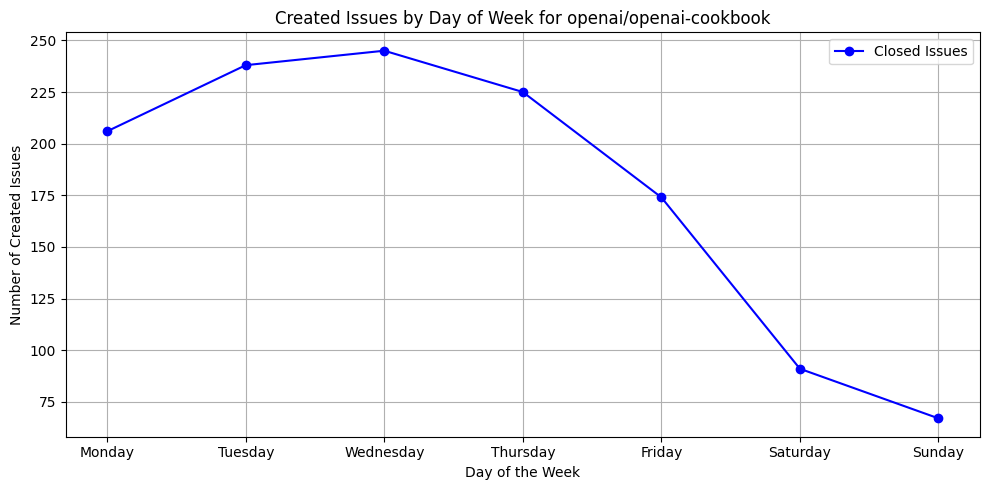

The day of the week maximum number of issues created on Tuesday for repository : elastic/elasticsearch


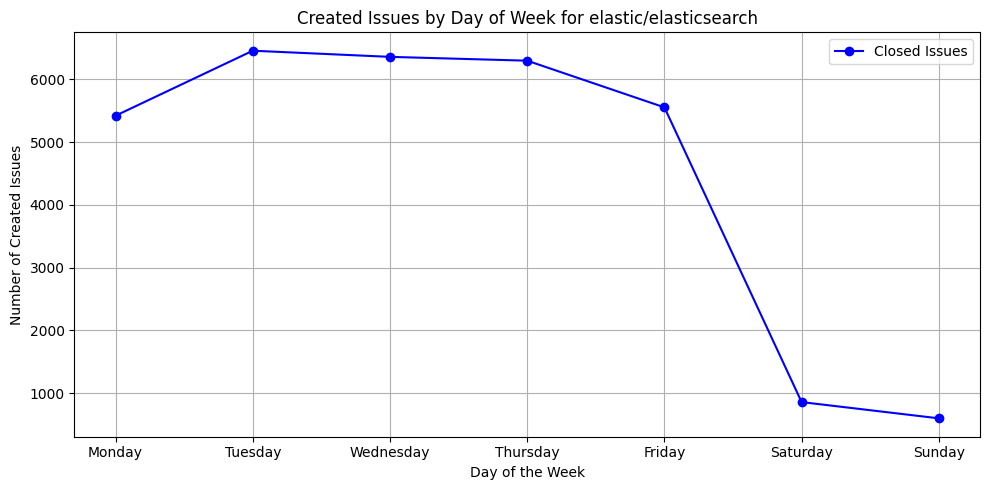

The day of the week maximum number of issues created on Wednesday for repository : milvus-io/pymilvus


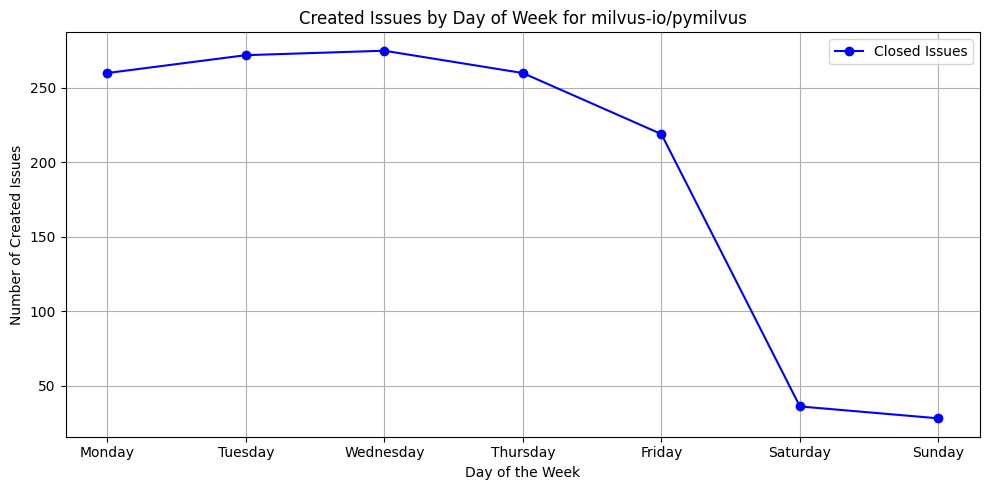

In [4]:
#Add your code for requirement 10.1 in this cell
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import statsmodels.api as smsapi
import pytz

weeksList = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()

issuesData = pd.read_csv('dataset/issues_all_repo.csv')

for i in issuesData['repository'].unique():
    repoBasedDf = issuesData[issuesData['repository'] == i].copy()
    
    repoBasedDf['created_at'] = pd.to_datetime(repoBasedDf['created_at'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['created_at'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['created_at'] >= oldDate) & (repoBasedDf['created_at'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('created_at').size().reset_index(name='count')

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = repoBasedDfBasedOnDate.set_index('created_at').reindex(allDates, fill_value=0).reset_index()
    newRepoData.rename(columns={'index': 'created_at'}, inplace=True)
    # newRepoData['created_at'] = pd.to_datetime(newRepoData['created_at'])
    newRepoData['week'] = pd.to_datetime(newRepoData['created_at']).dt.day_name()

    issuesDF = newRepoData.groupby('week')['count'].sum().reindex(weeksList, fill_value = 0)
    print(f"The day of the week maximum number of issues created on {issuesDF.idxmax()} for repository : {i}") 

    plt.figure(figsize=(10, 5))
    plt.plot(weeksList, issuesDF, marker='o', linestyle='-', color='b', label='Closed Issues')
    plt.title(f'Created Issues by Day of Week for {i}')
    plt.xlabel('Day of the Week')
    plt.ylabel('Number of Created Issues')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

<div class="alert alert-block alert-danger">   
    
#### REQ10-2). The day of the week maximum number of issues closed

</div>

The day of the week maximum number of issues closed on Wednesday for repository : meta-llama/llama3


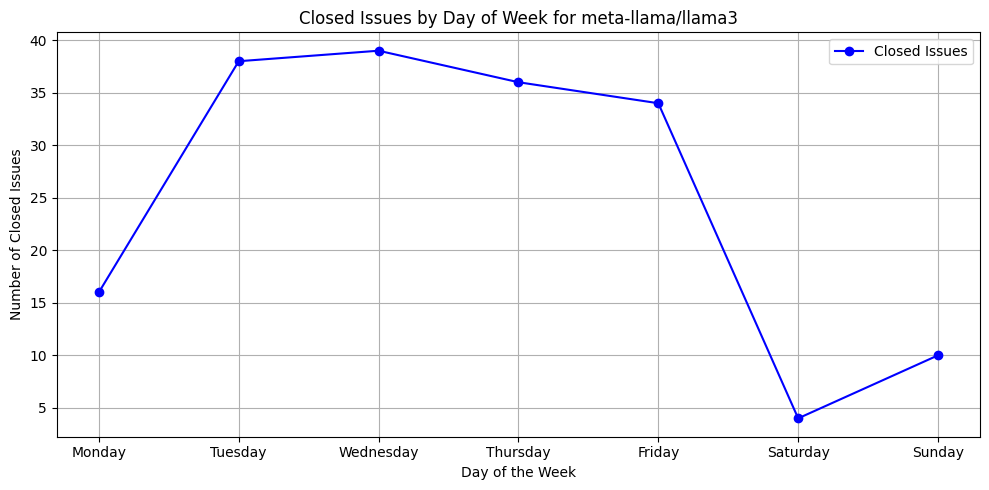

The day of the week maximum number of issues closed on Tuesday for repository : ollama/ollama


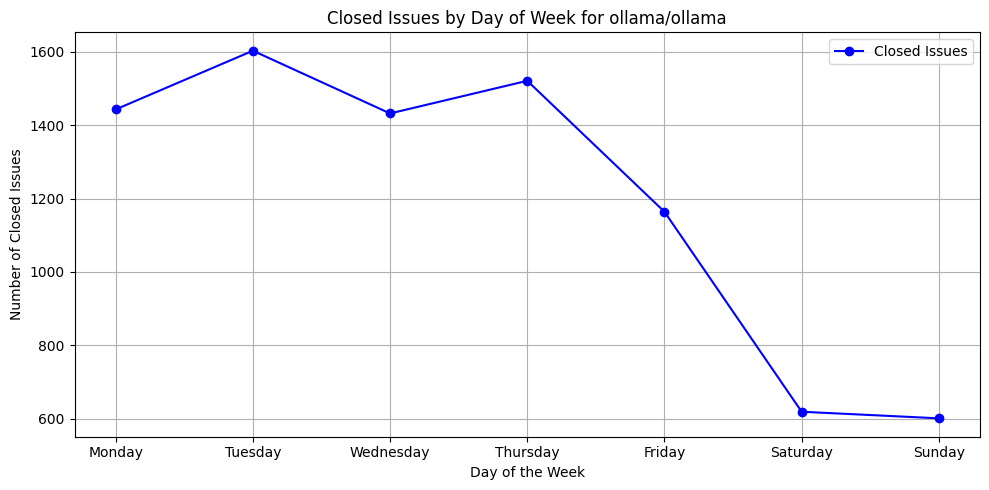

The day of the week maximum number of issues closed on Tuesday for repository : langchain-ai/langchain


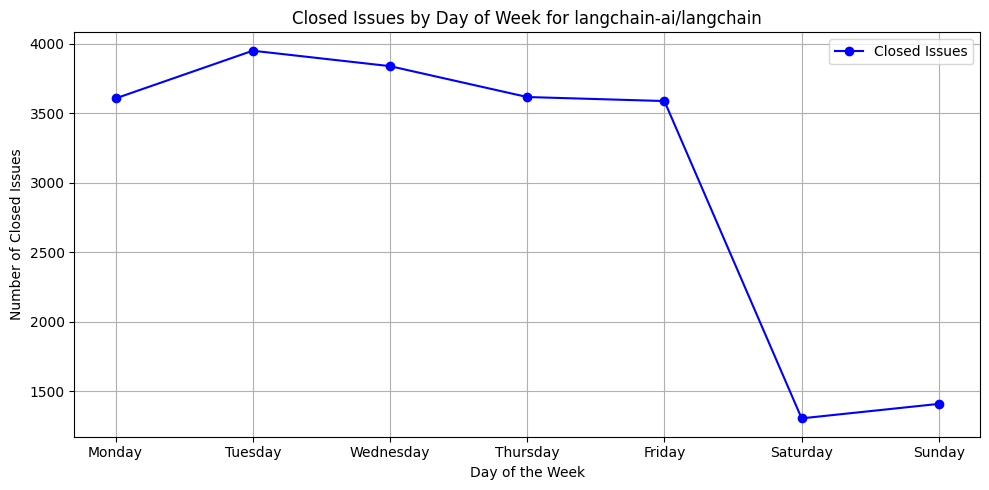

The day of the week maximum number of issues closed on Wednesday for repository : langchain-ai/langgraph


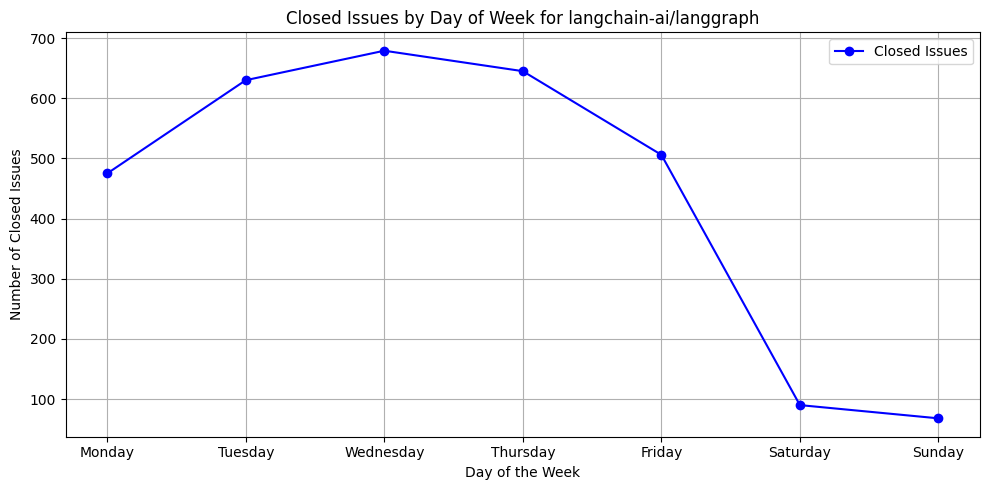

The day of the week maximum number of issues closed on Tuesday for repository : microsoft/autogen


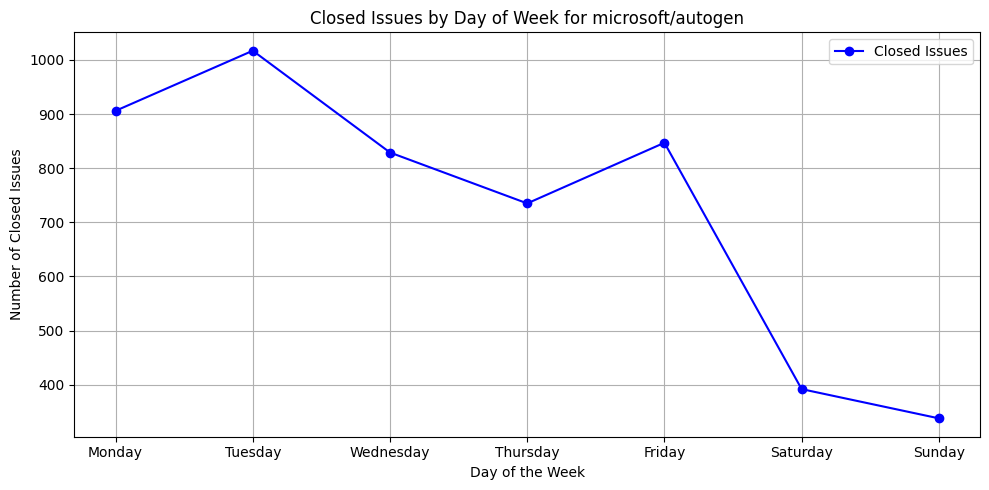

The day of the week maximum number of issues closed on Tuesday for repository : openai/openai-cookbook


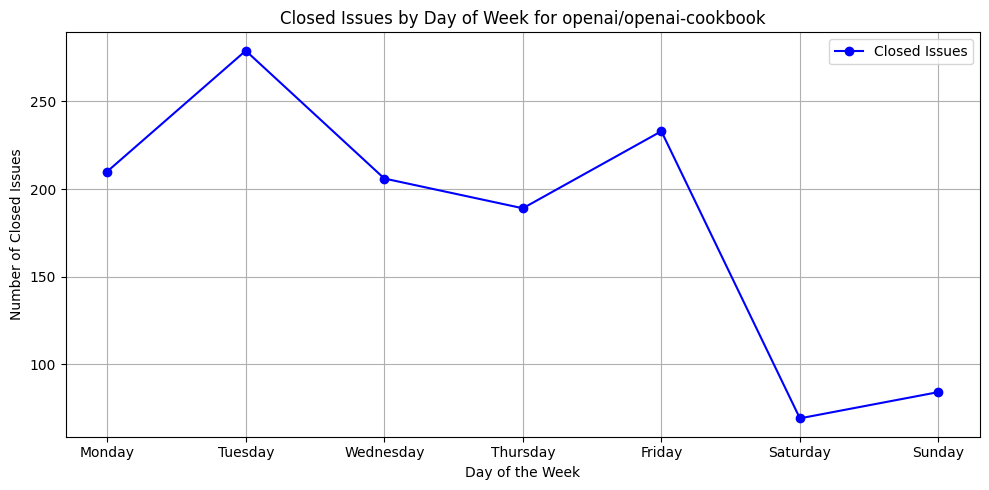

The day of the week maximum number of issues closed on Wednesday for repository : elastic/elasticsearch


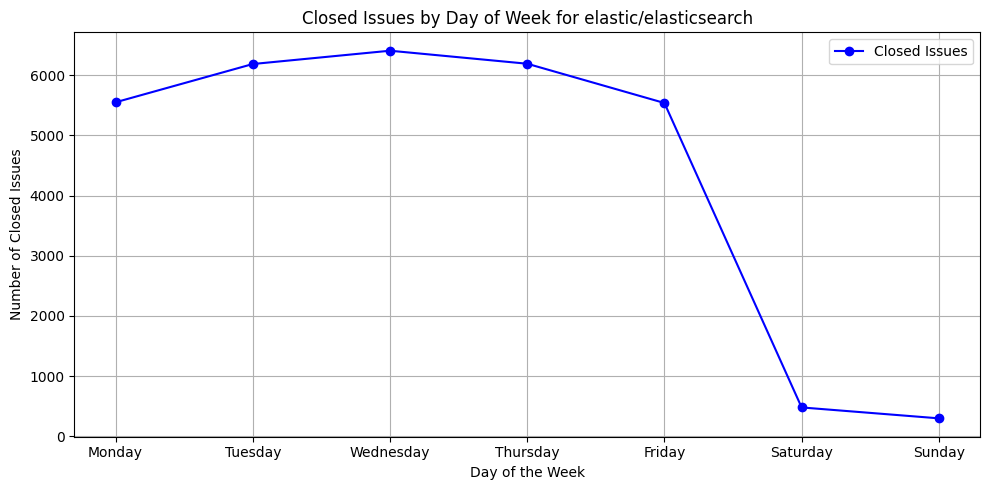

The day of the week maximum number of issues closed on Monday for repository : milvus-io/pymilvus


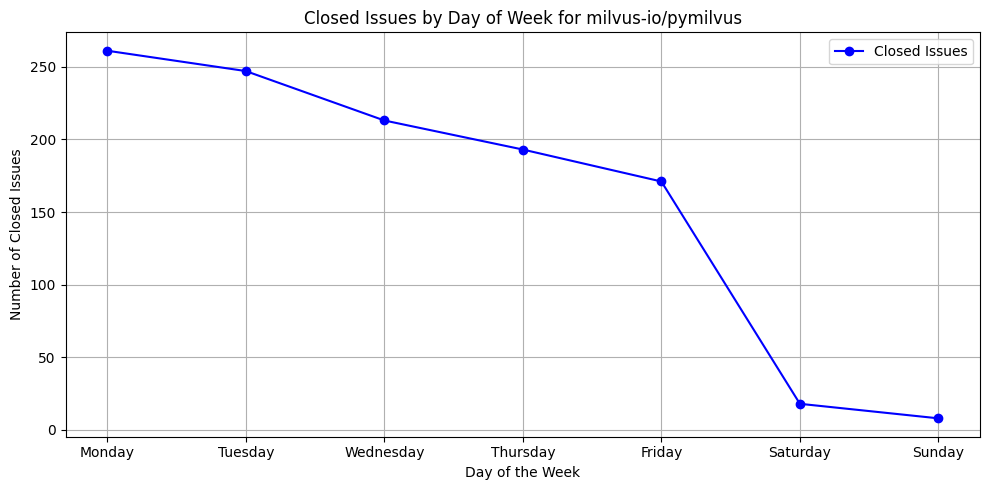

In [5]:
#Add your code for requirement 10.2 in this cell
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import statsmodels.api as smsapi
import pytz

weeksList = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()

issuesData = pd.read_csv('dataset/issues_all_repo.csv')

for i in issuesData['repository'].unique():
    repoBasedDf = issuesData[issuesData['repository'] == i].copy()
    
    repoBasedDf['closed_at'] = pd.to_datetime(repoBasedDf['closed_at'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset = ['closed_at'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['closed_at'] >= oldDate) & (repoBasedDf['closed_at'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('closed_at').size().reset_index(name='count')

    allDates = pd.date_range(start = oldDate, end = nowDate, freq='D')
    newRepoData = repoBasedDfBasedOnDate.set_index('closed_at').reindex(allDates, fill_value=0).reset_index()

    newRepoData.rename(columns={'index': 'closed_at'}, inplace = True)

    newRepoData['week'] = pd.to_datetime(newRepoData['closed_at']).dt.day_name()

    issuesDF = newRepoData.groupby('week')['count'].sum().reindex(weeksList, fill_value = 0)
    print(f"The day of the week maximum number of issues closed on {issuesDF.idxmax()} for repository : {i}") 

    plt.figure(figsize=(10, 5))
    plt.plot(weeksList, issuesDF, marker='o', linestyle='-', color='b', label='Closed Issues')
    plt.title(f'Closed Issues by Day of Week for {i}')
    plt.xlabel('Day of the Week')
    plt.ylabel('Number of Closed Issues')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

<div class="alert alert-block alert-danger">   
    
#### REQ10-3). The month of the year that has maximum number of issues closed


</div>

The month of the year maximum number of issues closed on April for repository : meta-llama/llama3


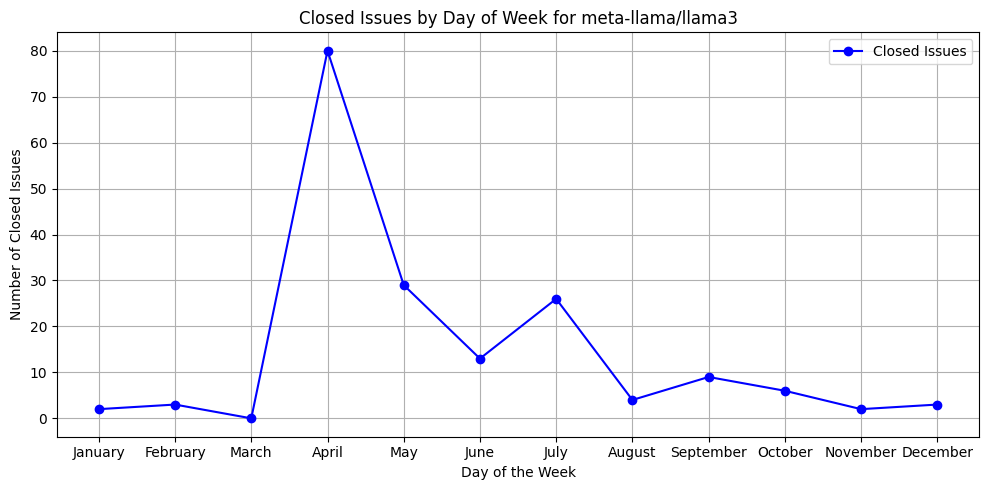

The month of the year maximum number of issues closed on March for repository : ollama/ollama


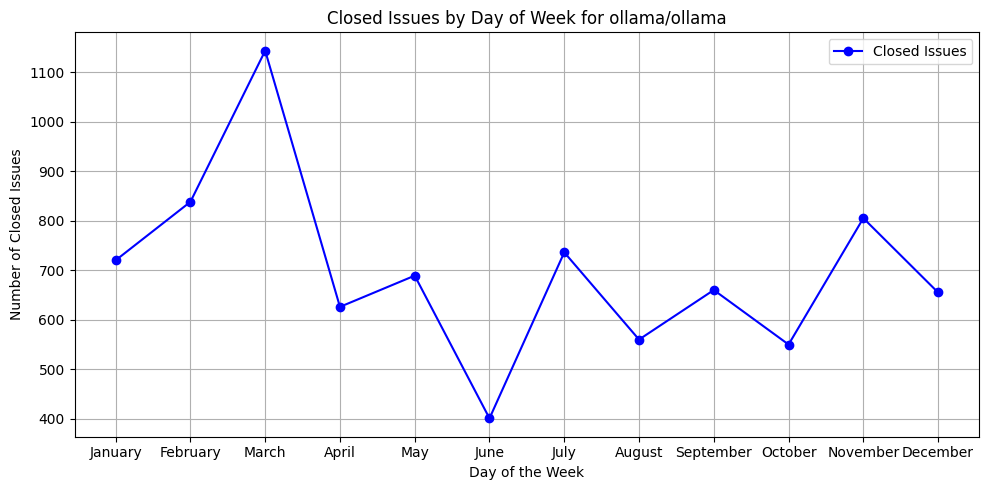

The month of the year maximum number of issues closed on September for repository : langchain-ai/langchain


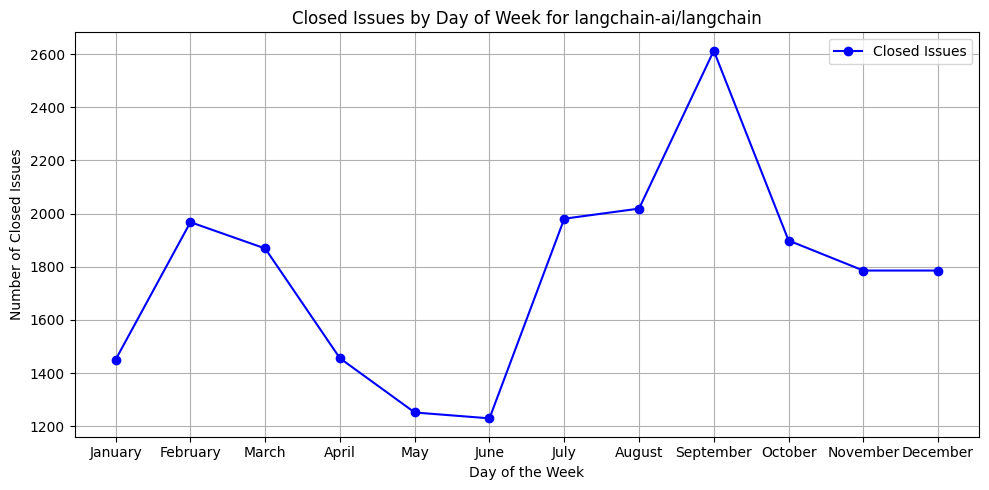

The month of the year maximum number of issues closed on March for repository : langchain-ai/langgraph


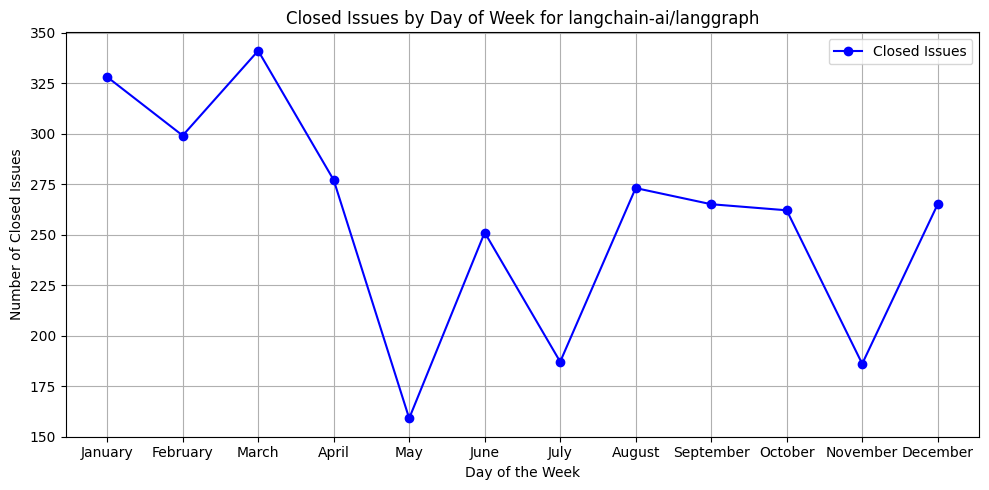

The month of the year maximum number of issues closed on February for repository : microsoft/autogen


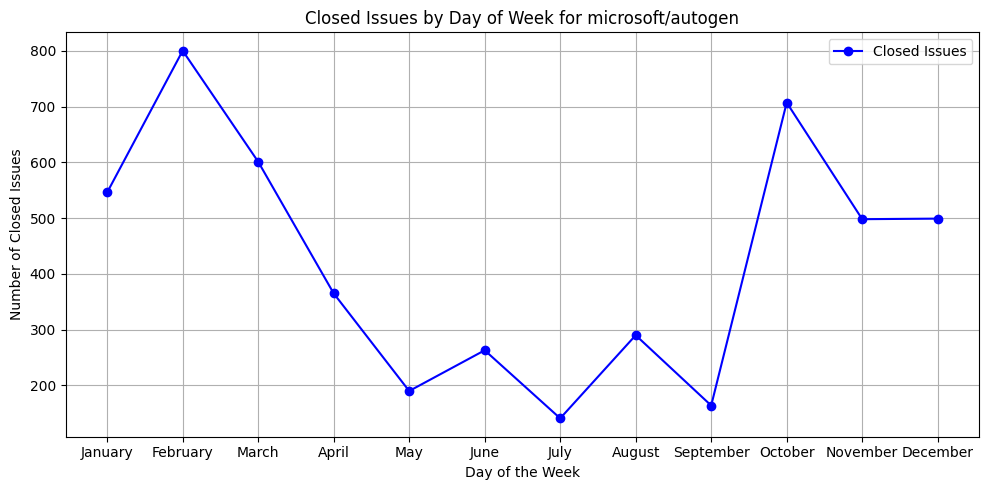

The month of the year maximum number of issues closed on September for repository : openai/openai-cookbook


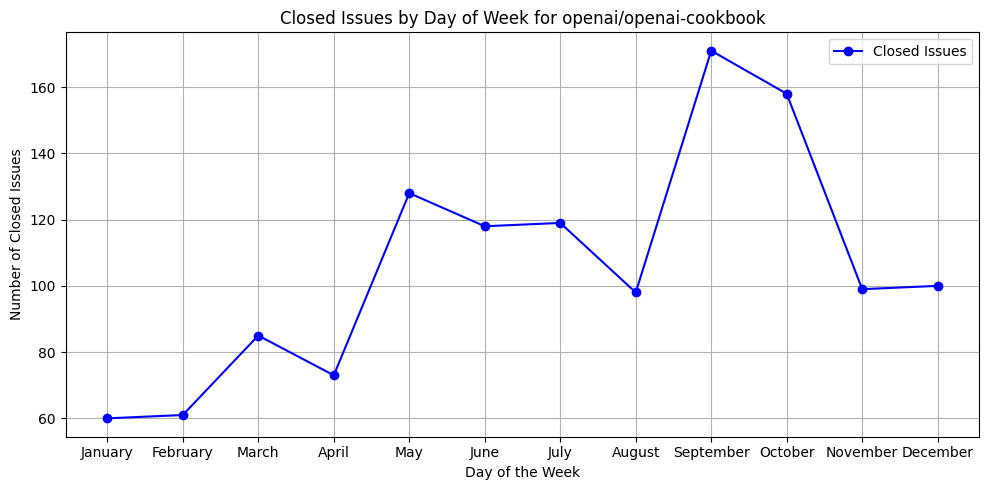

The month of the year maximum number of issues closed on October for repository : elastic/elasticsearch


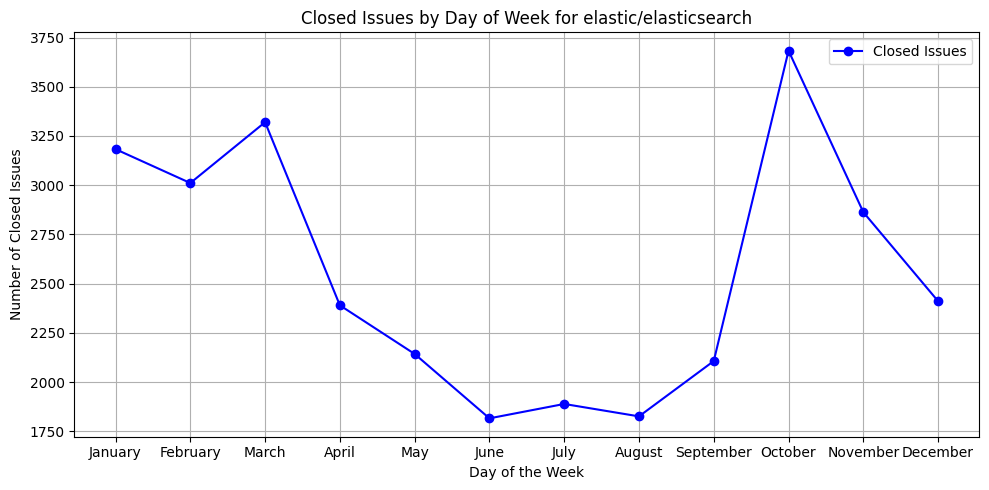

The month of the year maximum number of issues closed on December for repository : milvus-io/pymilvus


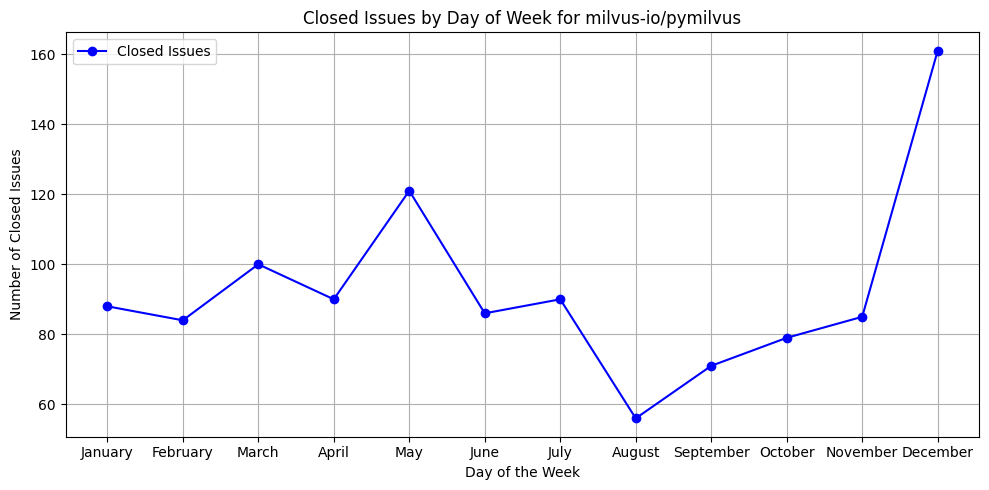

In [6]:
#Add your code for requirement 10.3 in this cell

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import statsmodels.api as smsapi
import pytz

monthsList = ['January', 'February', 'March', 'April', 'May', 'June',
              'July', 'August', 'September', 'October', 'November', 'December']

nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()

issuesData = pd.read_csv('dataset/issues_all_repo.csv')

for i in issuesData['repository'].unique():
    repoBasedDf = issuesData[issuesData['repository'] == i].copy()
    
    repoBasedDf['closed_at'] = pd.to_datetime(repoBasedDf['closed_at'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset = ['closed_at'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['closed_at'] >= oldDate) & (repoBasedDf['closed_at'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('closed_at').size().reset_index(name='count')

    allDates = pd.date_range(start = oldDate, end = nowDate, freq='D')
    newRepoData = repoBasedDfBasedOnDate.set_index('closed_at').reindex(allDates, fill_value=0).reset_index()

    newRepoData.rename(columns={'index': 'closed_at'}, inplace = True)

    newRepoData['month'] = pd.to_datetime(newRepoData['closed_at']).dt.month_name()

    issuesDF = newRepoData.groupby('month')['count'].sum().reindex(monthsList, fill_value = 0)
    print(f"The month of the year maximum number of issues closed on {issuesDF.idxmax()} for repository : {i}") 

    plt.figure(figsize=(10, 5))
    plt.plot(monthsList, issuesDF, marker='o', linestyle='-', color='b', label='Closed Issues')
    plt.title(f'Closed Issues by Day of Week for {i}')
    plt.xlabel('Day of the Week')
    plt.ylabel('Number of Closed Issues')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

<div class="alert alert-block alert-danger">   
    
#### REQ10-4). Plot the created issues forecast

</div>

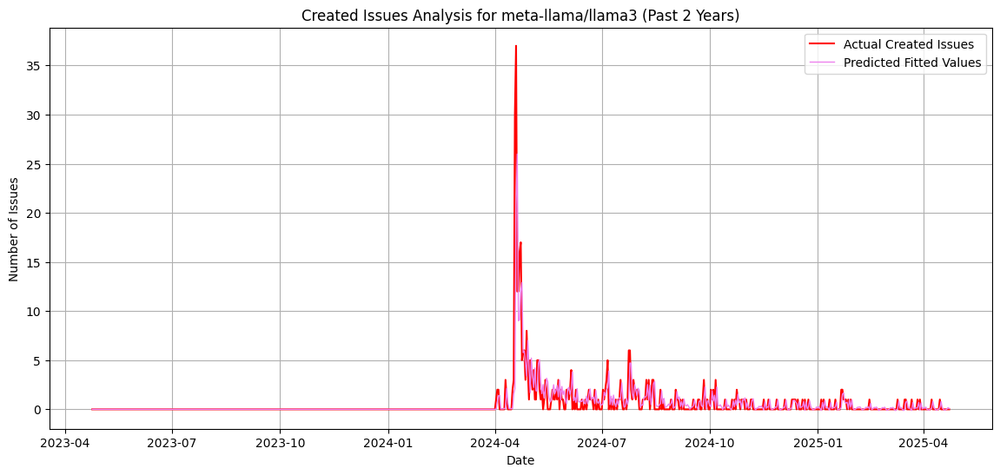

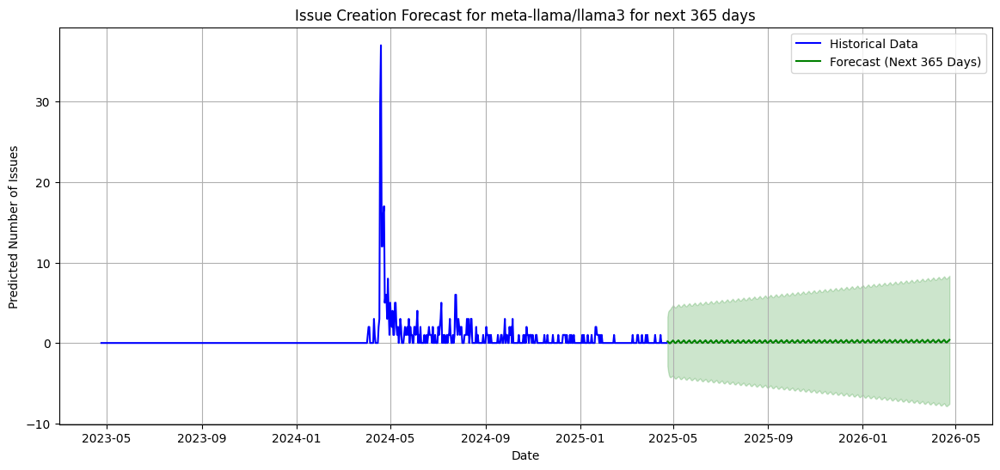

------------------------------------------------------------------------


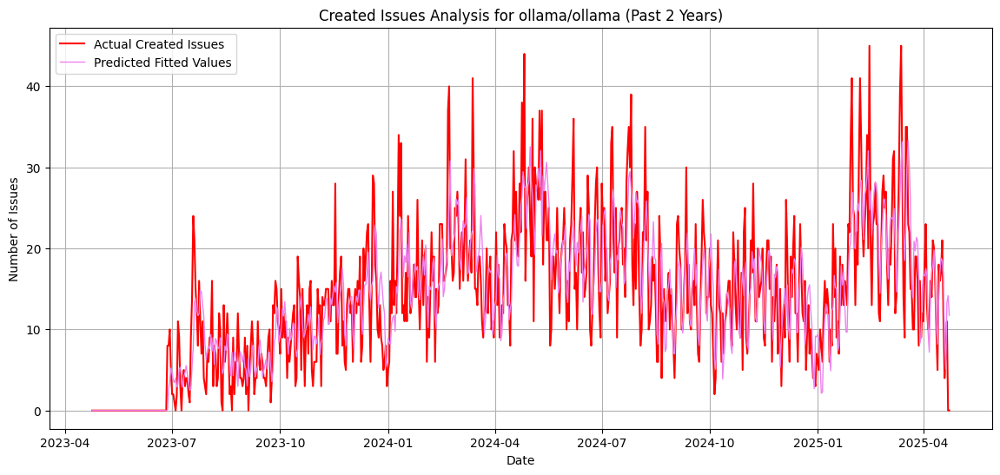

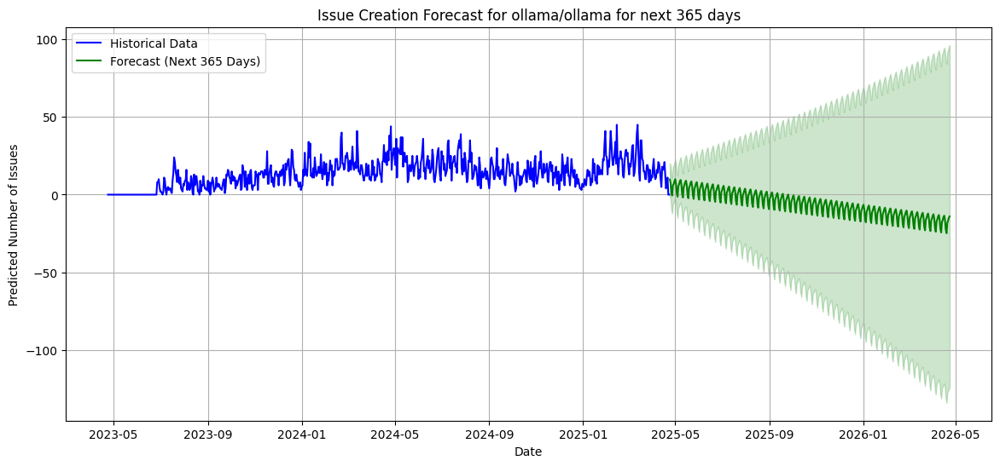

------------------------------------------------------------------------


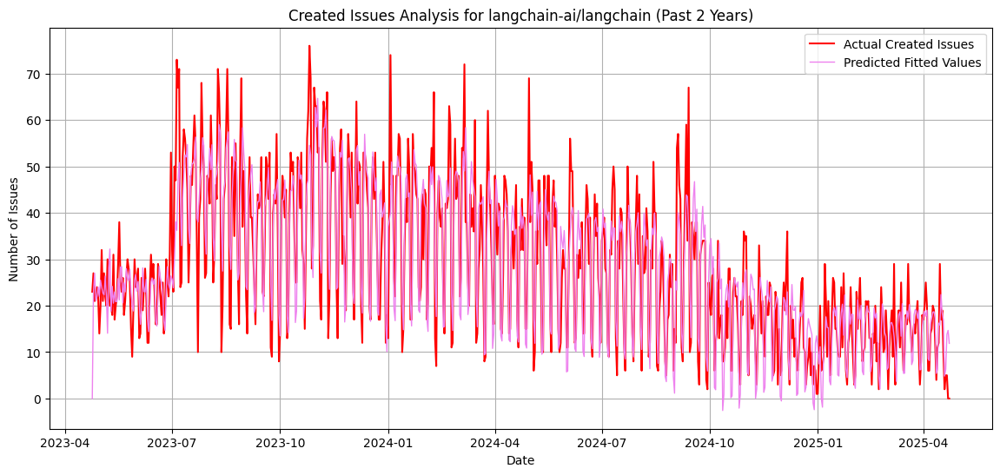

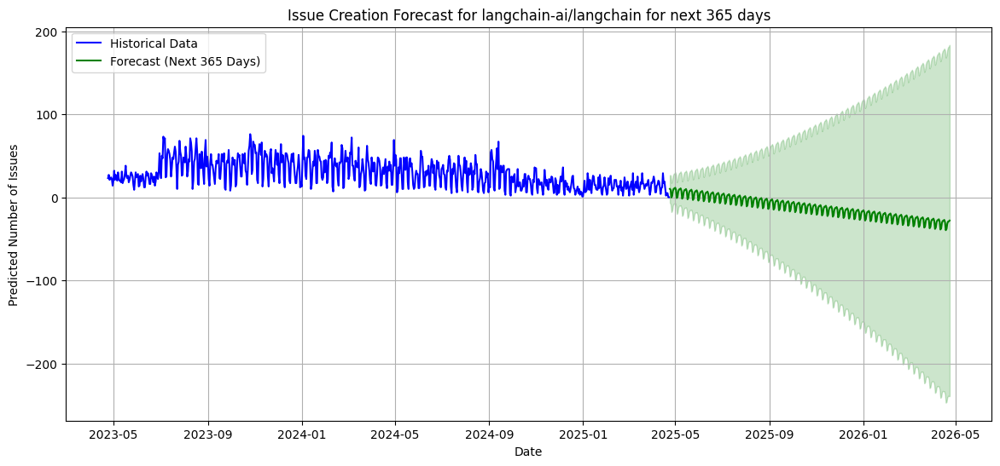

------------------------------------------------------------------------


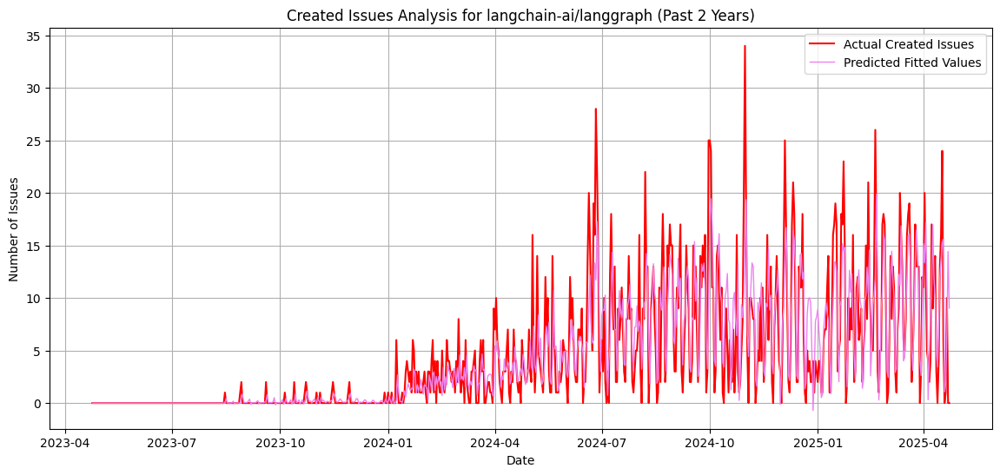

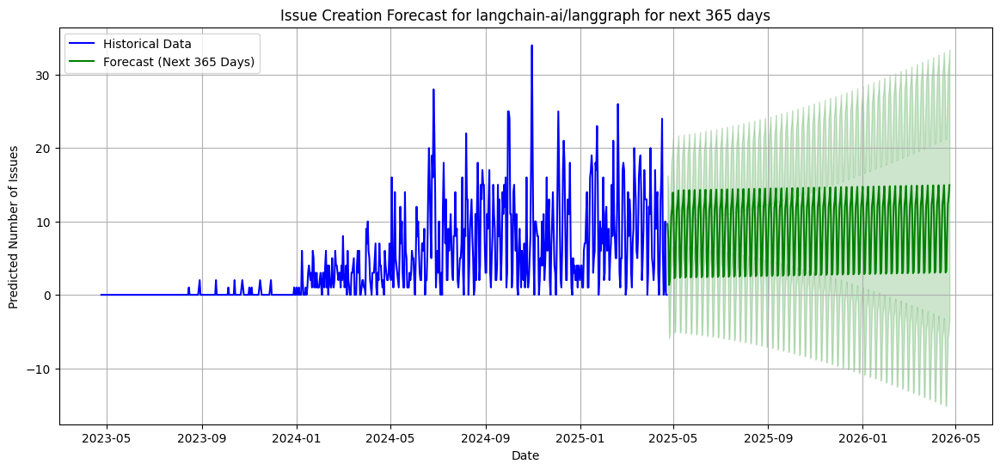

------------------------------------------------------------------------


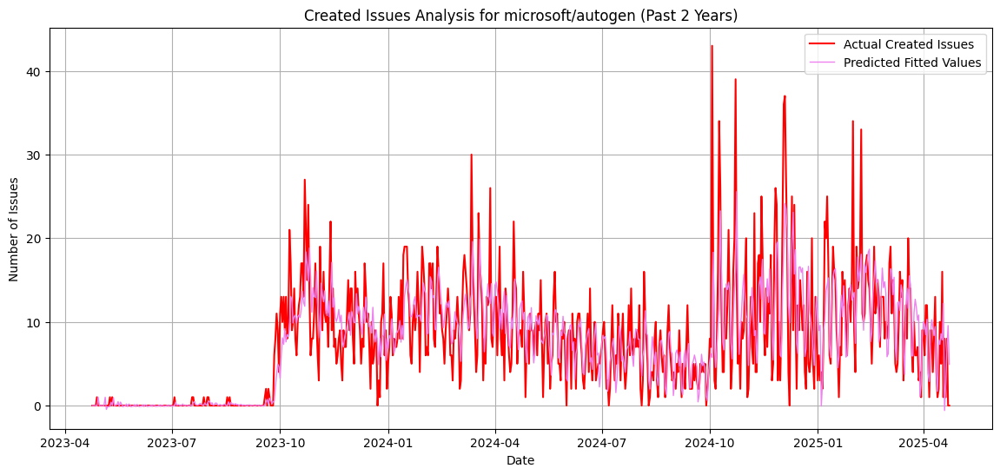

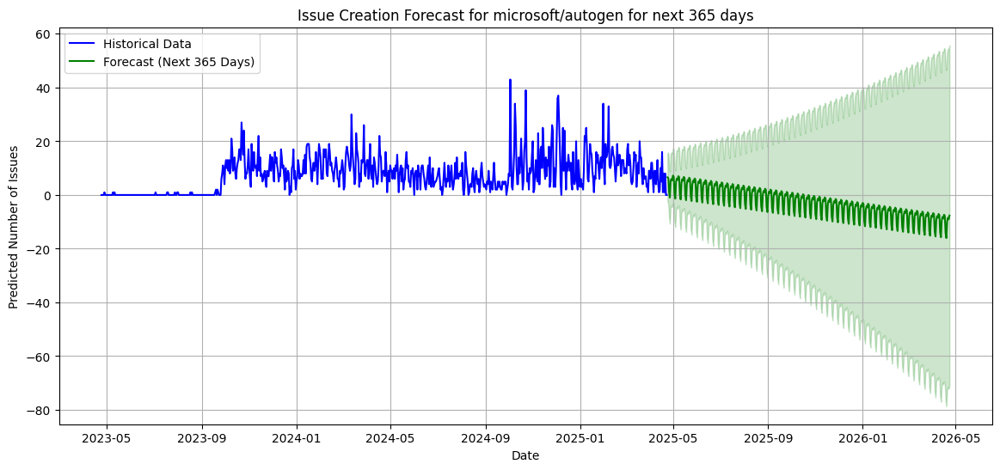

------------------------------------------------------------------------


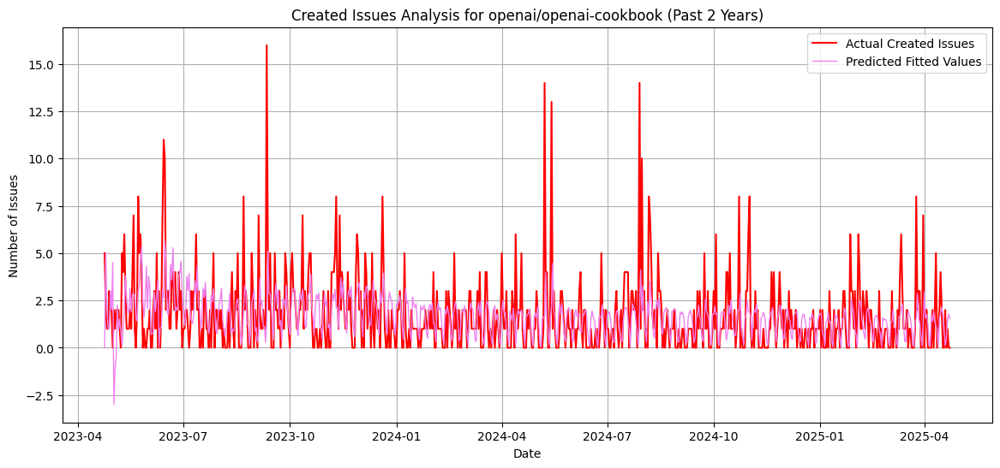

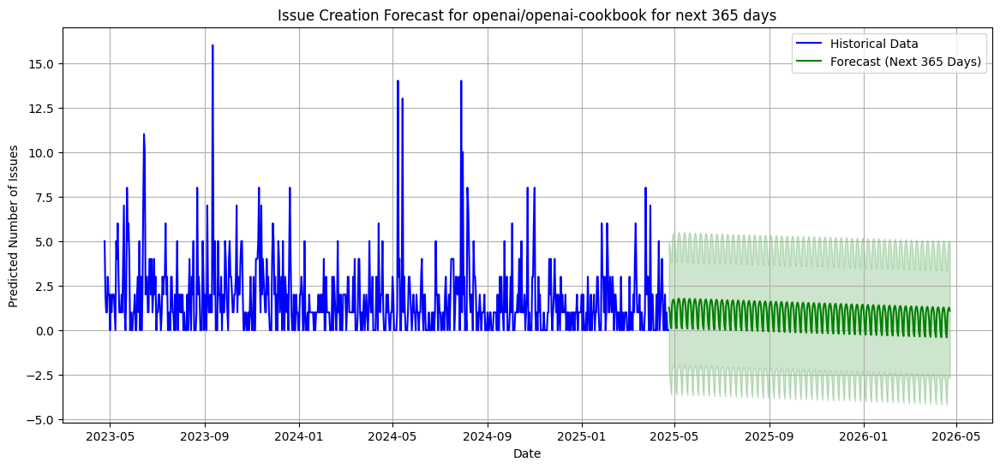

------------------------------------------------------------------------


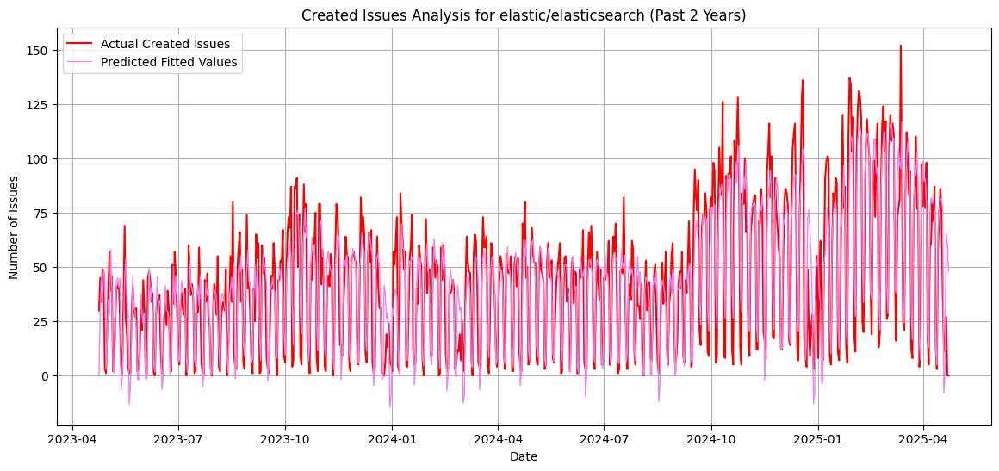

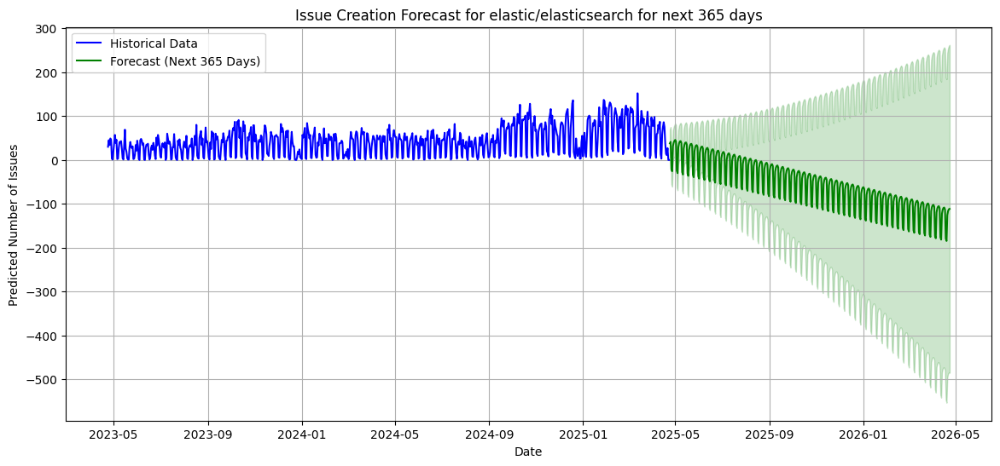

------------------------------------------------------------------------


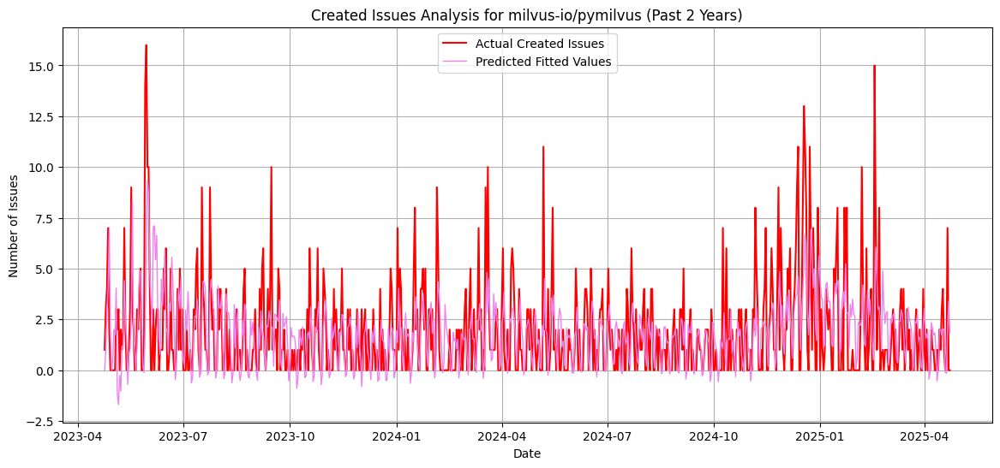

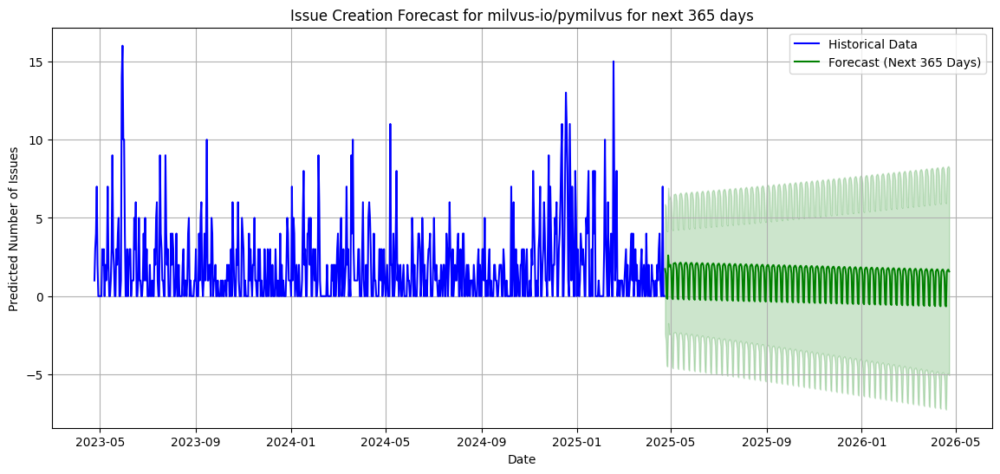

------------------------------------------------------------------------


In [2]:
#Add your code for requirement 10.4 in this cell

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import statsmodels.api as smsapi
import pytz


nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()  # Past 2 years

issuesData = pd.read_csv('dataset/issues_all_repo.csv')

for i in issuesData['repository'].unique():
    repoBasedDf = issuesData[issuesData['repository'] == i].copy()
    repoBasedDf['created_at'] = pd.to_datetime(repoBasedDf['created_at'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['created_at'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['created_at'] >= oldDate) & (repoBasedDf['created_at'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('created_at').size().reset_index(name='count')

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = repoBasedDfBasedOnDate.set_index('created_at').reindex(allDates, fill_value=0).reset_index()
    newRepoData.rename(columns={'index': 'created_at'}, inplace=True)

    model = smsapi.tsa.statespace.SARIMAX(newRepoData['count'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
    fitted = model.fit(disp=False)
    newRepoData['fitValues'] = fitted.fittedvalues

    plt.figure(figsize=(14, 6))
    plt.plot(newRepoData['created_at'], newRepoData['count'], label='Actual Created Issues', color='red')
    plt.plot(newRepoData['created_at'], newRepoData['fitValues'], label='Predicted Fitted Values', color='violet', linewidth=1)
    plt.title(f"Created Issues Analysis for {i} (Past 2 Years)")
    plt.xlabel("Date")
    plt.ylabel("Number of Issues")
    plt.legend()
    plt.grid()
    plt.show()

    forecast_steps = 365
    forecast = fitted.get_forecast(steps=forecast_steps)
    forecast_values = forecast.predicted_mean
    forecast_ci = forecast.conf_int()

    last_date = newRepoData['created_at'].iloc[-1]
    future_dates = pd.date_range(start=last_date + timedelta(days=1), periods=forecast_steps)

    plt.figure(figsize=(14, 6))
    plt.plot(newRepoData['created_at'], newRepoData['count'], label='Historical Data', color='blue')
    plt.plot(future_dates, forecast_values, label='Forecast (Next 365 Days)', color='green')
    plt.fill_between(future_dates, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='green', alpha=0.2)
    plt.title(f"Issue Creation Forecast for {i} for next 365 days")
    plt.xlabel("Date")
    plt.ylabel("Predicted Number of Issues")
    plt.legend()
    plt.grid()
    plt.show()

    print("------------------------------------------------------------------------")

<div class="alert alert-block alert-danger">   
    
#### REQ10-5). Plot the closed issues forecast

</div>

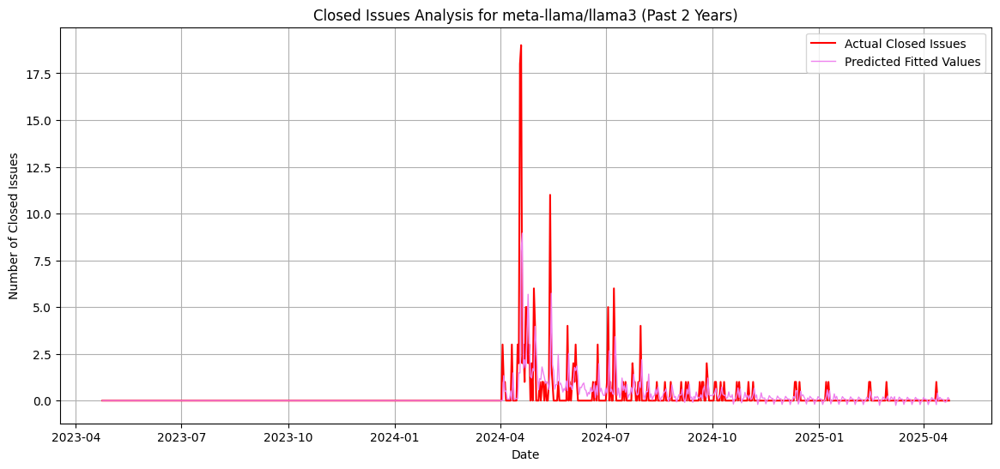

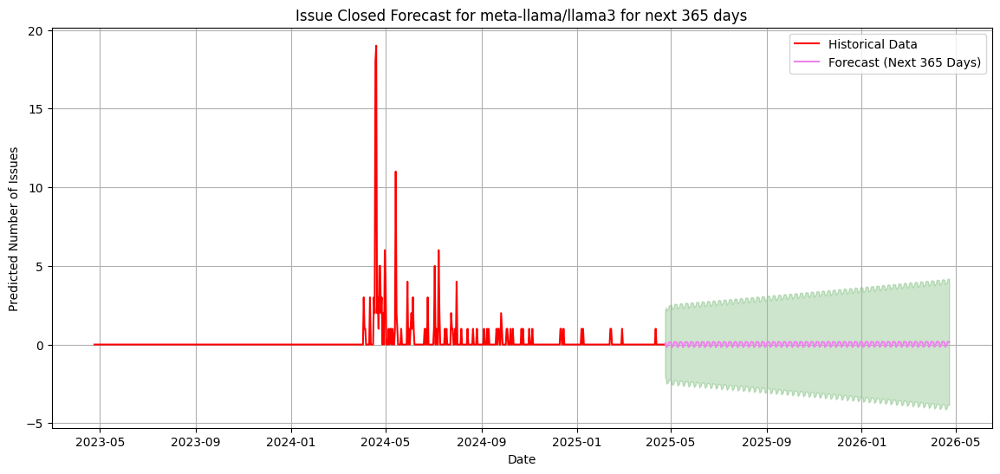

------------------------------------------------------------------------


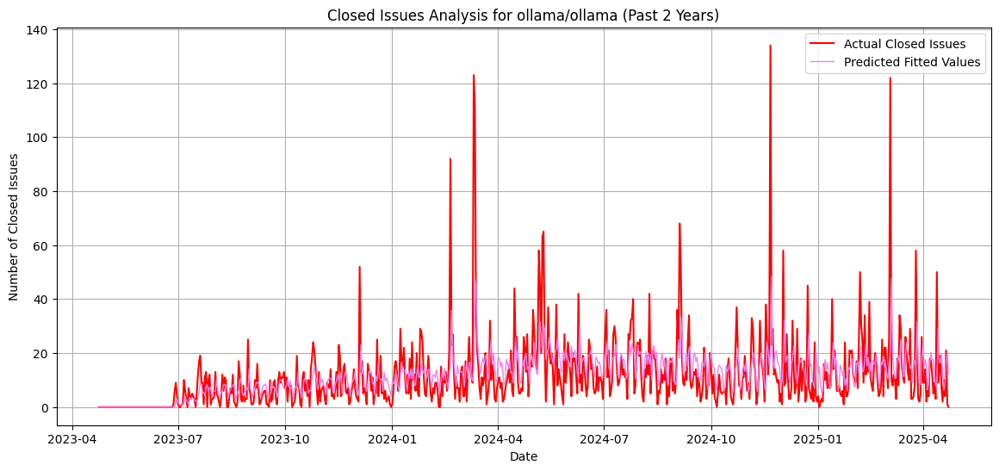

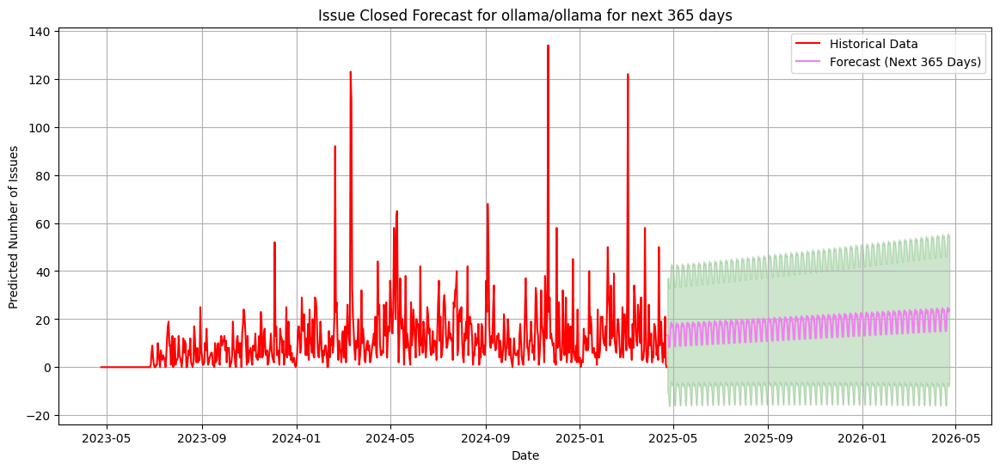

------------------------------------------------------------------------


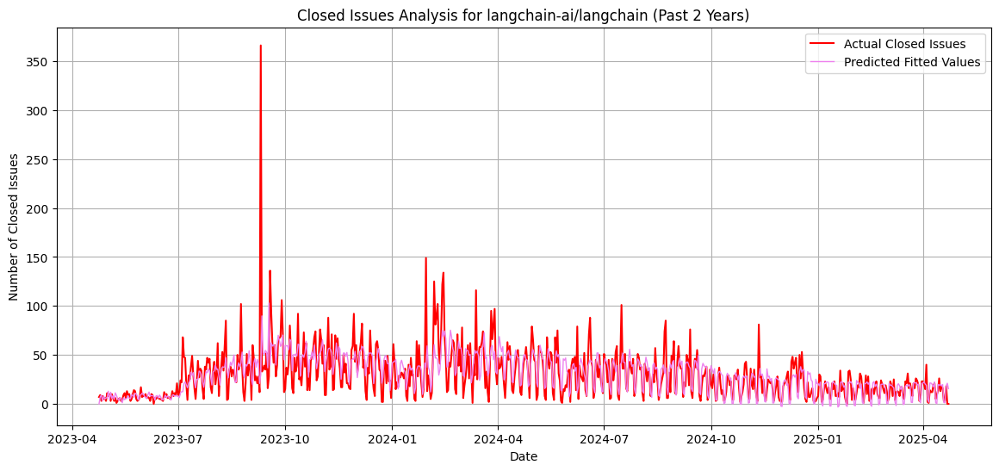

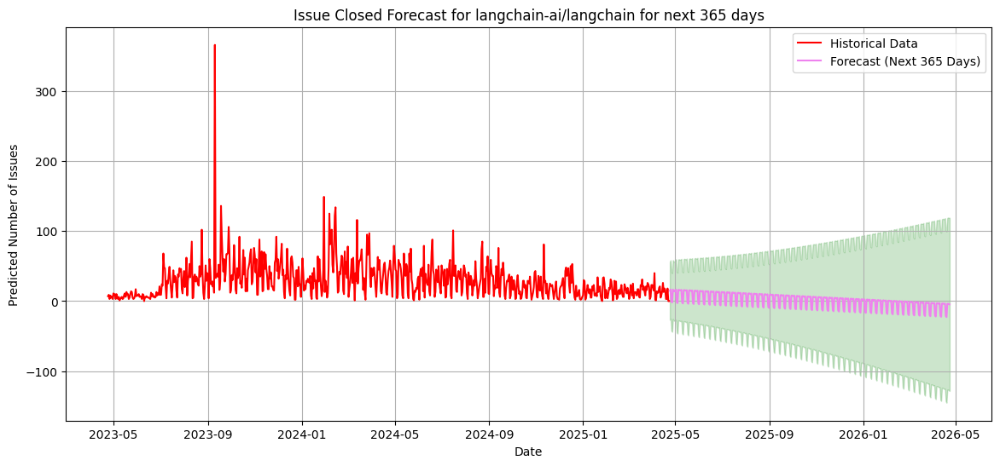

------------------------------------------------------------------------


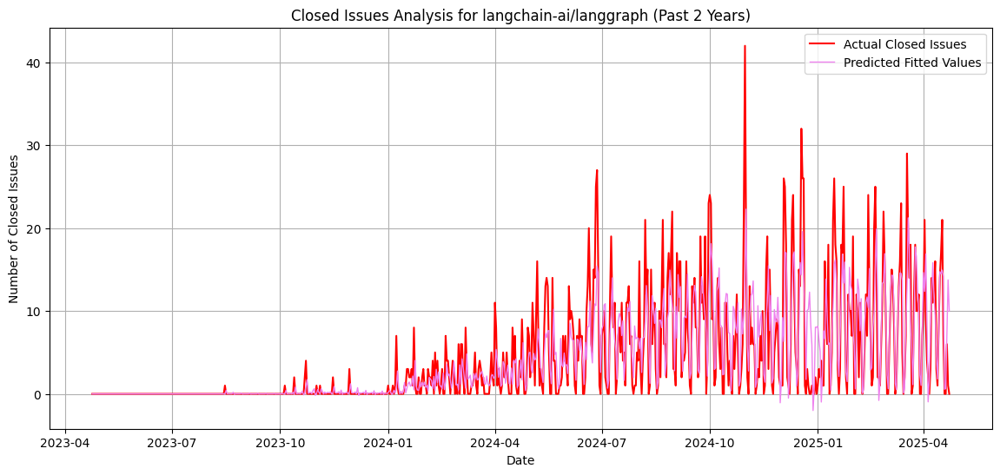

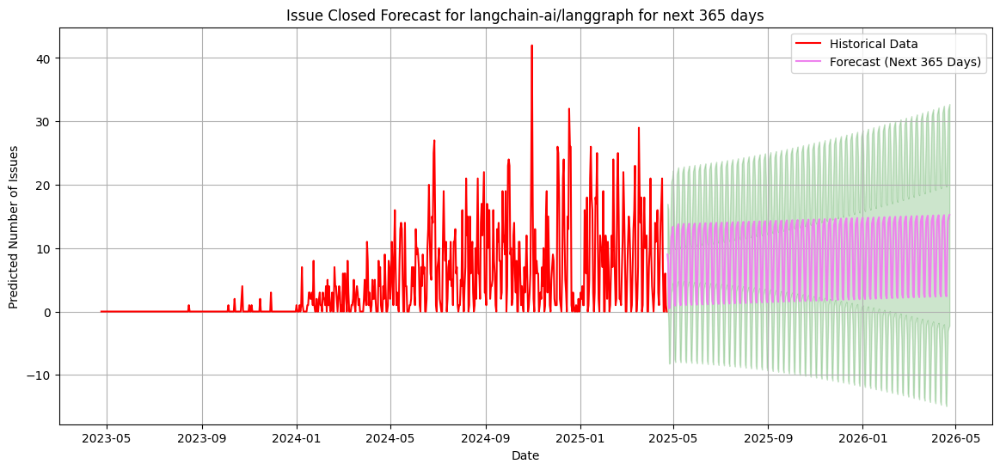

------------------------------------------------------------------------


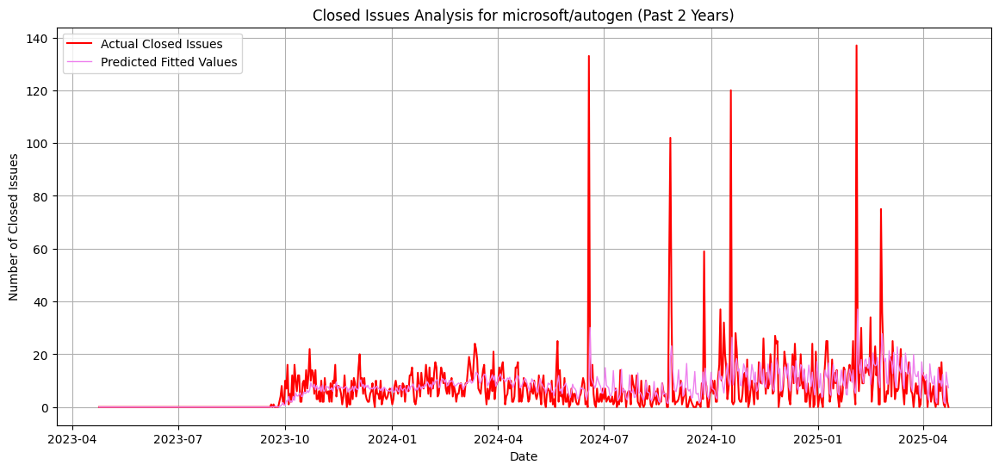

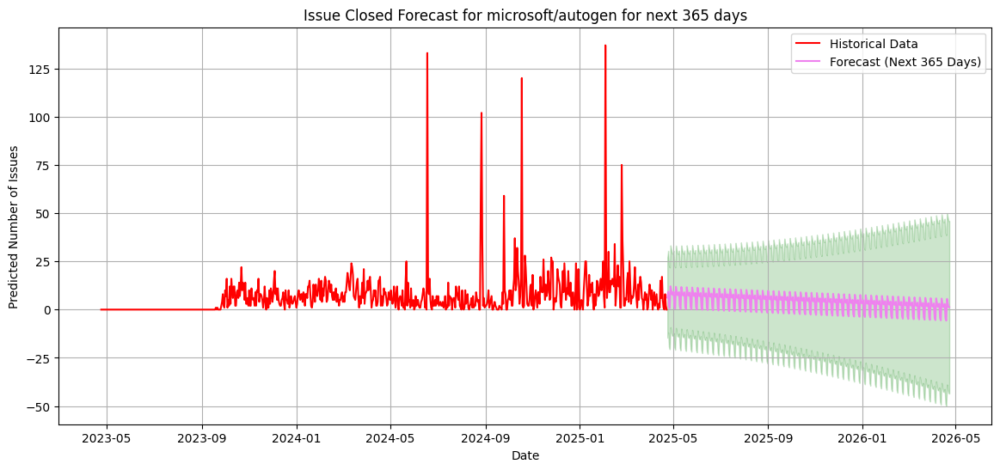

------------------------------------------------------------------------


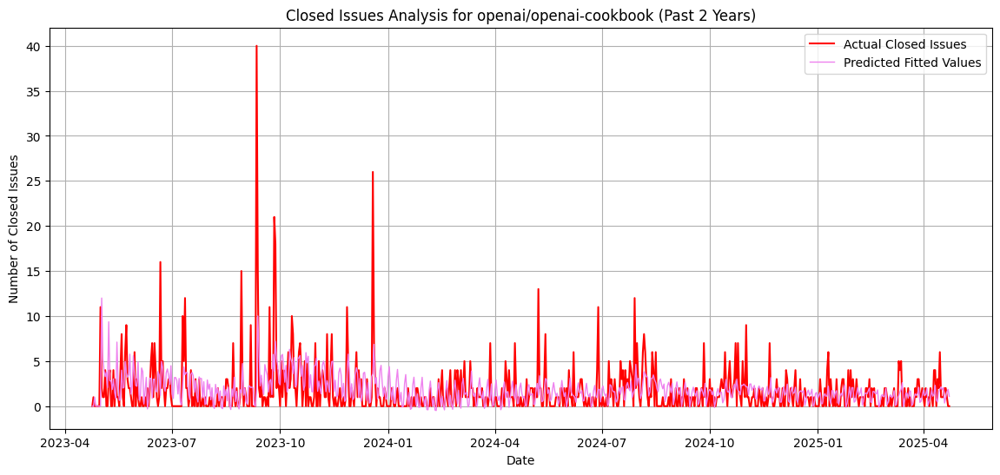

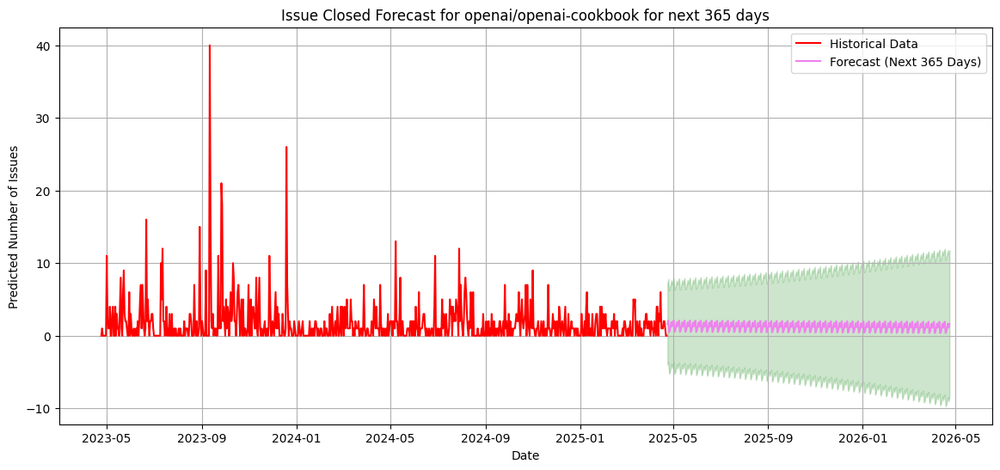

------------------------------------------------------------------------


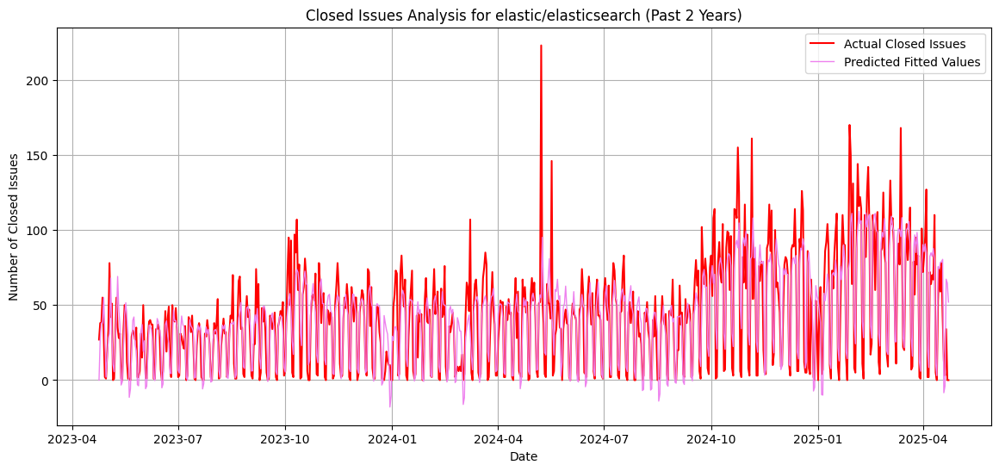

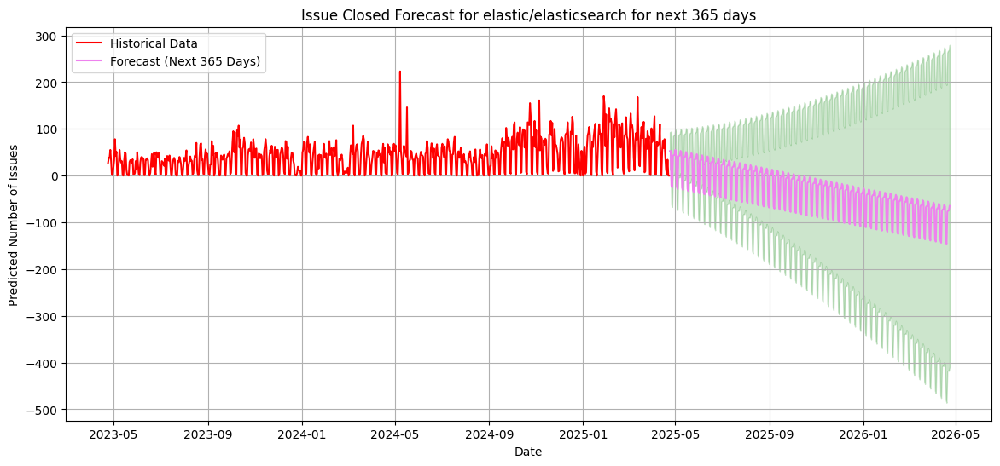

------------------------------------------------------------------------


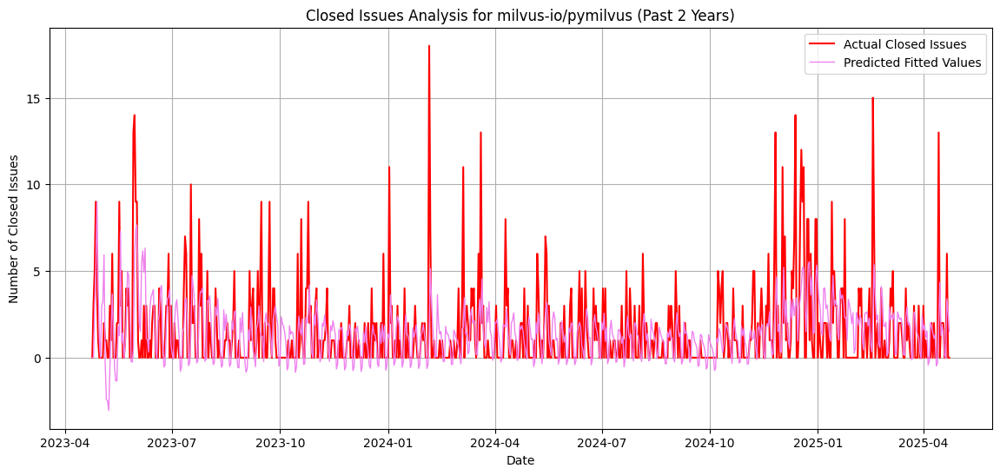

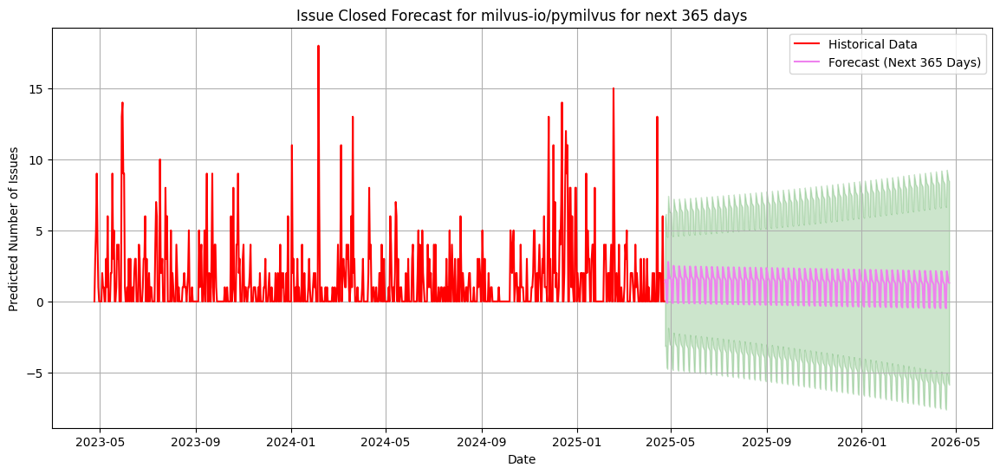

------------------------------------------------------------------------


In [4]:
#Add your code for requirement 10.5 in this cell

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import statsmodels.api as smsapi
import pytz


nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()  # Past 2 years

issuesData = pd.read_csv('dataset/issues_all_repo.csv')

for i in issuesData['repository'].unique():
    repoBasedDf = issuesData[issuesData['repository'] == i].copy()
    repoBasedDf['closed_at'] = pd.to_datetime(repoBasedDf['closed_at'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['closed_at'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['closed_at'] >= oldDate) & (repoBasedDf['closed_at'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('closed_at').size().reset_index(name='count')

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = repoBasedDfBasedOnDate.set_index('closed_at').reindex(allDates, fill_value=0).reset_index()
    newRepoData.rename(columns={'index': 'closed_at'}, inplace=True)

    model = smsapi.tsa.statespace.SARIMAX(newRepoData['count'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
    fitted = model.fit(disp=False)
    newRepoData['fitValues'] = fitted.fittedvalues

    plt.figure(figsize=(14, 6))
    plt.plot(newRepoData['closed_at'], newRepoData['count'], label='Actual Closed Issues', color='red')
    plt.plot(newRepoData['closed_at'], newRepoData['fitValues'], label='Predicted Fitted Values', color='violet', linewidth=1)
    plt.title(f"Closed Issues Analysis for {i} (Past 2 Years)")
    plt.xlabel("Date")
    plt.ylabel("Number of Closed Issues")
    plt.legend()
    plt.grid()
    plt.show()

    forecast_steps = 365
    forecast = fitted.get_forecast(steps=forecast_steps)
    forecast_values = forecast.predicted_mean
    forecast_ci = forecast.conf_int()

    last_date = newRepoData['closed_at'].iloc[-1]
    future_dates = pd.date_range(start=last_date + timedelta(days=1), periods=forecast_steps)

    plt.figure(figsize=(14, 6))
    plt.plot(newRepoData['closed_at'], newRepoData['count'], label='Historical Data', color='red')
    plt.plot(future_dates, forecast_values, label='Forecast (Next 365 Days)', color='violet')
    plt.fill_between(future_dates, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='green', alpha=0.2)
    plt.title(f"Issue Closed Forecast for {i} for next 365 days")
    plt.xlabel("Date")
    plt.ylabel("Predicted Number of Issues")
    plt.legend()
    plt.grid()
    plt.show()

    print("------------------------------------------------------------------------")

<div class="alert alert-block alert-danger">   
    
#### REQ10-6). Plot the pulls forecast

</div>

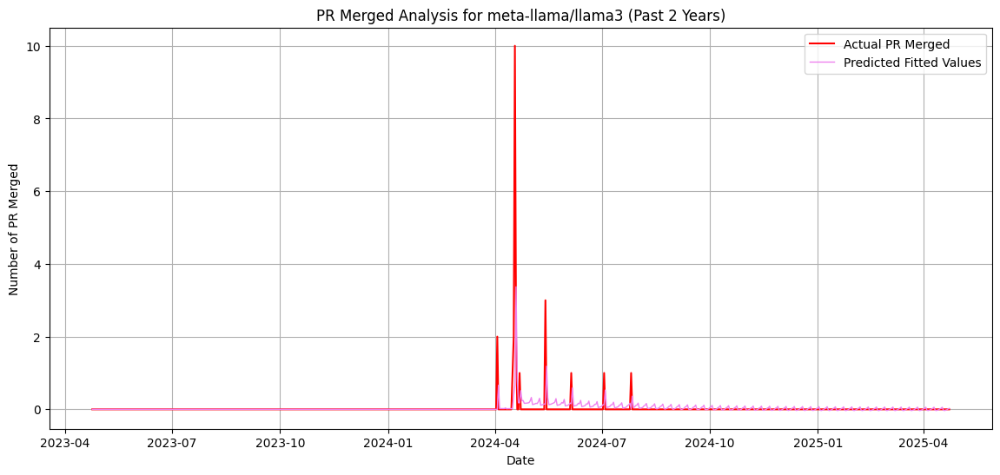

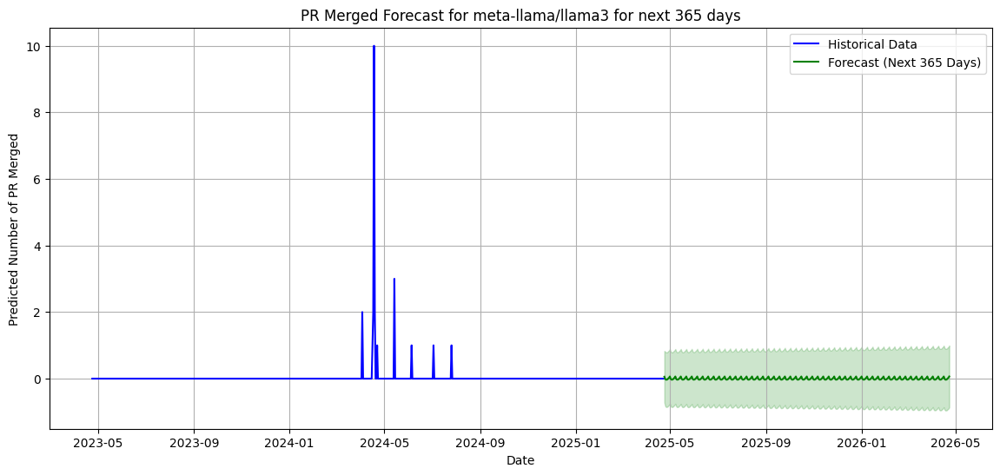

------------------------------------------------------------------------


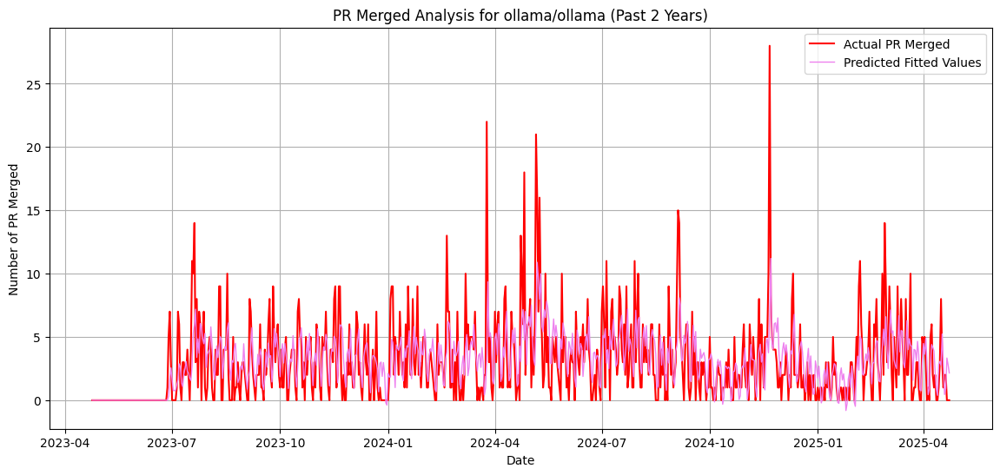

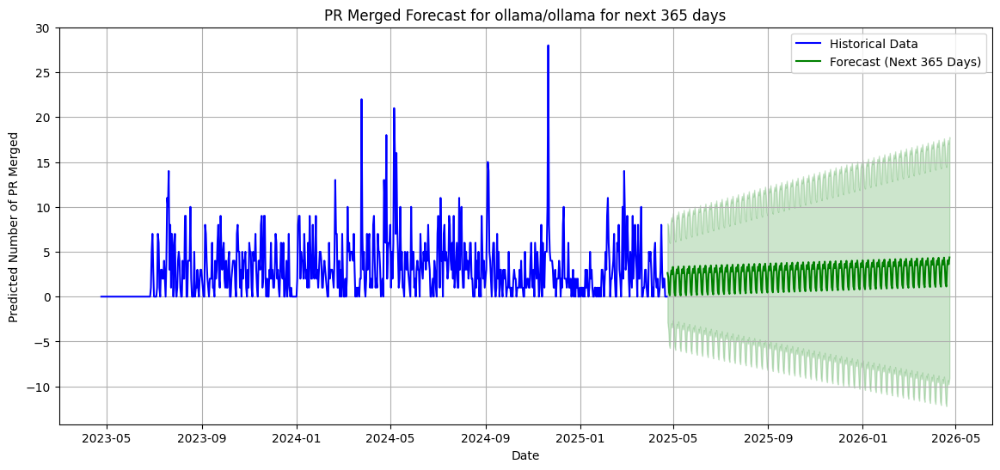

------------------------------------------------------------------------


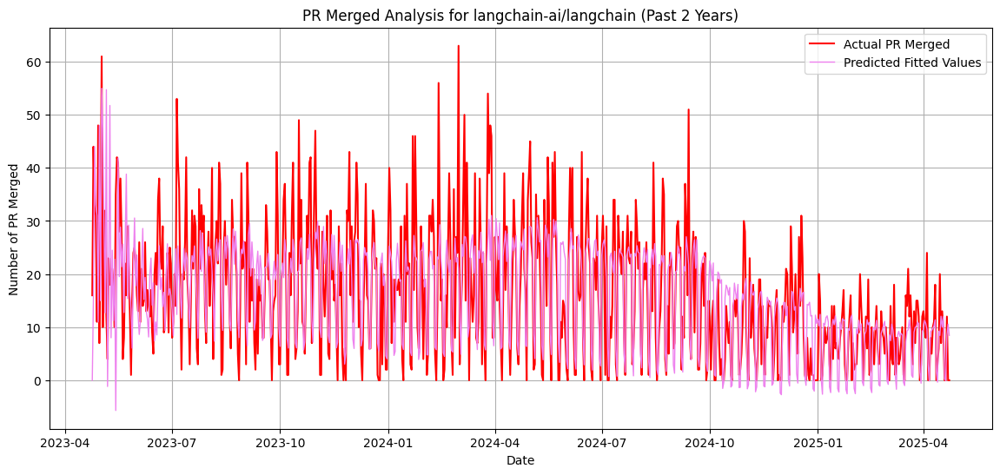

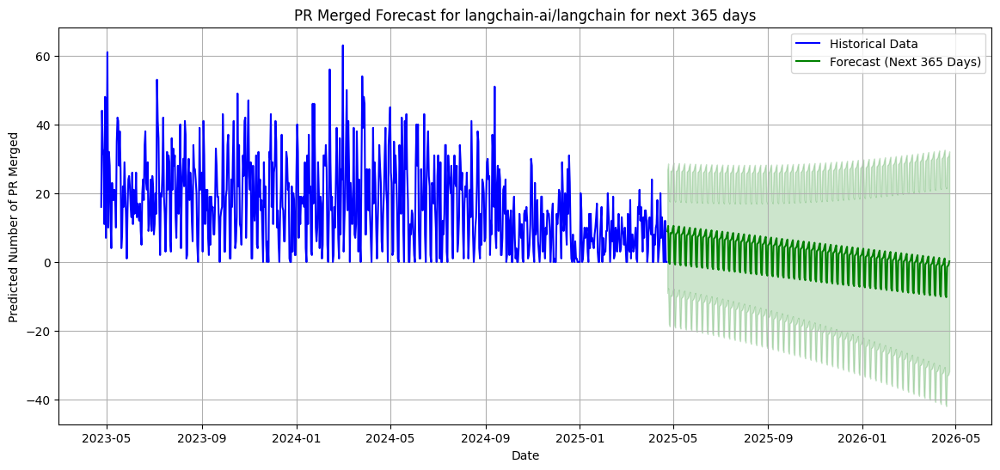

------------------------------------------------------------------------


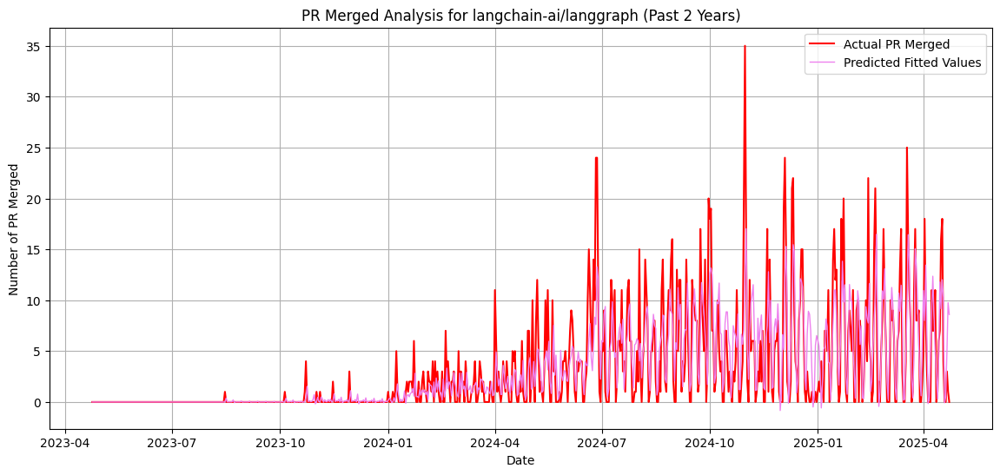

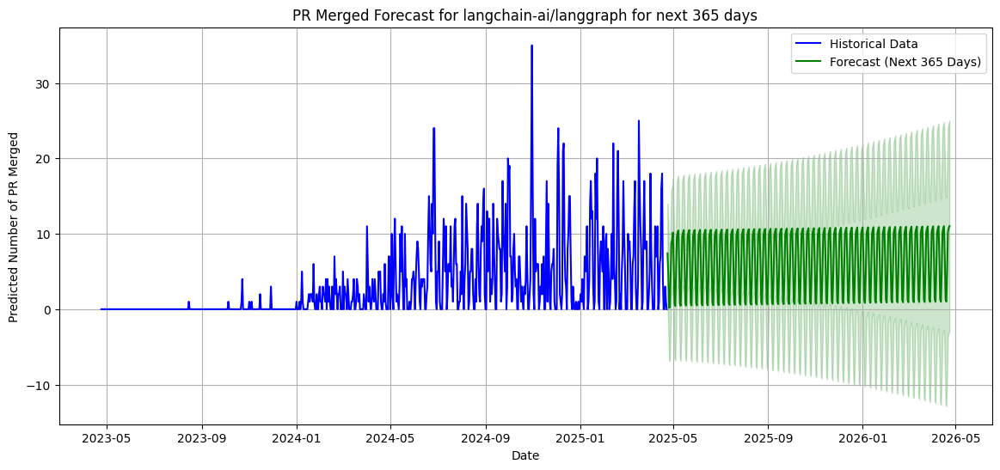

------------------------------------------------------------------------


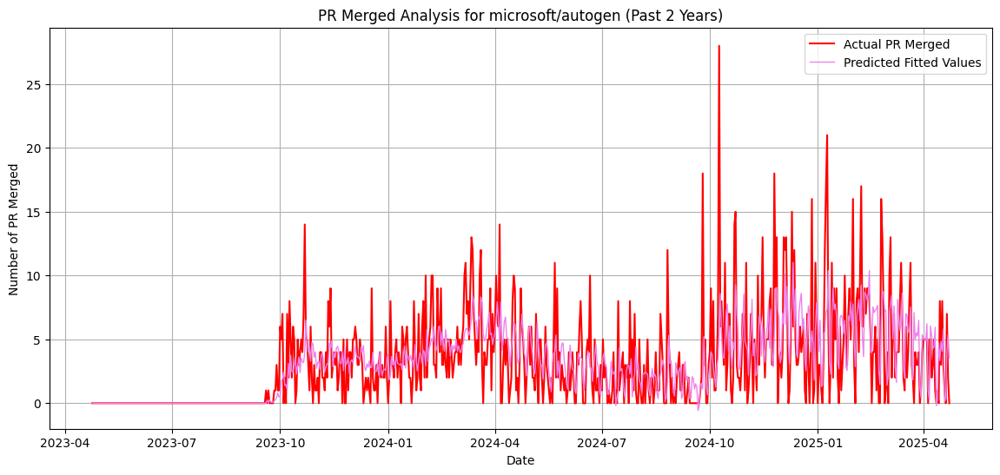

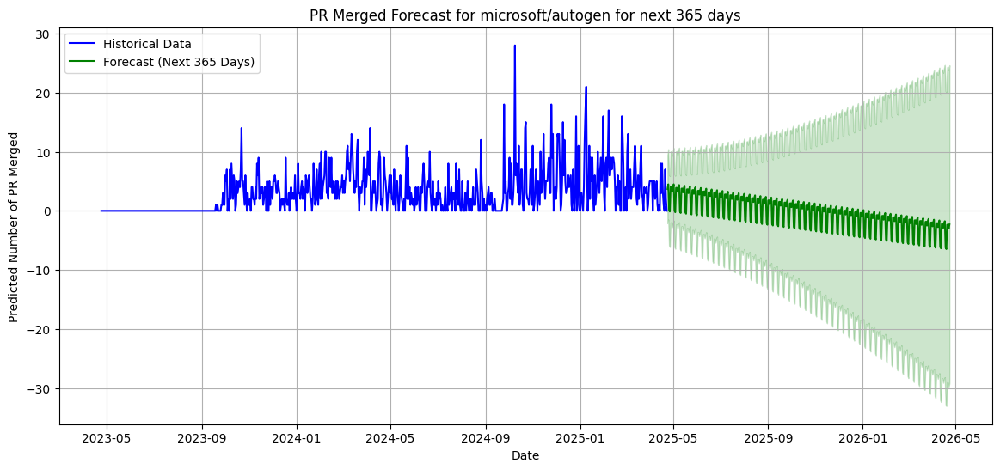

------------------------------------------------------------------------


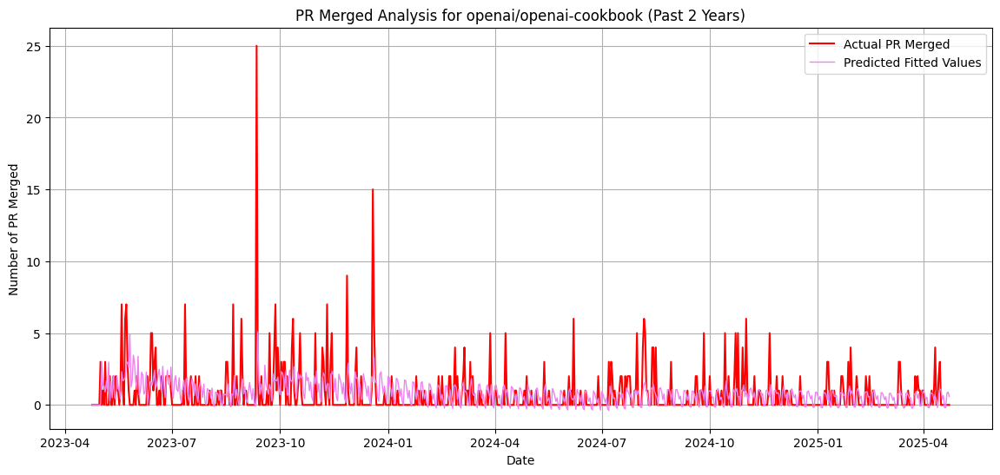

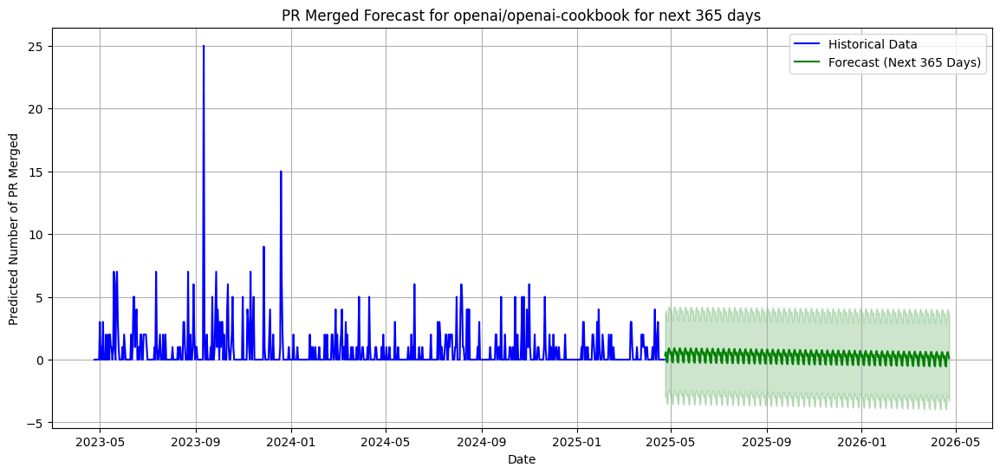

------------------------------------------------------------------------


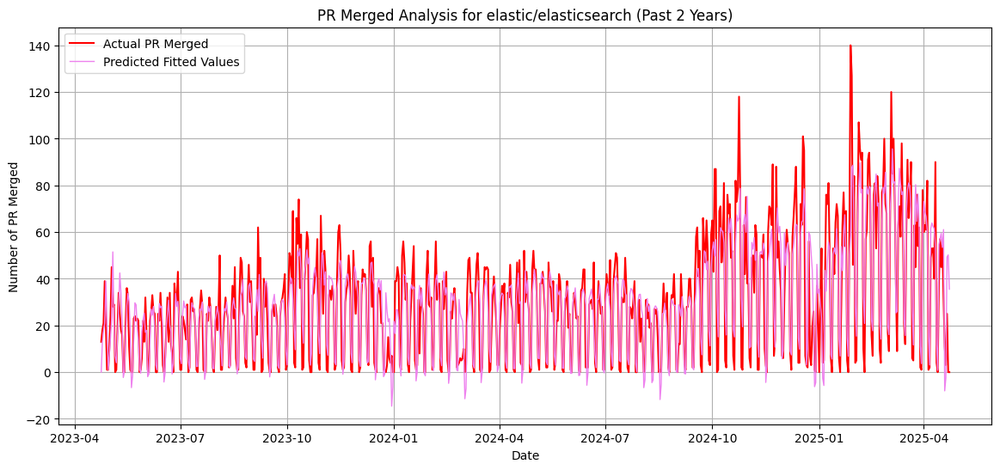

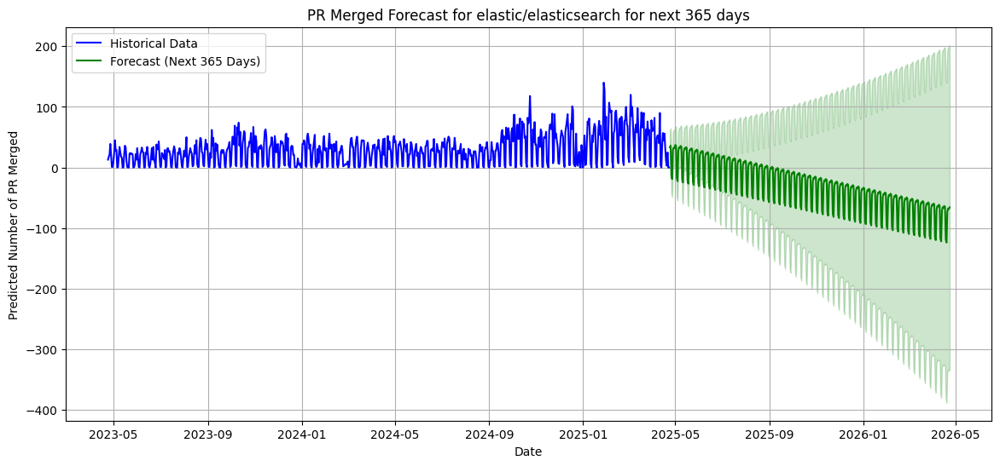

------------------------------------------------------------------------


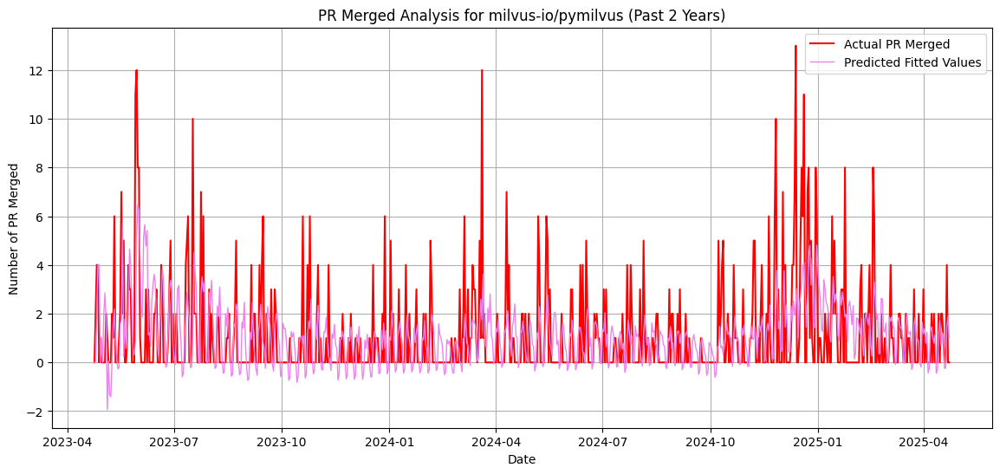

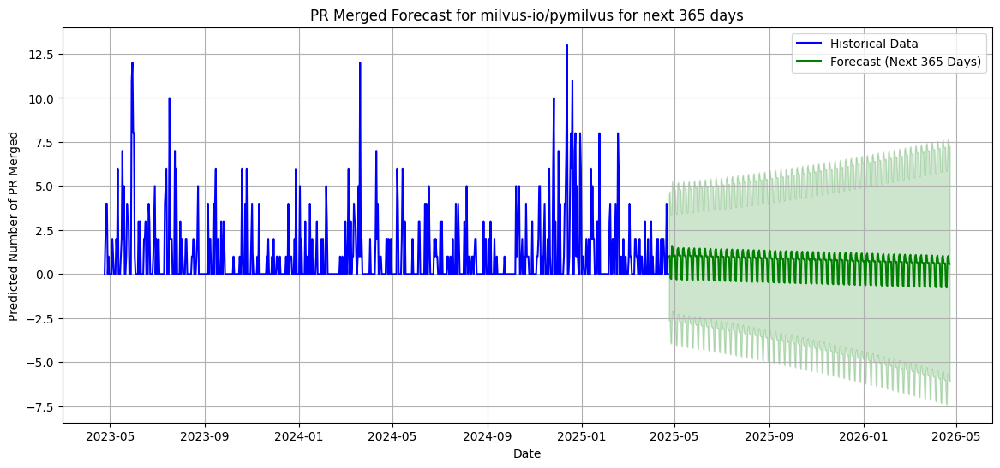

------------------------------------------------------------------------


In [ ]:
#Add your code for requirement 10.6 in this cell

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import statsmodels.api as smsapi
import pytz


nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()  # Past 2 years

pullsData = pd.read_csv('dataset/pulls_all_repo.csv')

for i in pullsData['repository'].unique():
    repoBasedDf = pullsData[pullsData['repository'] == i].copy()
    repoBasedDf['merged_at'] = pd.to_datetime(repoBasedDf['merged_at'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['merged_at'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['merged_at'] >= oldDate) & (repoBasedDf['merged_at'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('merged_at').size().reset_index(name='count')

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = repoBasedDfBasedOnDate.set_index('merged_at').reindex(allDates, fill_value=0).reset_index()
    newRepoData.rename(columns={'index': 'merged_at'}, inplace=True)

    model = smsapi.tsa.statespace.SARIMAX(newRepoData['count'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
    fitted = model.fit(disp = False)
    newRepoData['fitValues'] = fitted.fittedvalues

    plt.figure(figsize=(14, 6))
    plt.plot(newRepoData['merged_at'], newRepoData['count'], label='Actual PR Merged ', color='red')
    plt.plot(newRepoData['merged_at'], newRepoData['fitValues'], label='Predicted Fitted Values', color='violet', linewidth=1)
    plt.title(f"PR Merged Analysis for {i} (Past 2 Years)")
    plt.xlabel("Date")
    plt.ylabel("Number of PR Merged")
    plt.legend()
    plt.grid()
    plt.show()

    forecast_steps = 365
    forecast = fitted.get_forecast(steps=forecast_steps)
    forecast_values = forecast.predicted_mean
    forecast_ci = forecast.conf_int()

    last_date = newRepoData['merged_at'].iloc[-1]
    future_dates = pd.date_range(start=last_date + timedelta(days=1), periods=forecast_steps)

    plt.figure(figsize=(14, 6))
    plt.plot(newRepoData['merged_at'], newRepoData['count'], label='Historical Data', color='blue')
    plt.plot(future_dates, forecast_values, label='Forecast (Next 365 Days)', color='green')
    plt.fill_between(future_dates, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='green', alpha=0.2)
    plt.title(f"PR Merged Forecast for {i} for next 365 days")
    plt.xlabel("Date")
    plt.ylabel("Predicted Number of PR Merged")
    plt.legend()
    plt.grid()
    plt.show()

    print("------------------------------------------------------------------------")

<div class="alert alert-block alert-danger">   
    
#### REQ10-7). Plot the commits forecast

</div>

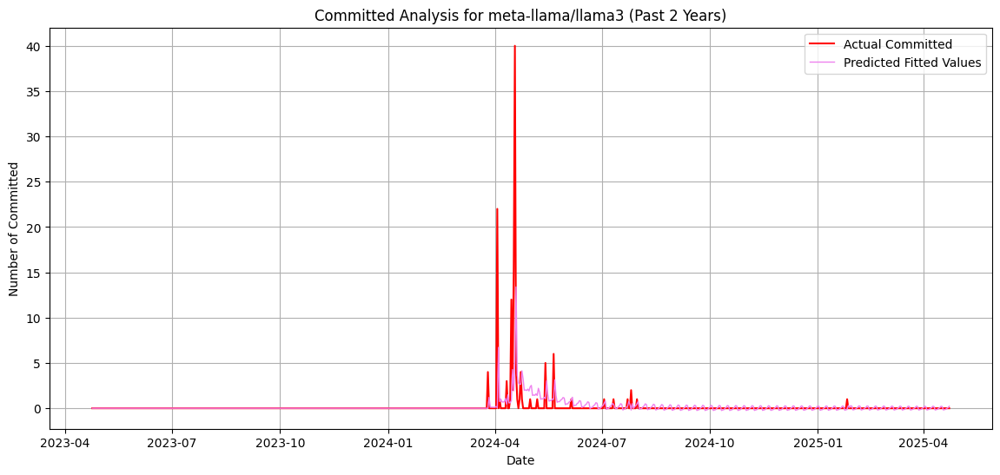

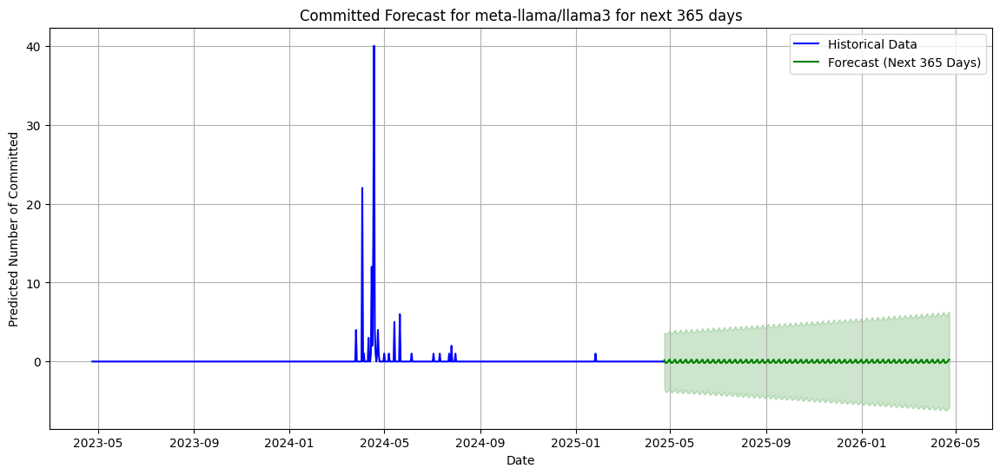

------------------------------------------------------------------------


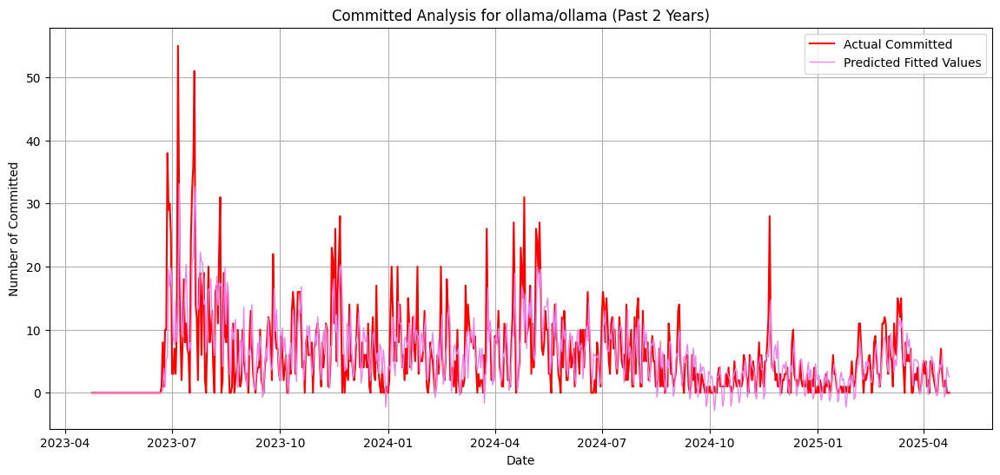

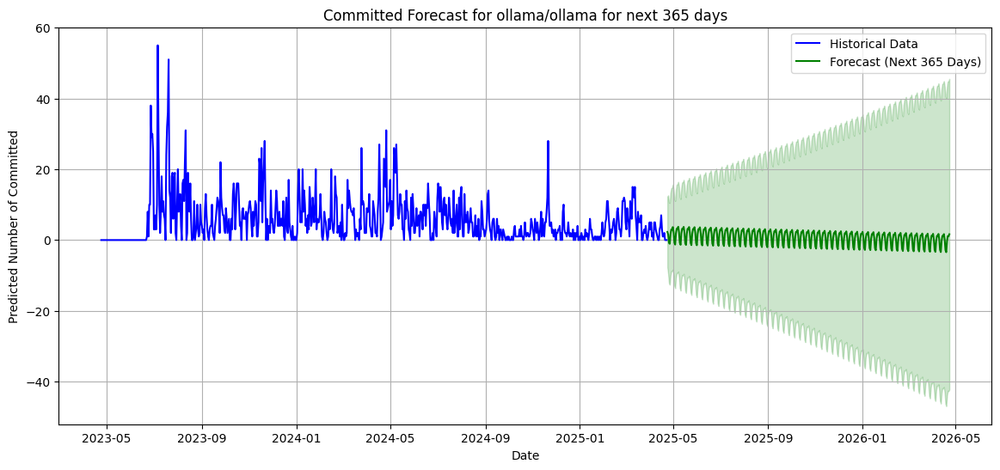

------------------------------------------------------------------------


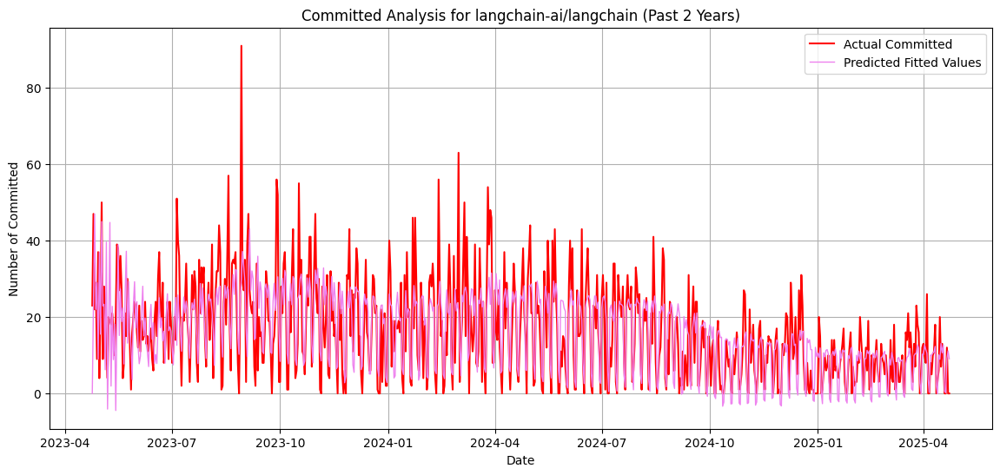

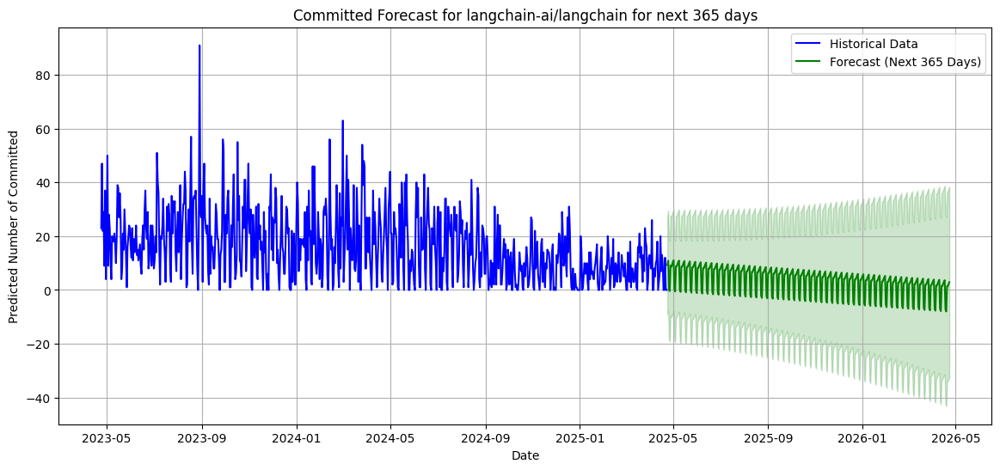

------------------------------------------------------------------------


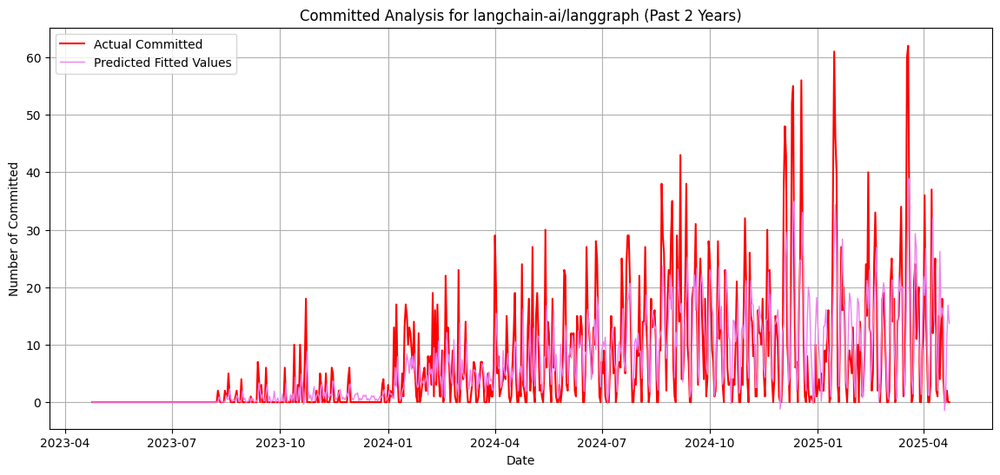

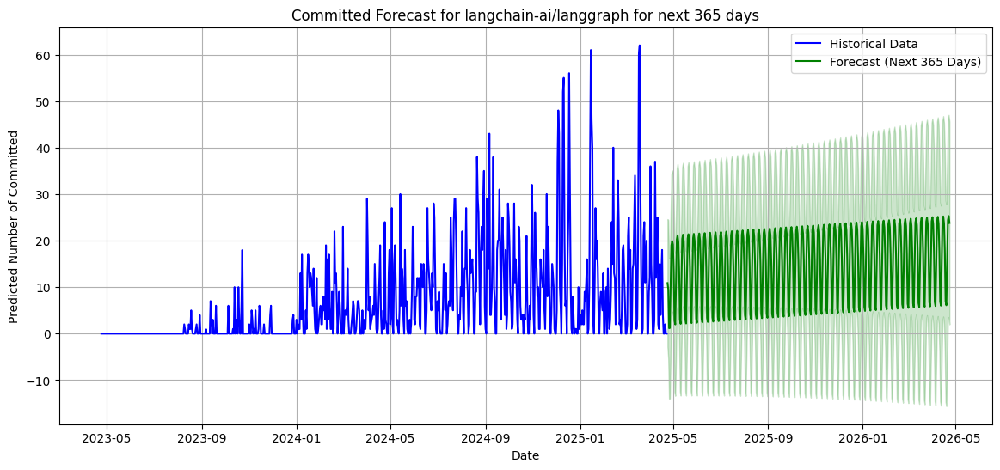

------------------------------------------------------------------------


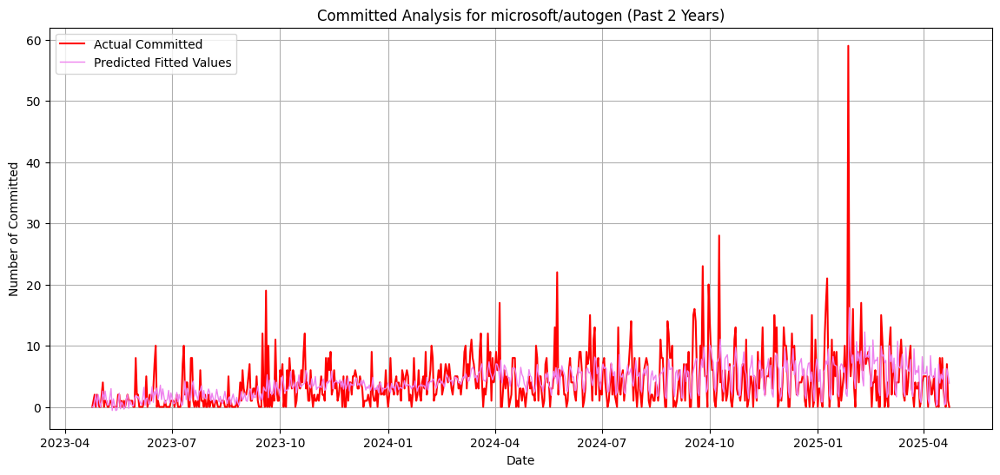

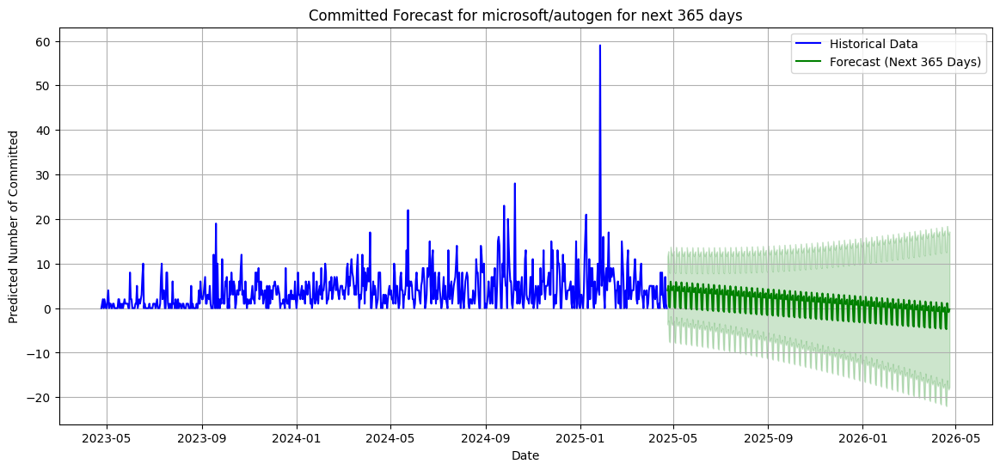

------------------------------------------------------------------------


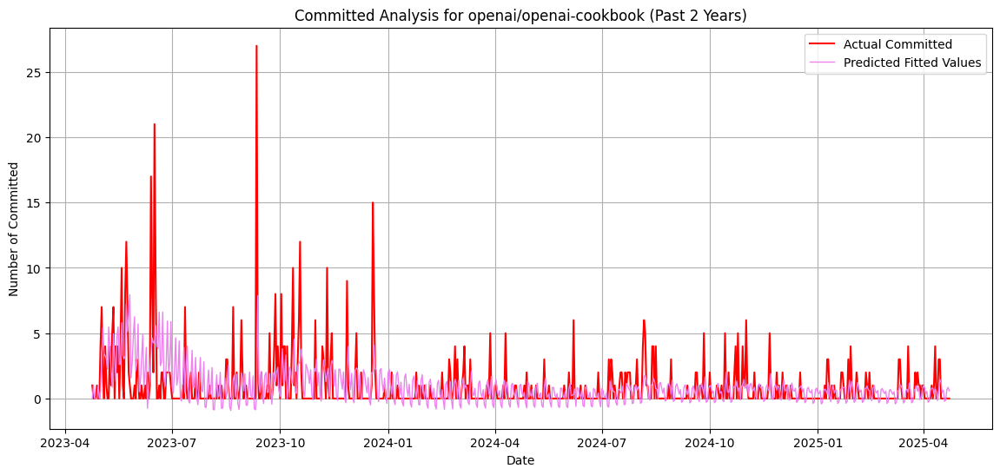

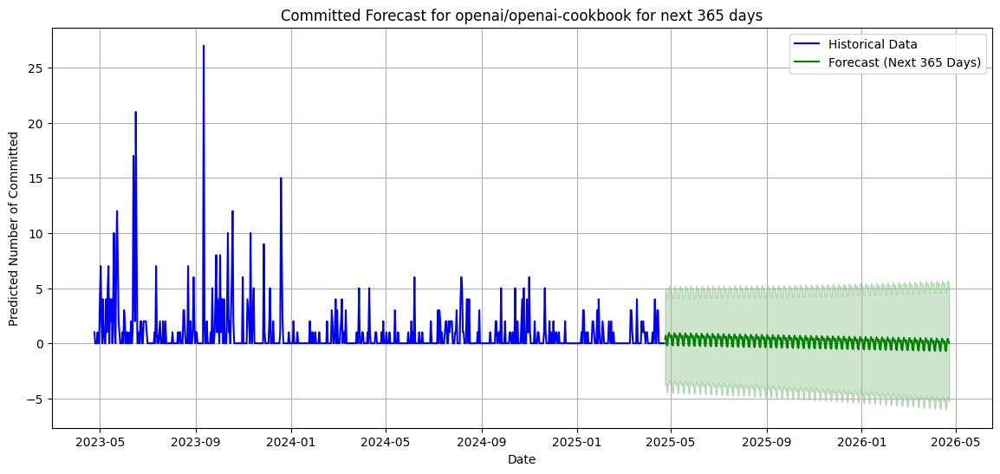

------------------------------------------------------------------------


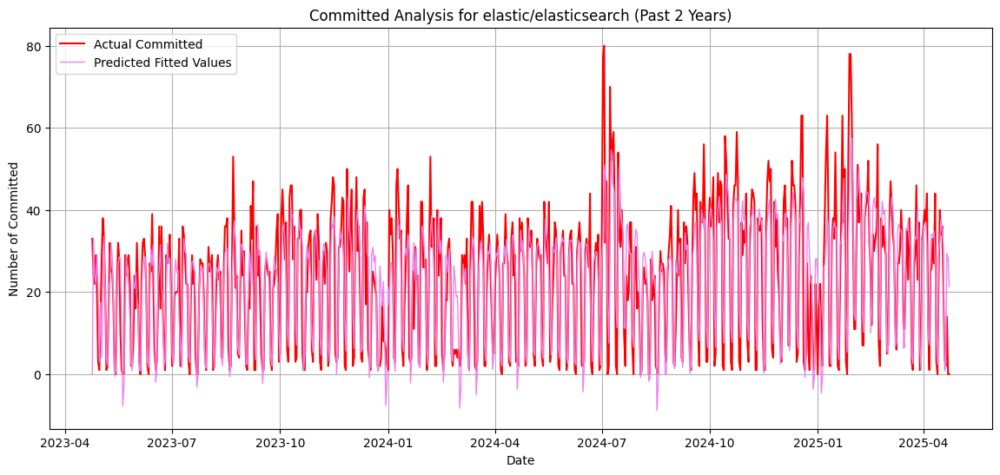

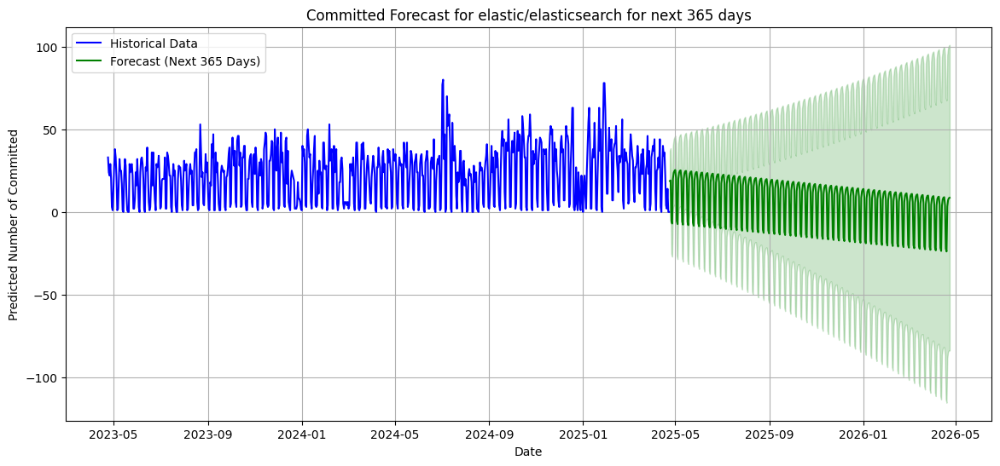

------------------------------------------------------------------------


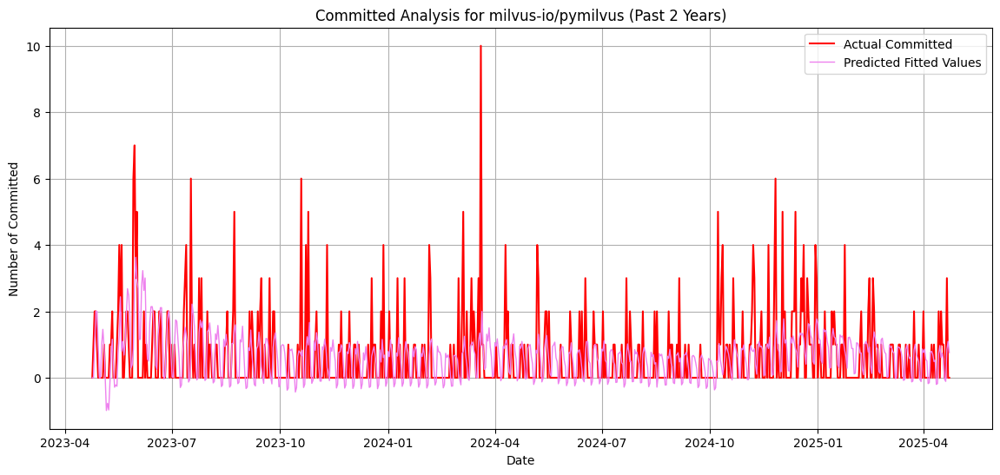

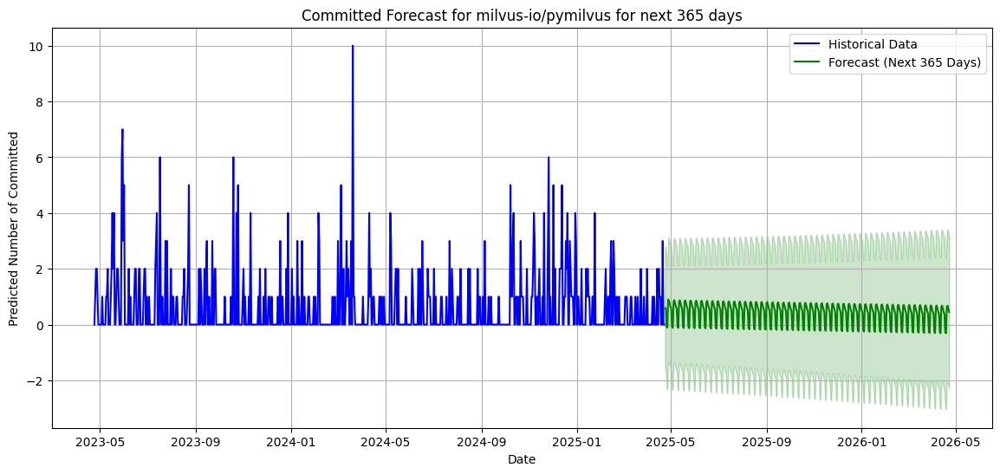

------------------------------------------------------------------------


In [6]:
#Add your code for requirement 10.7 in this cell

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import statsmodels.api as smsapi
import pytz

nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()  # Past 2 years

commitsData = pd.read_csv('dataset/commits_all_repo.csv')

for i in commitsData['repository'].unique():
    repoBasedDf = commitsData[commitsData['repository'] == i].copy()
    repoBasedDf['commit_date'] = pd.to_datetime(repoBasedDf['commit_date'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['commit_date'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['commit_date'] >= oldDate) & (repoBasedDf['commit_date'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('commit_date').size().reset_index(name='count')

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = repoBasedDfBasedOnDate.set_index('commit_date').reindex(allDates, fill_value=0).reset_index()
    newRepoData.rename(columns={'index': 'commit_date'}, inplace=True)

    model = smsapi.tsa.statespace.SARIMAX(newRepoData['count'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
    fitted = model.fit(disp=False)
    newRepoData['fitValues'] = fitted.fittedvalues

    plt.figure(figsize=(14, 6))
    plt.plot(newRepoData['commit_date'], newRepoData['count'], label='Actual Committed', color='red')
    plt.plot(newRepoData['commit_date'], newRepoData['fitValues'], label='Predicted Fitted Values', color='violet', linewidth=1)
    plt.title(f"Committed Analysis for {i} (Past 2 Years)")
    plt.xlabel("Date")
    plt.ylabel("Number of Committed")
    plt.legend()
    plt.grid()
    plt.show()

    forecast_steps = 365
    forecast = fitted.get_forecast(steps=forecast_steps)
    forecast_values = forecast.predicted_mean
    forecast_ci = forecast.conf_int()

    last_date = newRepoData['commit_date'].iloc[-1]
    future_dates = pd.date_range(start=last_date + timedelta(days=1), periods=forecast_steps)

    plt.figure(figsize=(14, 6))
    plt.plot(newRepoData['commit_date'], newRepoData['count'], label='Historical Data', color='blue')
    plt.plot(future_dates, forecast_values, label='Forecast (Next 365 Days)', color='green')
    plt.fill_between(future_dates, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='green', alpha=0.2)
    plt.title(f"Committed Forecast for {i} for next 365 days")
    plt.xlabel("Date")
    plt.ylabel("Predicted Number of Committed")
    plt.legend()
    plt.grid()
    plt.show()

    print("------------------------------------------------------------------------")

<div class="alert alert-block alert-danger">   
    
#### REQ10-8). Plot the branches forecast

</div>

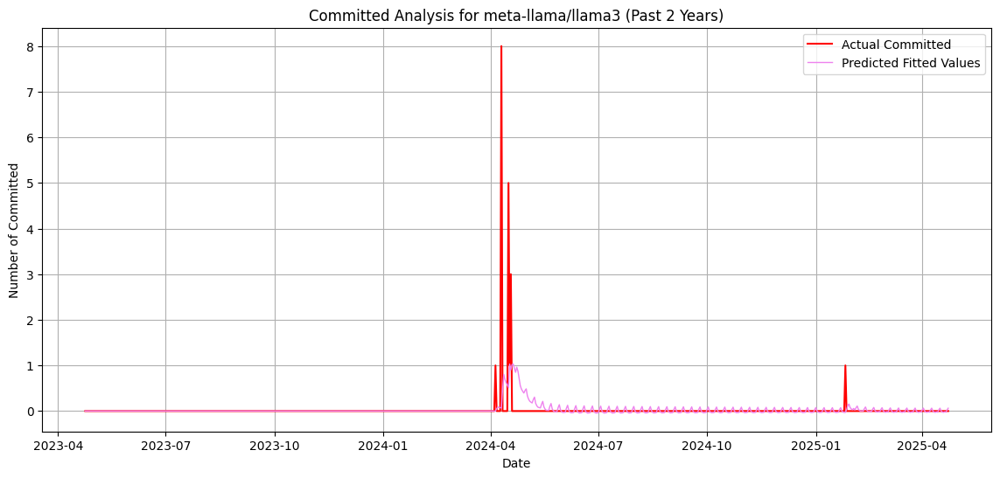

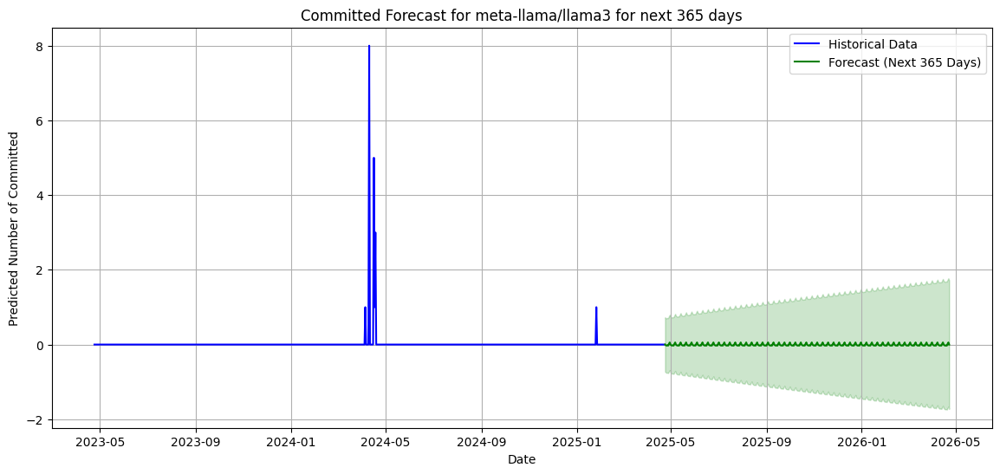

------------------------------------------------------------------------


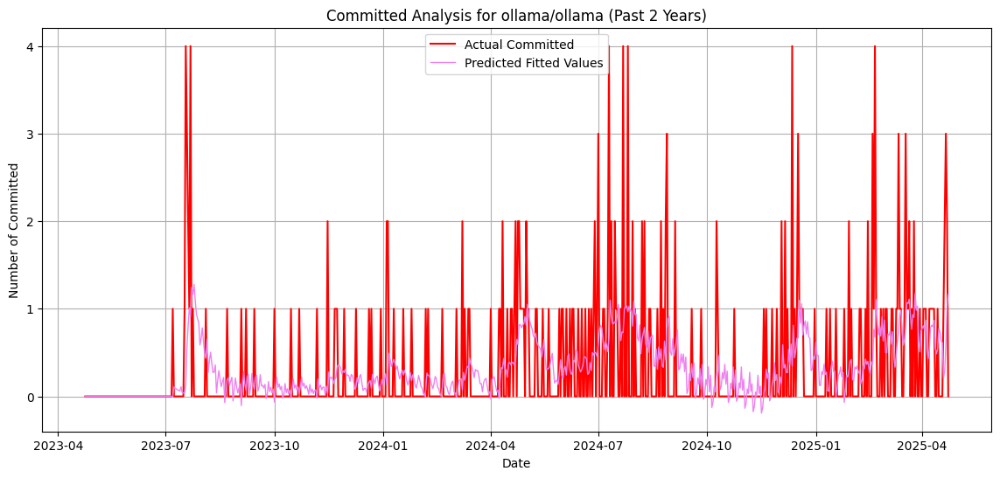

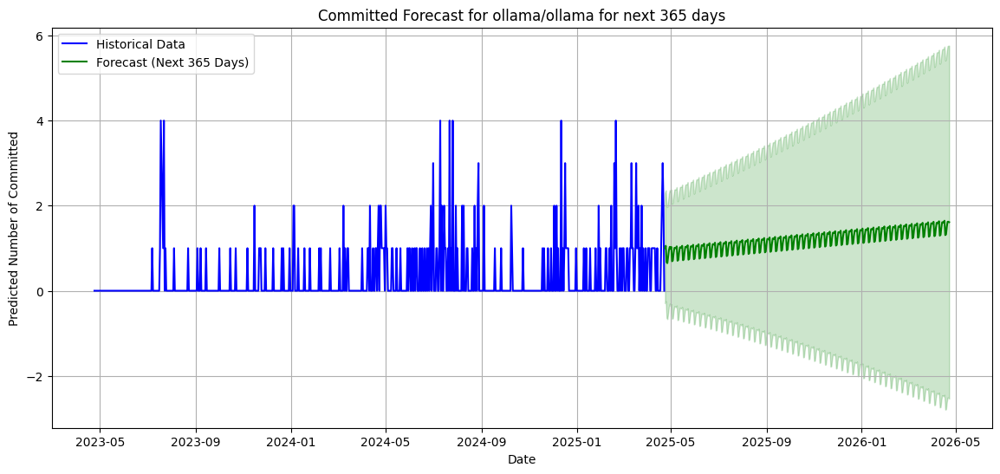

------------------------------------------------------------------------


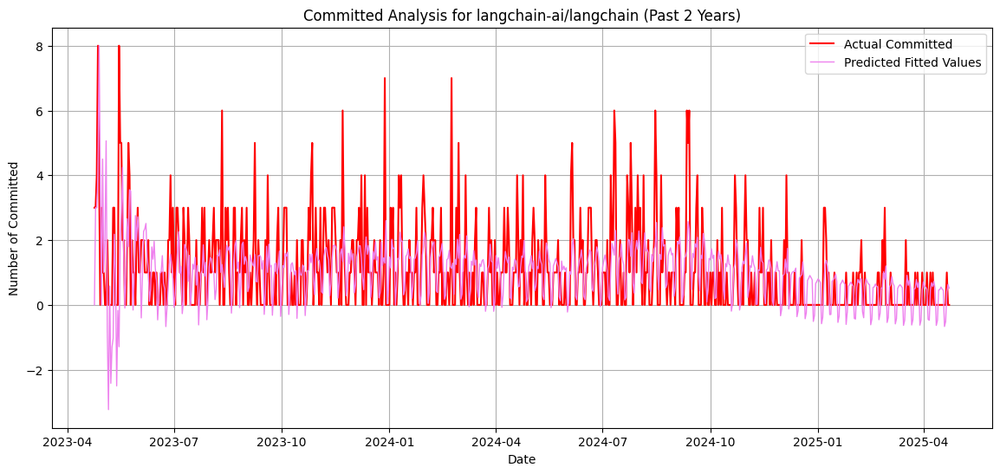

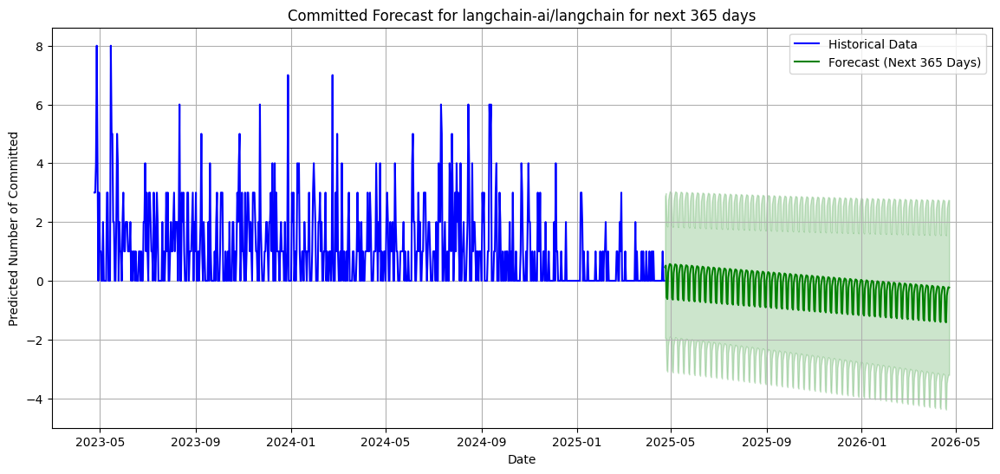

------------------------------------------------------------------------


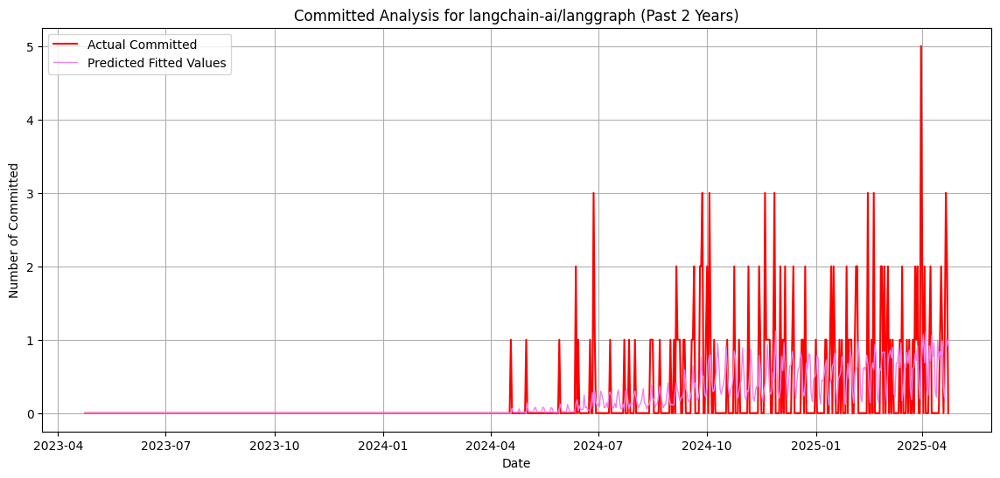

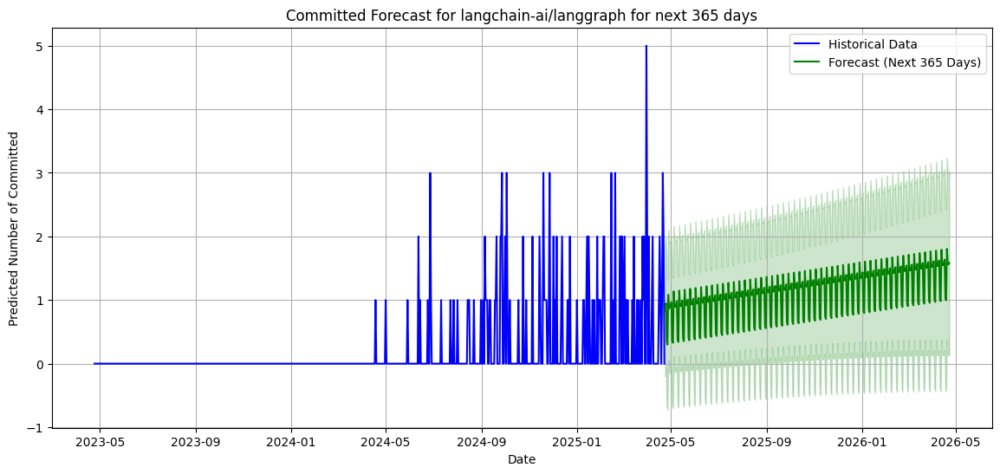

------------------------------------------------------------------------


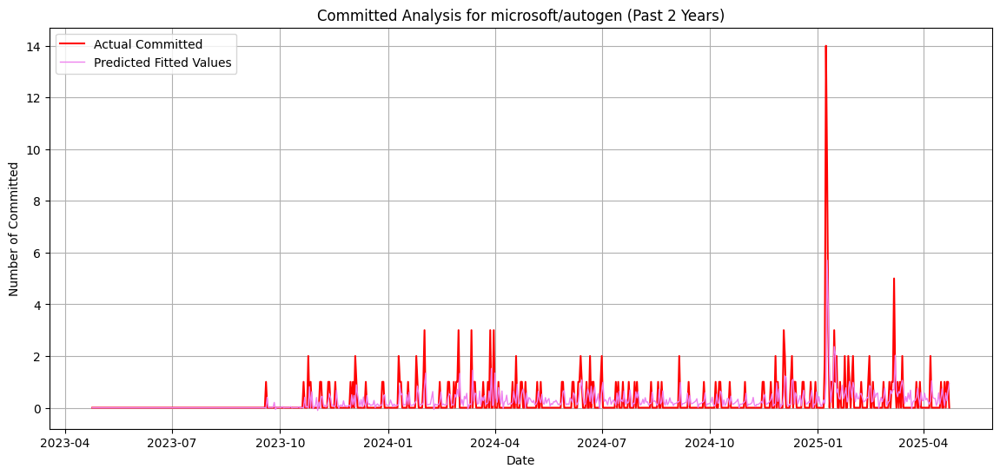

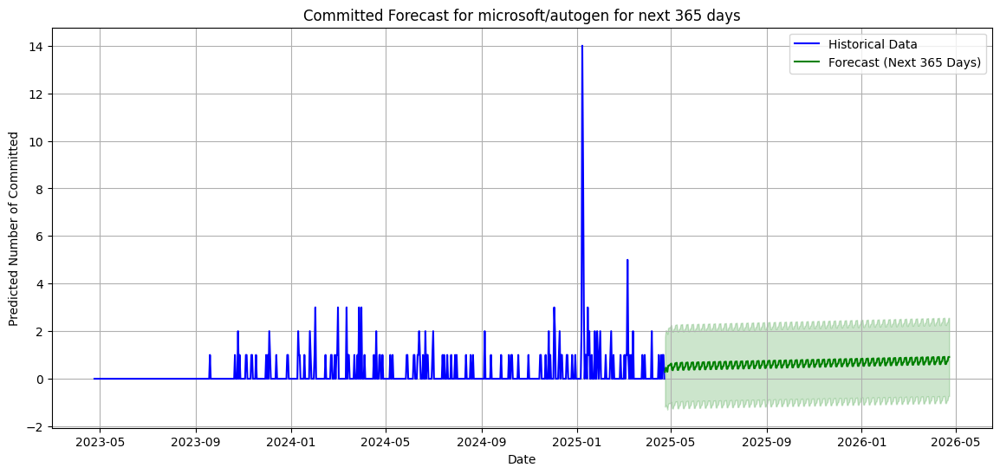

------------------------------------------------------------------------


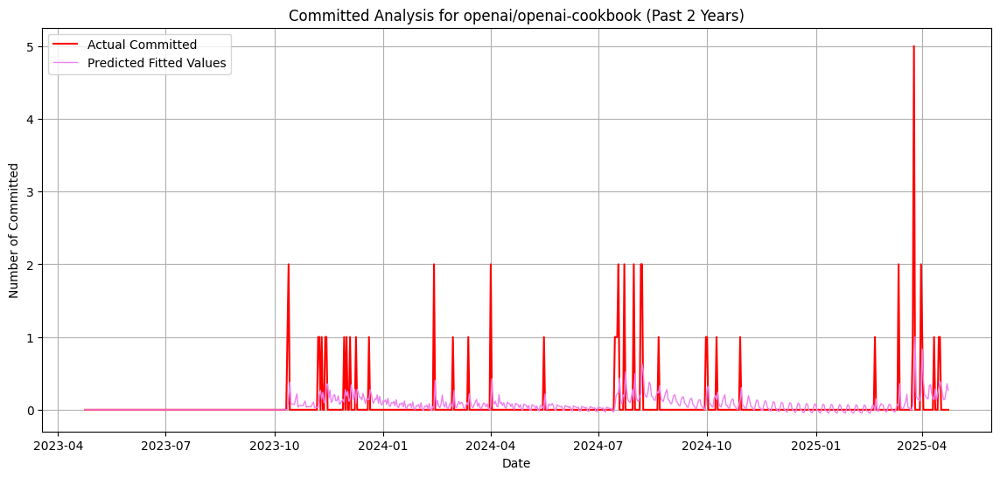

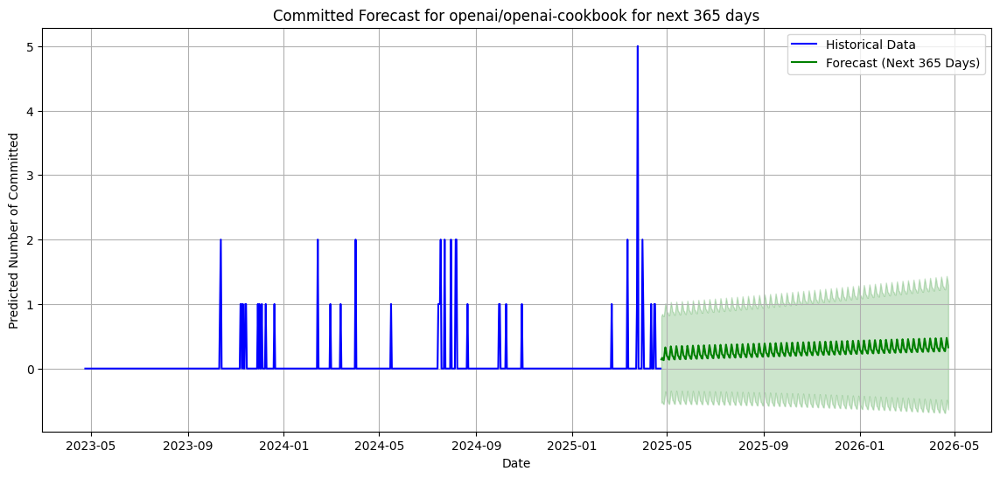

------------------------------------------------------------------------


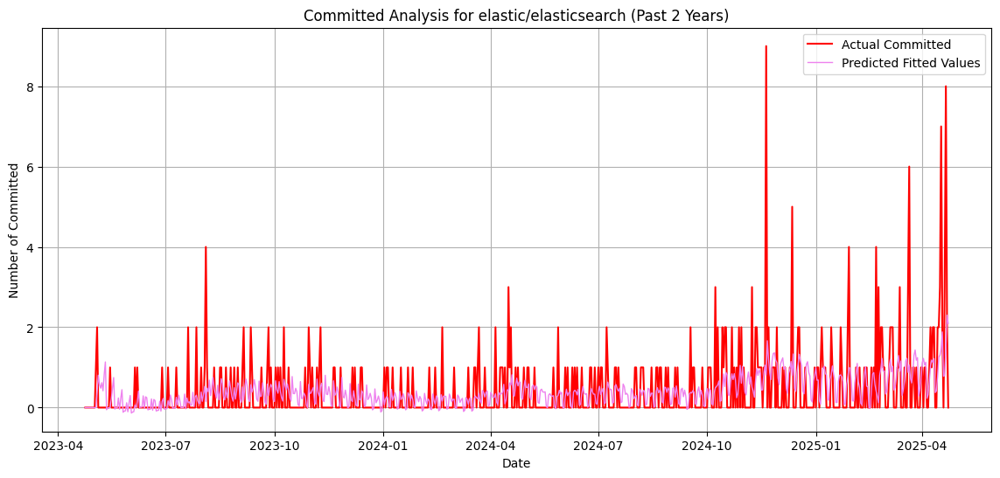

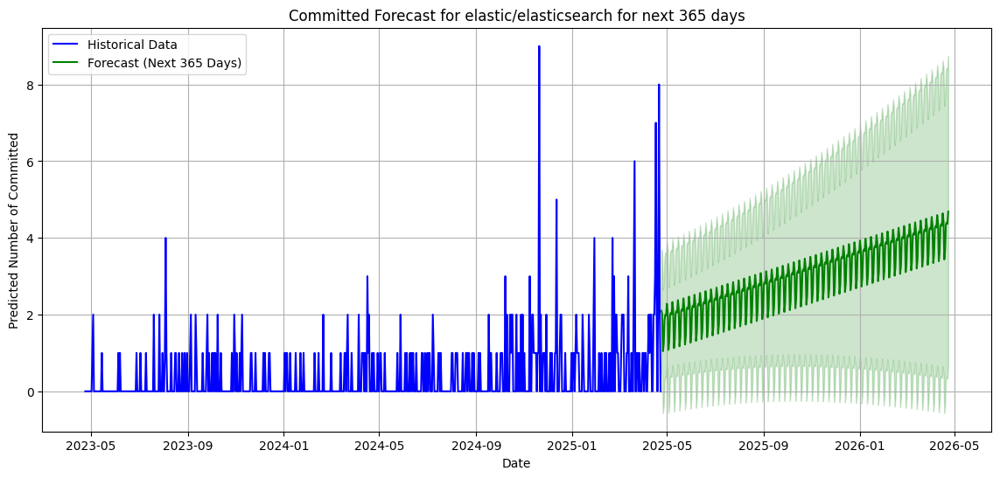

------------------------------------------------------------------------


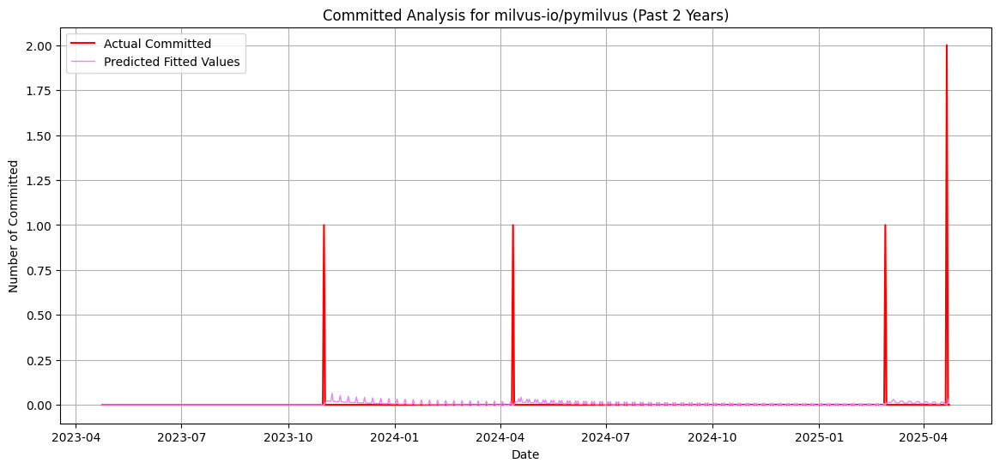

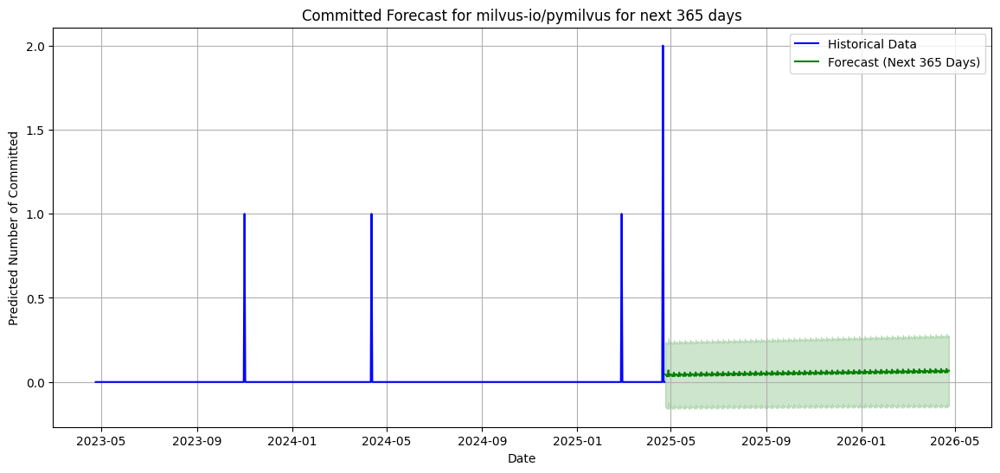

------------------------------------------------------------------------


In [8]:
#Add your code for requirement 10.8 in this cell

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import statsmodels.api as smsapi
import pytz

nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()  # Past 2 years

branchData = pd.read_csv('dataset/branches_all_repo.csv')

for i in branchData['repository'].unique():
    repoBasedDf = branchData[branchData['repository'] == i].copy()
    repoBasedDf['commit_date'] = pd.to_datetime(repoBasedDf['commit_date'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['commit_date'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['commit_date'] >= oldDate) & (repoBasedDf['commit_date'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('commit_date').size().reset_index(name='count')

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = repoBasedDfBasedOnDate.set_index('commit_date').reindex(allDates, fill_value=0).reset_index()
    newRepoData.rename(columns={'index': 'commit_date'}, inplace=True)

    model = smsapi.tsa.statespace.SARIMAX(newRepoData['count'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
    fitted = model.fit(disp=False)
    newRepoData['fitValues'] = fitted.fittedvalues

    plt.figure(figsize=(14, 6))
    plt.plot(newRepoData['commit_date'], newRepoData['count'], label='Actual Committed', color='red')
    plt.plot(newRepoData['commit_date'], newRepoData['fitValues'], label='Predicted Fitted Values', color='violet', linewidth=1)
    plt.title(f"Committed Analysis for {i} (Past 2 Years)")
    plt.xlabel("Date")
    plt.ylabel("Number of Committed")
    plt.legend()
    plt.grid()
    plt.show()

    forecast_steps = 365
    forecast = fitted.get_forecast(steps=forecast_steps)
    forecast_values = forecast.predicted_mean
    forecast_ci = forecast.conf_int()

    last_date = newRepoData['commit_date'].iloc[-1]
    future_dates = pd.date_range(start=last_date + timedelta(days=1), periods=forecast_steps)

    plt.figure(figsize=(14, 6))
    plt.plot(newRepoData['commit_date'], newRepoData['count'], label='Historical Data', color='blue')
    plt.plot(future_dates, forecast_values, label='Forecast (Next 365 Days)', color='green')
    plt.fill_between(future_dates, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='green', alpha=0.2)
    plt.title(f"Committed Forecast for {i} for next 365 days")
    plt.xlabel("Date")
    plt.ylabel("Predicted Number of Committed")
    plt.legend()
    plt.grid()
    plt.show()

    print("------------------------------------------------------------------------")


<div class="alert alert-block alert-danger">   
    
#### REQ10-9). Plot the contributors forecast

</div>

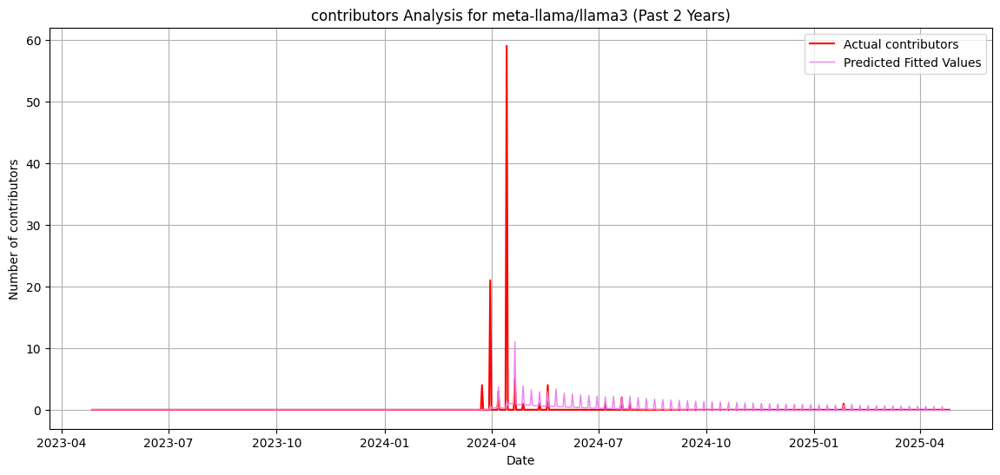

2025-04-25 21:16:49.414056


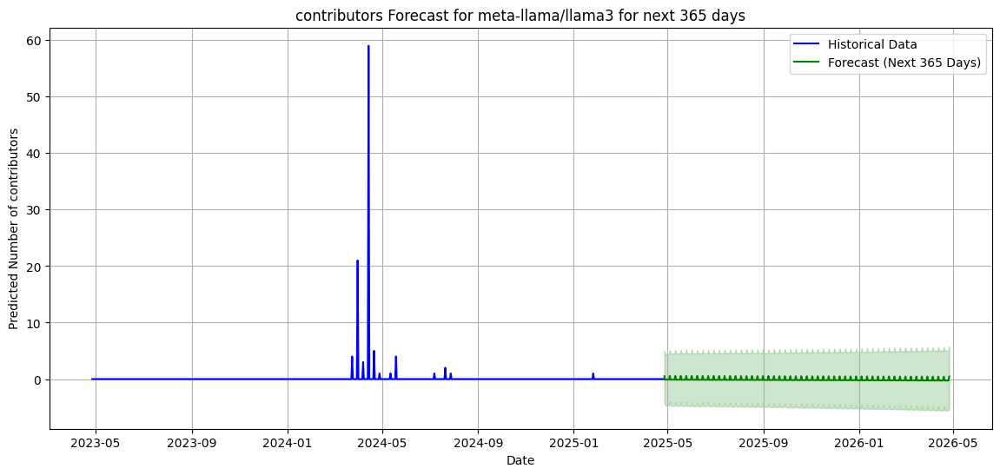

------------------------------------------------------------------------


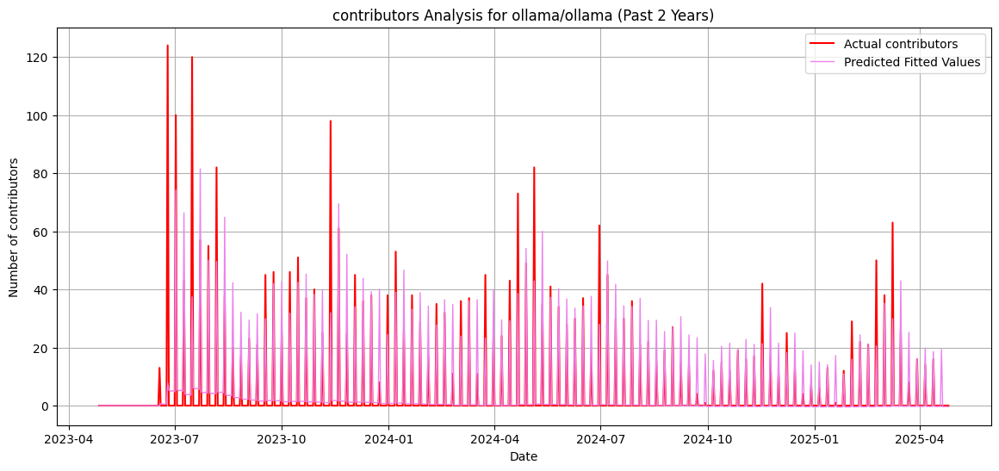

2025-04-25 21:16:50.266625


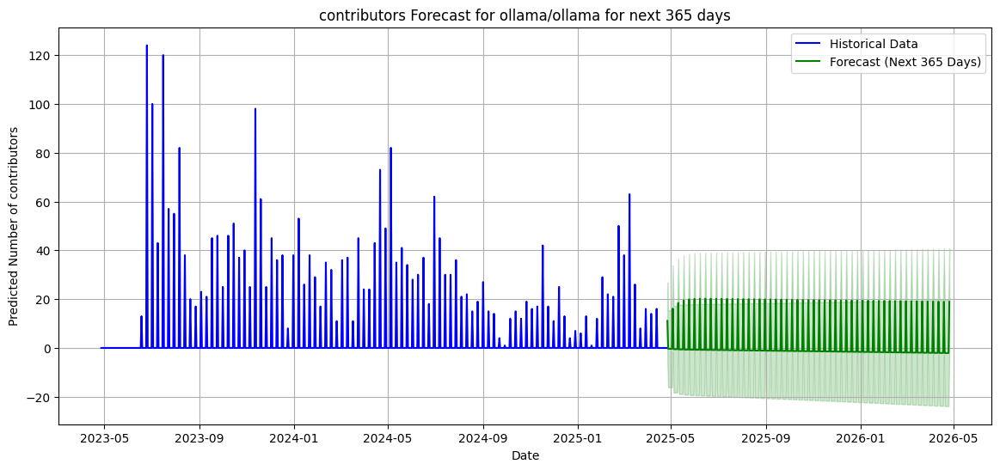

------------------------------------------------------------------------


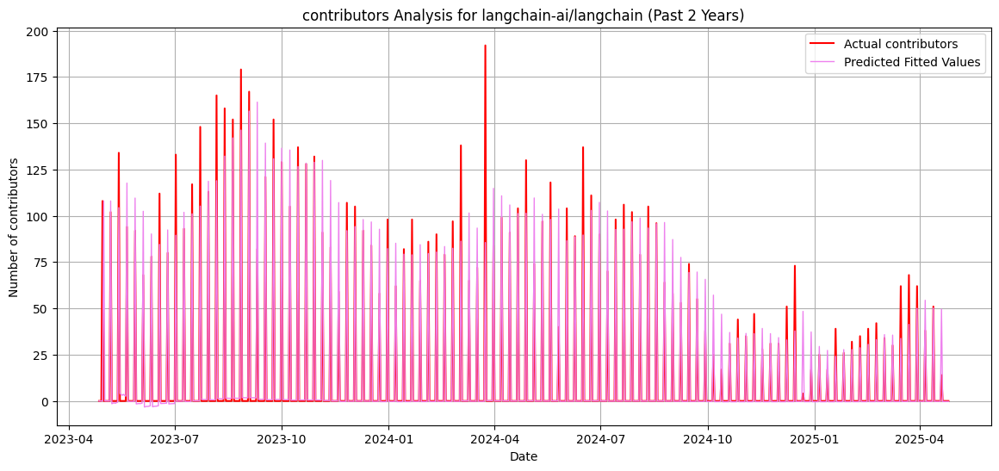

2025-04-25 21:16:51.399199


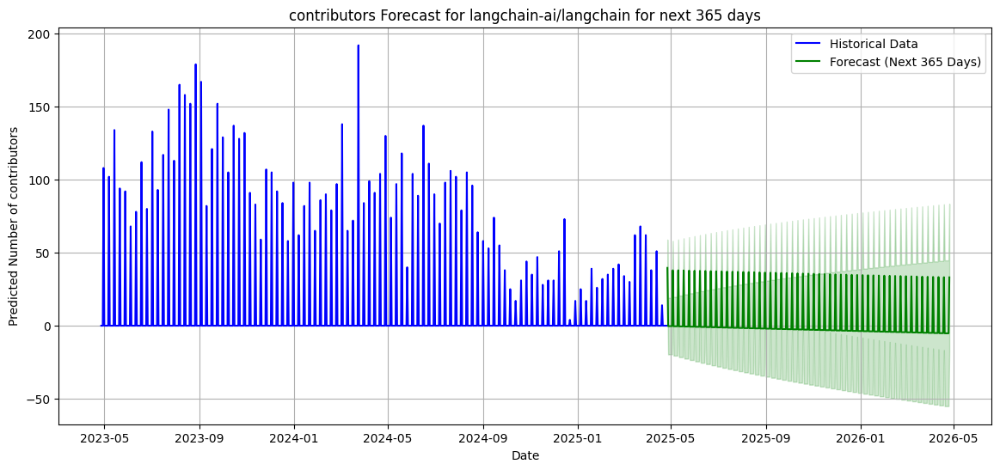

------------------------------------------------------------------------


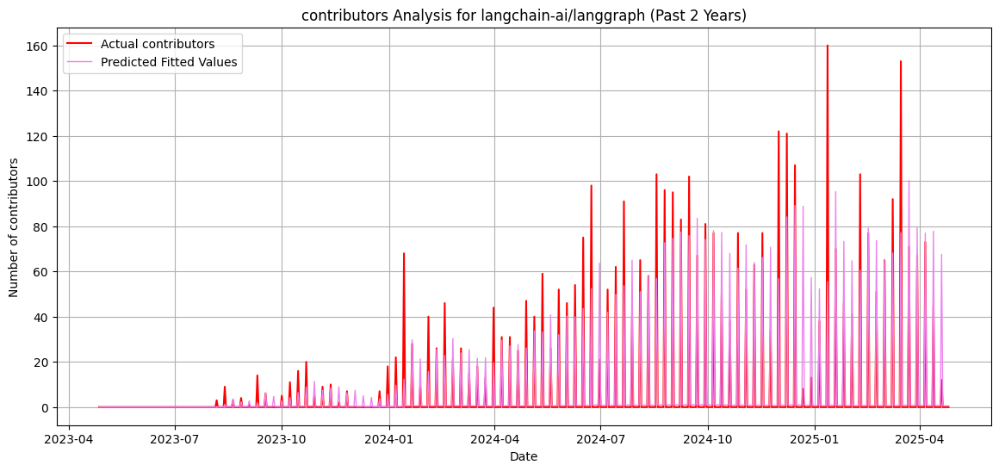

2025-04-25 21:16:52.529792


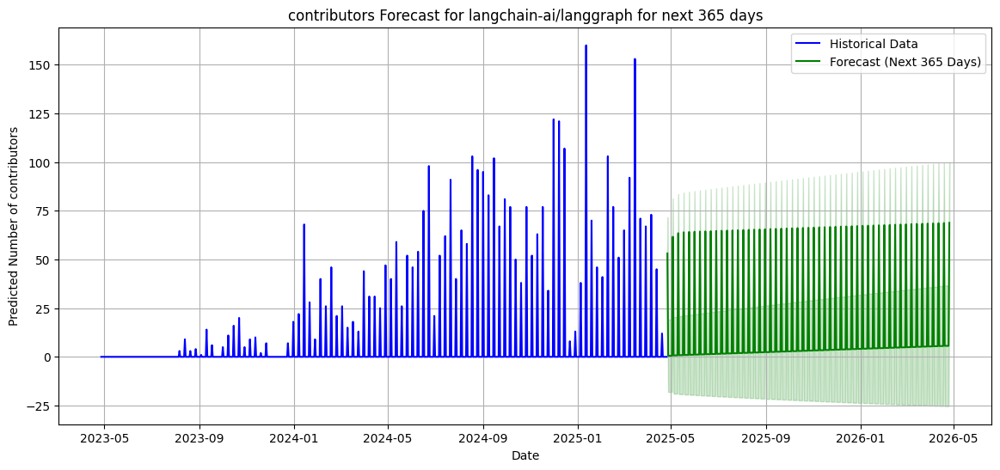

------------------------------------------------------------------------


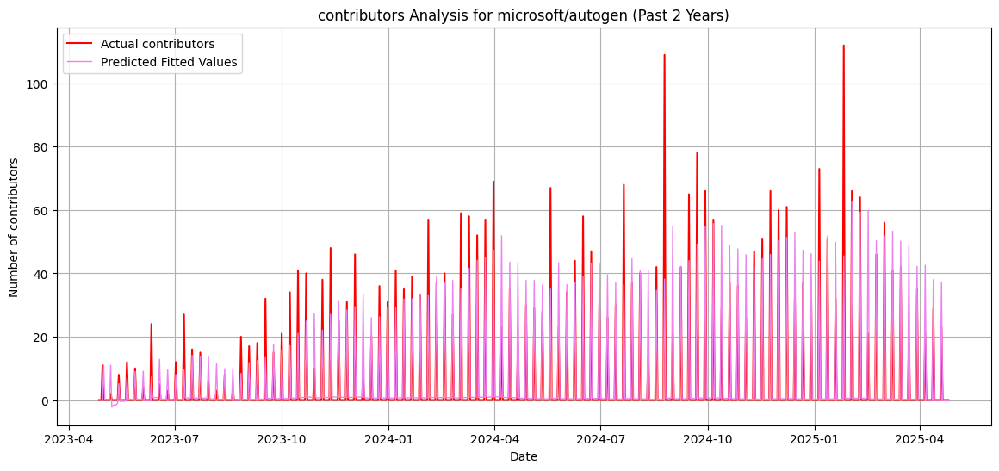

2025-04-25 21:16:53.410636


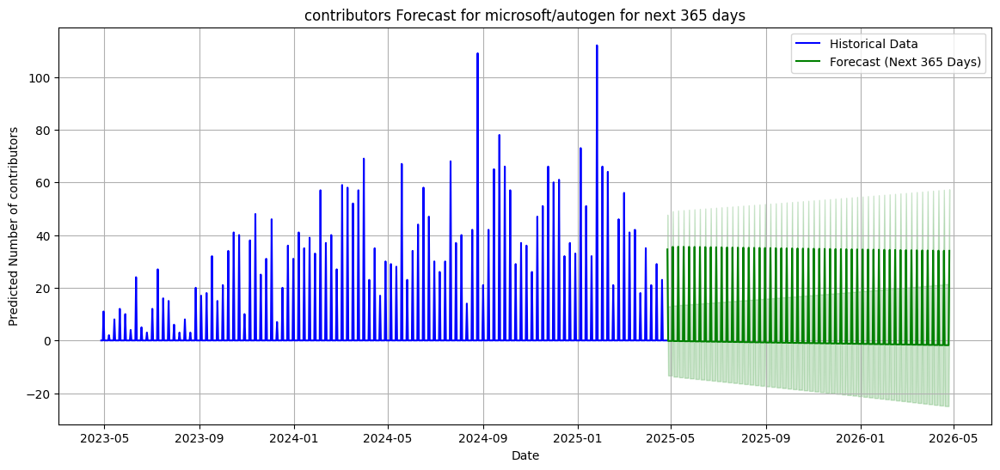

------------------------------------------------------------------------


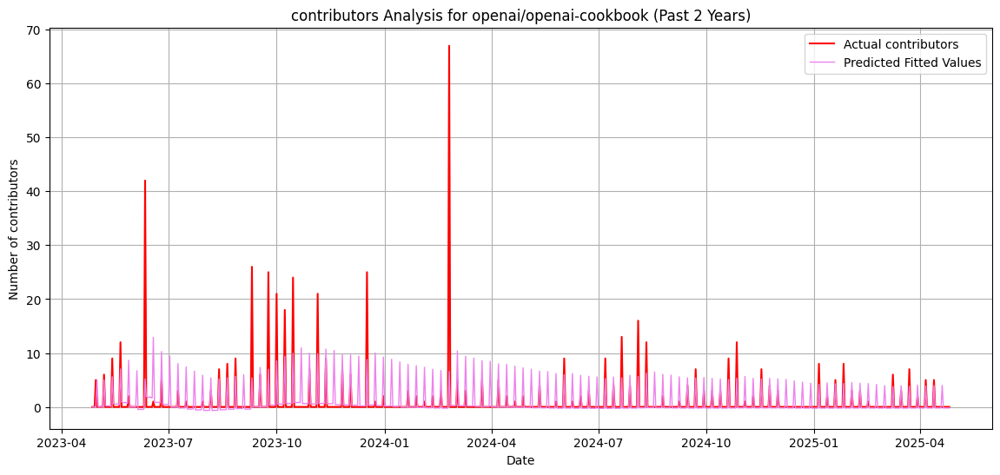

2025-04-25 21:16:54.496099


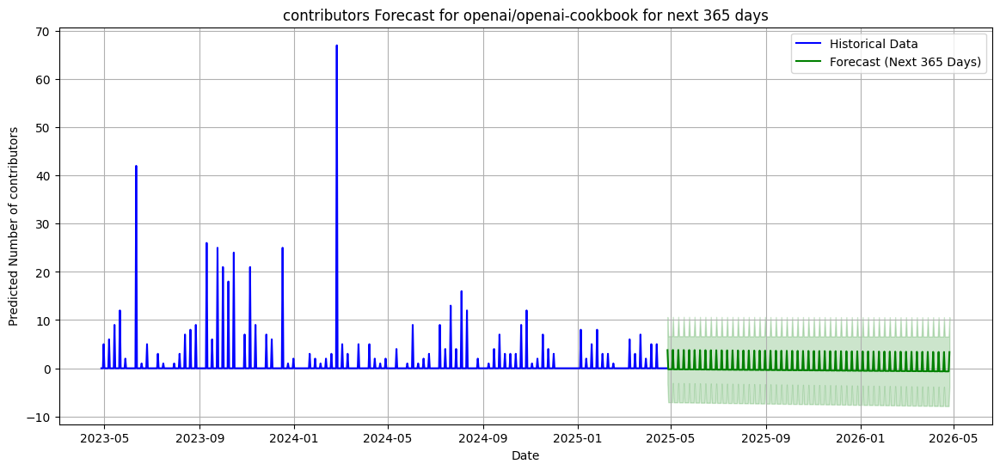

------------------------------------------------------------------------


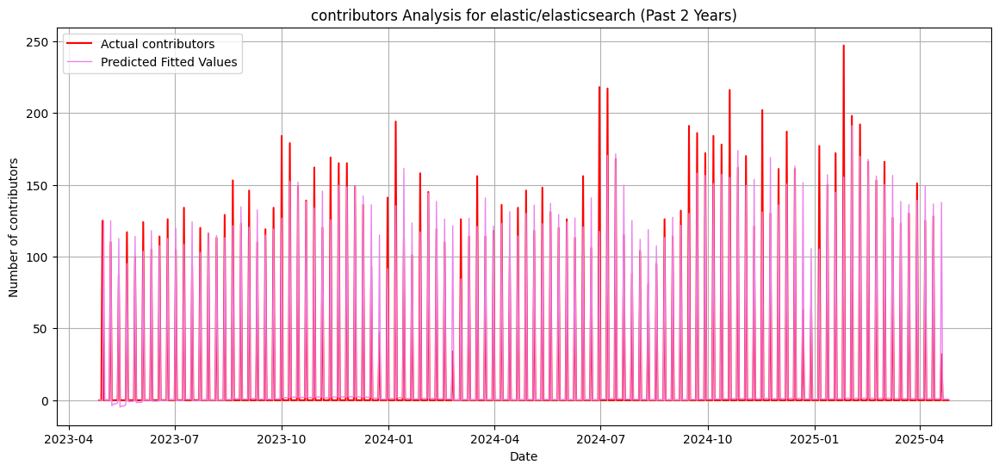

2025-04-25 21:16:55.297626


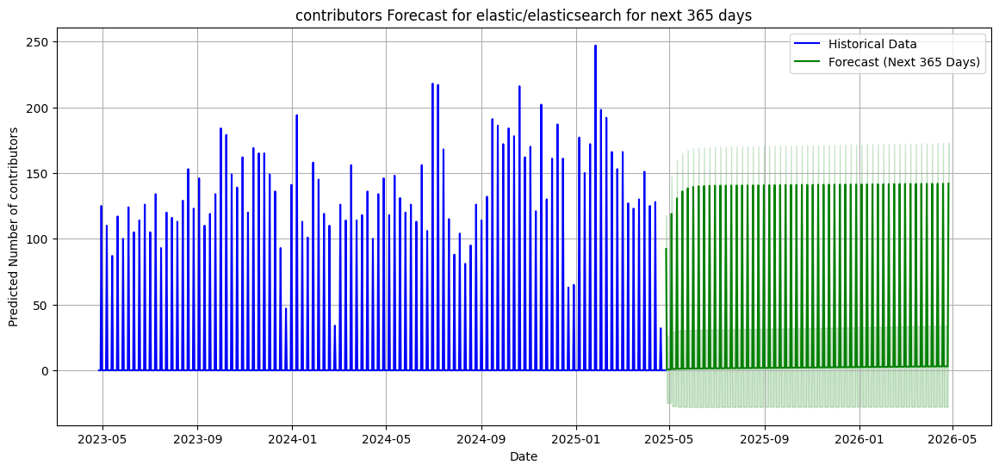

------------------------------------------------------------------------


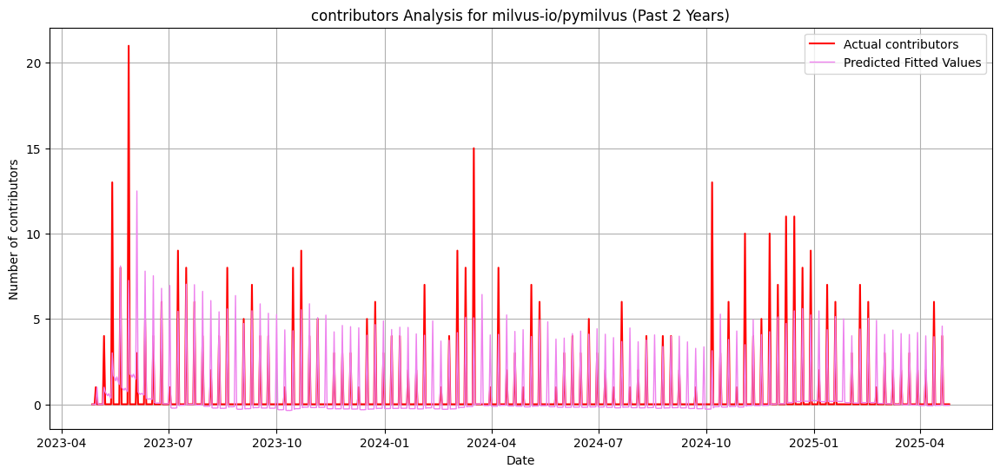

2025-04-25 21:16:55.984663


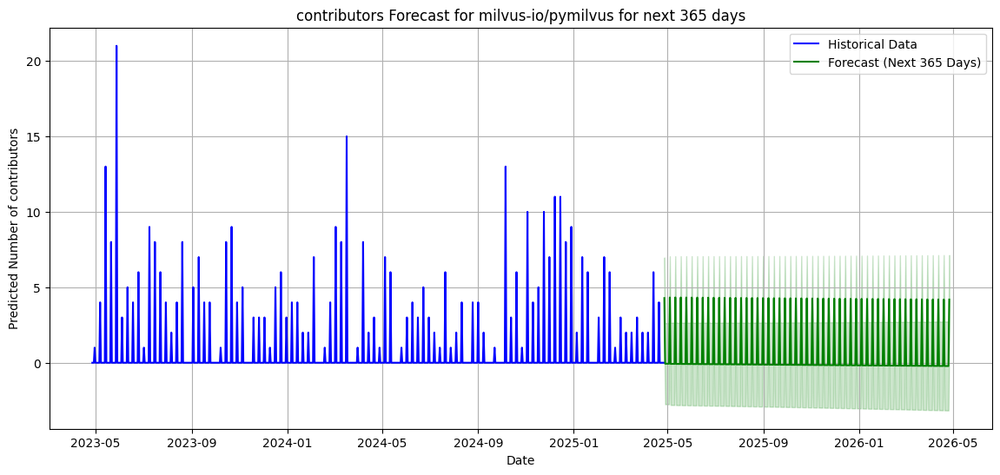

------------------------------------------------------------------------


In [8]:
#Add your code for requirement 10.9 in this cell

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import statsmodels.api as smsapi
import pytz

nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()  # Past 2 years

contributorsData = pd.read_csv('dataset/all_repo_contributors.csv')
for i in contributorsData['Repository'].unique():
    repoBasedDf = contributorsData[contributorsData['Repository'] == i].copy()
    repoBasedDf['date'] = pd.to_datetime(repoBasedDf['date'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['date'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['date'] >= oldDate) & (repoBasedDf['date'] <= nowDate)]
    
    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = repoBasedDf.set_index('date').reindex(allDates, fill_value=0).reset_index()
    newRepoData.rename(columns={'index': 'date'}, inplace=True)

    model = smsapi.tsa.statespace.SARIMAX(newRepoData['commitCount'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
    fitted = model.fit(disp=False)
    newRepoData['fitValues'] = fitted.fittedvalues

    plt.figure(figsize=(14, 6))
    plt.plot(newRepoData['date'], newRepoData['commitCount'], label='Actual contributors', color='red')
    plt.plot(newRepoData['date'], newRepoData['fitValues'], label='Predicted Fitted Values', color='violet', linewidth=1)
    plt.title(f"contributors Analysis for {i} (Past 2 Years)")
    plt.xlabel("Date")
    plt.ylabel("Number of contributors")
    plt.legend()
    plt.grid()
    plt.show()

    forecast_steps = 365
    forecast = fitted.get_forecast(steps=forecast_steps)
    forecast_values = forecast.predicted_mean
    forecast_ci = forecast.conf_int()

    last_date = newRepoData['date'].iloc[-1]
    future_dates = pd.date_range(start=last_date + timedelta(days=1), periods=forecast_steps)

    plt.figure(figsize=(14, 6))
    plt.plot(newRepoData['date'], newRepoData['commitCount'], label='Historical Data', color='blue')
    plt.plot(future_dates, forecast_values, label='Forecast (Next 365 Days)', color='green')
    plt.fill_between(future_dates, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='green', alpha=0.2)
    plt.title(f"contributors Forecast for {i} for next 365 days")
    plt.xlabel("Date")
    plt.ylabel("Predicted Number of contributors")
    plt.legend()
    plt.grid()
    plt.show()

    print("------------------------------------------------------------------------")

<div class="alert alert-block alert-danger">   
    
#### REQ10-10). Plot the releases forecast

</div>

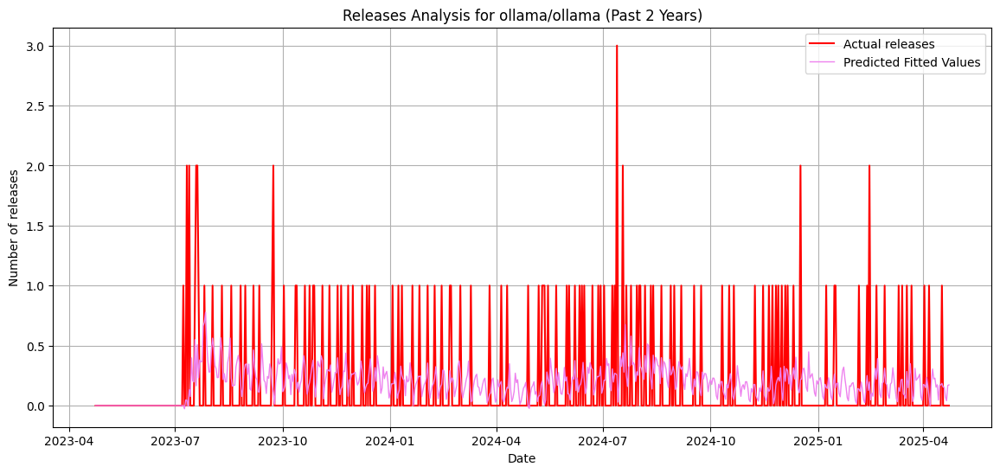

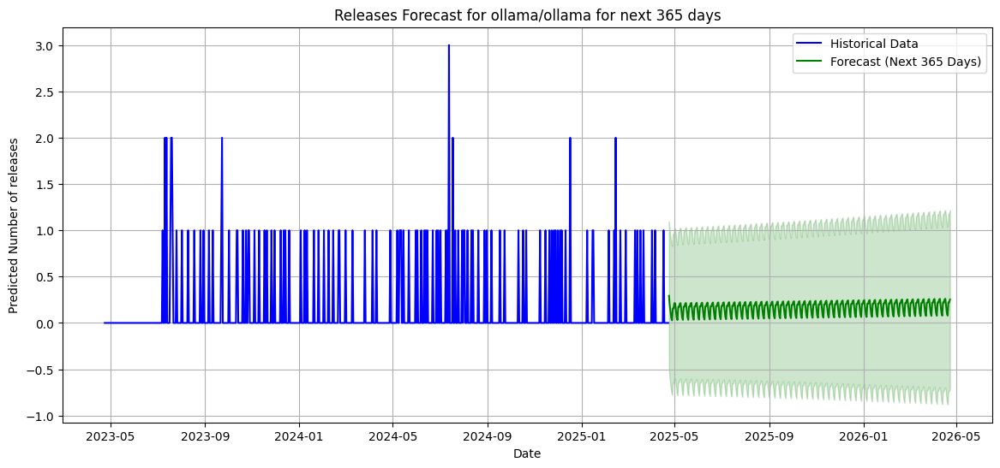

------------------------------------------------------------------------


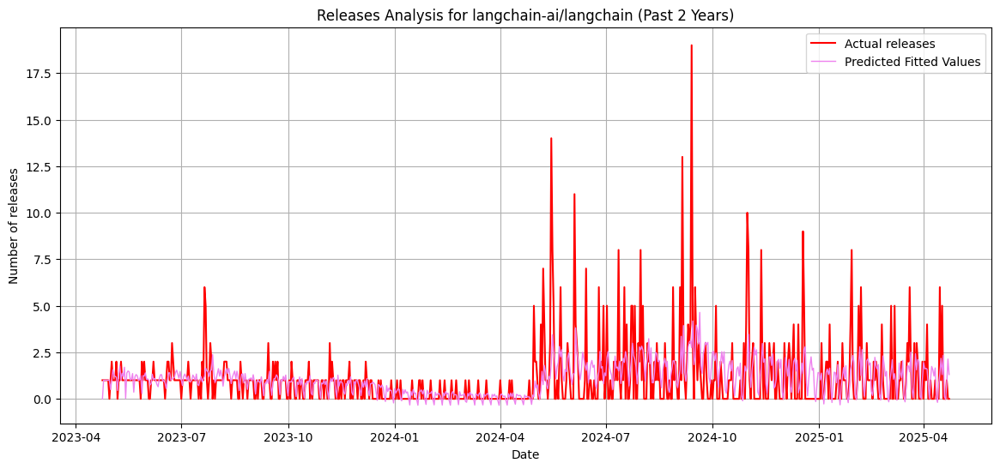

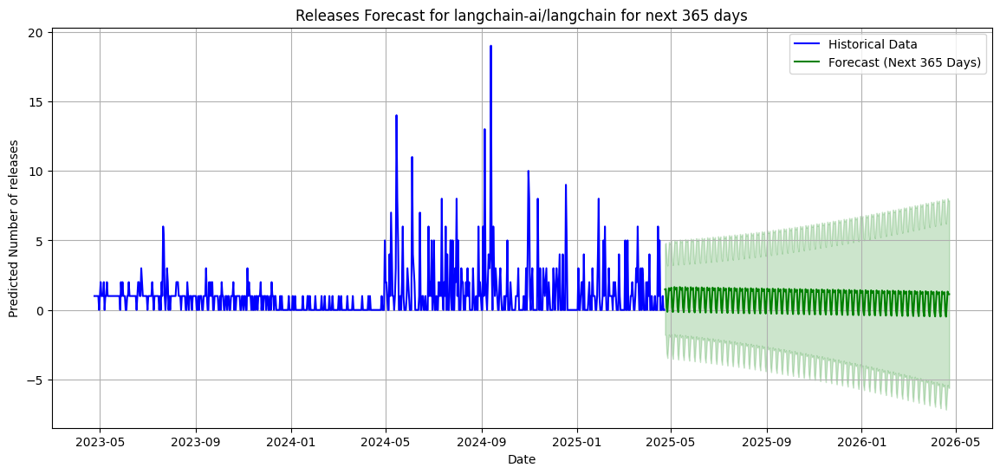

------------------------------------------------------------------------


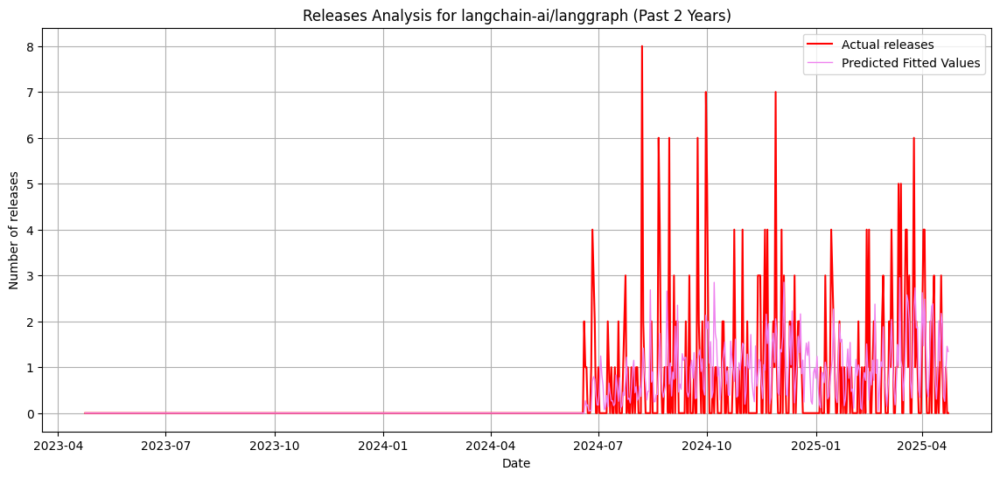

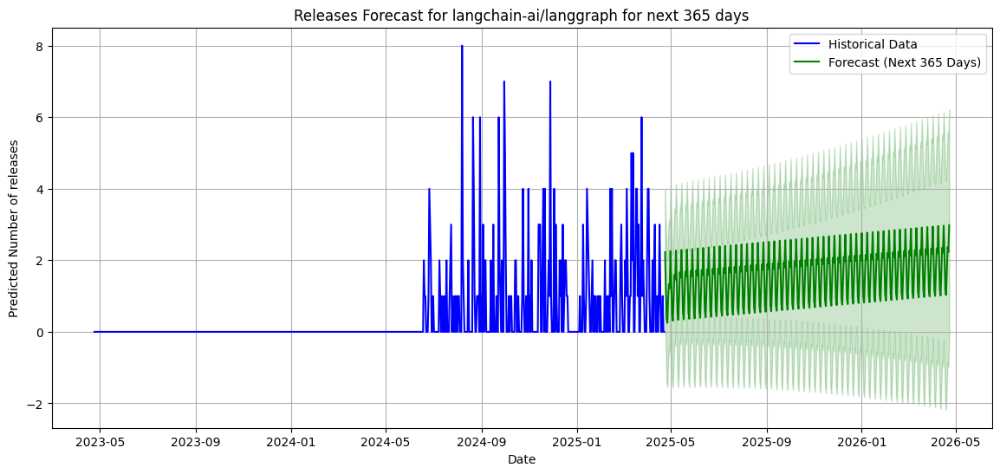

------------------------------------------------------------------------


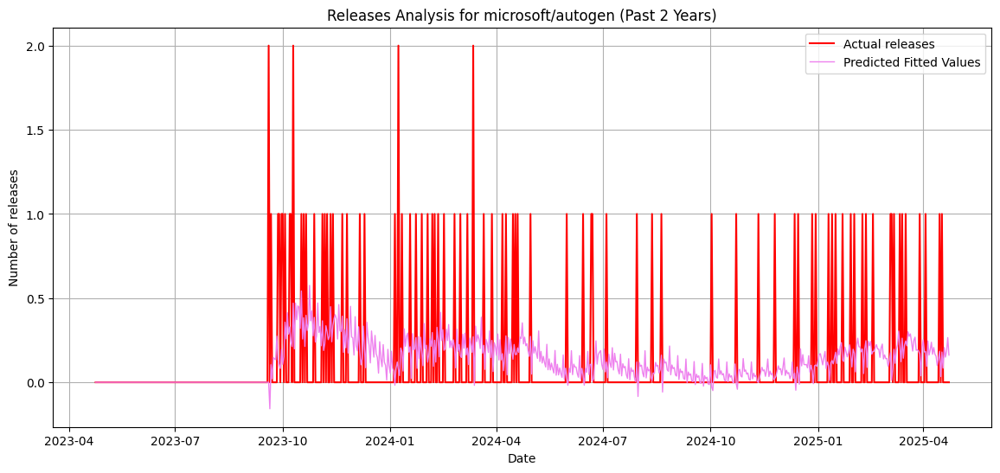

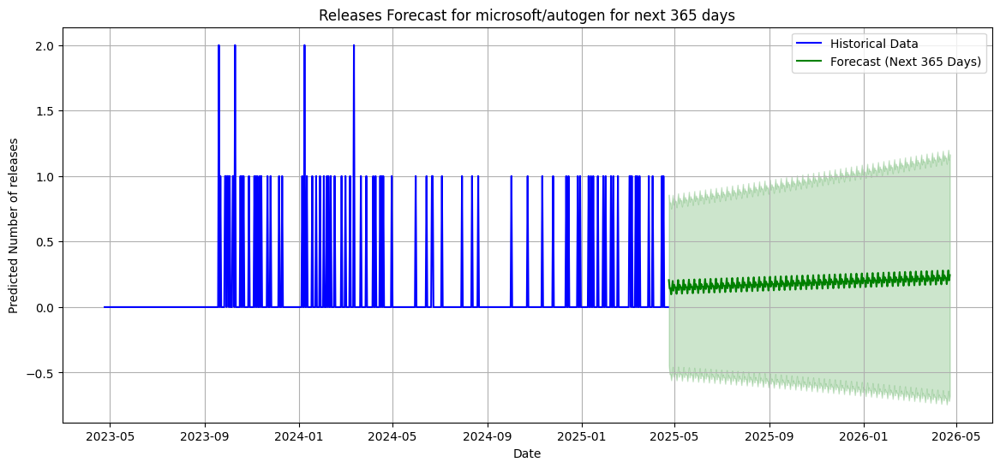

------------------------------------------------------------------------


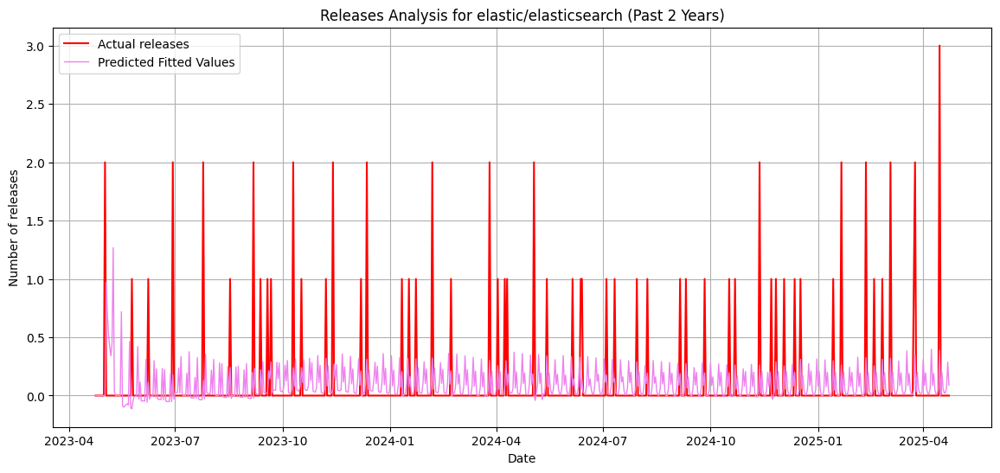

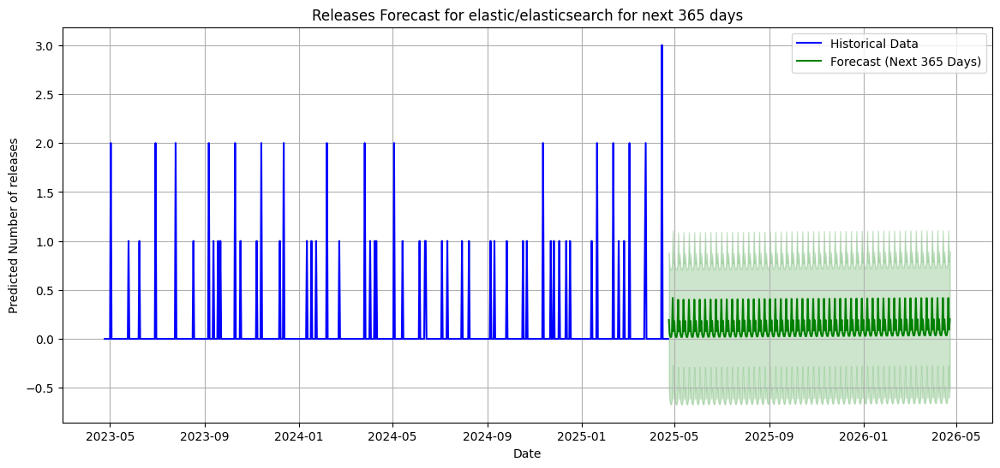

------------------------------------------------------------------------


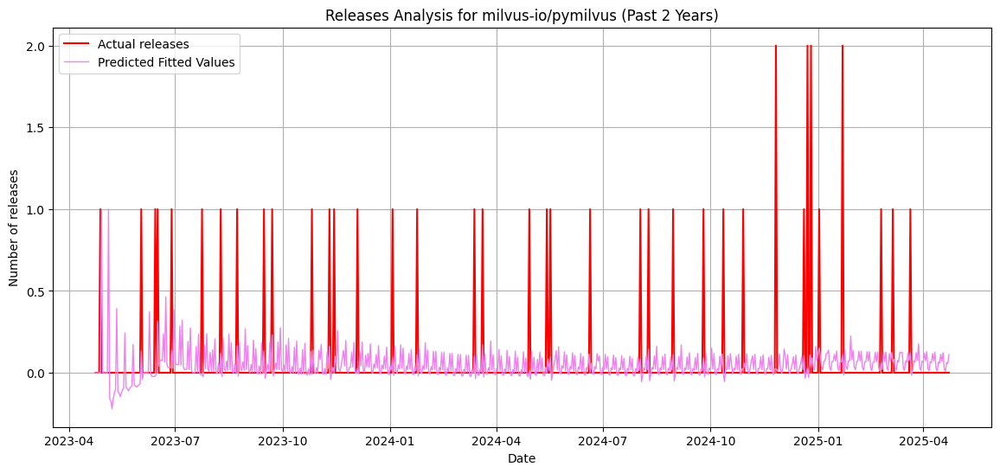

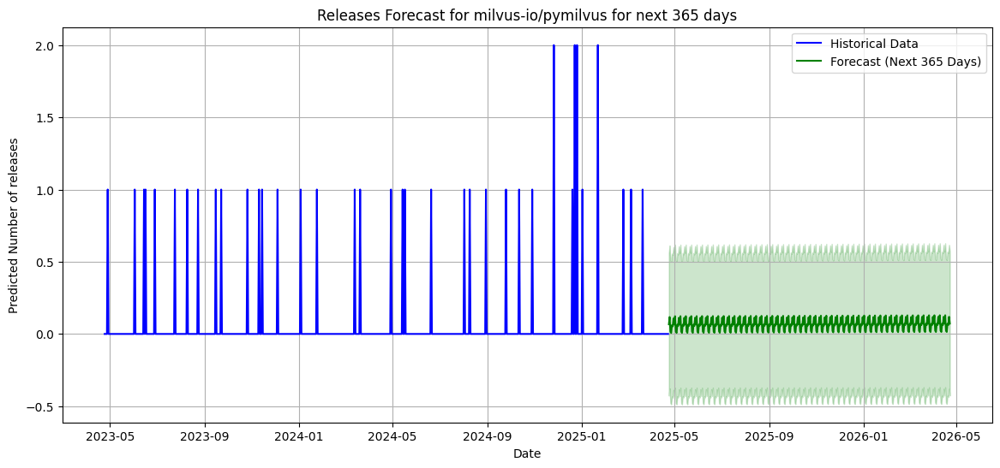

------------------------------------------------------------------------


In [1]:
#Add your code for requirement 10.10 in this cell

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import statsmodels.api as smsapi
import pytz

nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()  # Past 2 years

releaseData = pd.read_csv('dataset/releases_all_repo.csv')

for i in releaseData['repository'].unique():
    repoBasedDf = releaseData[releaseData['repository'] == i].copy()
    repoBasedDf['published_at'] = pd.to_datetime(repoBasedDf['published_at'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['published_at'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['published_at'] >= oldDate) & (repoBasedDf['published_at'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('published_at').size().reset_index(name='count')

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = repoBasedDfBasedOnDate.set_index('published_at').reindex(allDates, fill_value=0).reset_index()
    newRepoData.rename(columns={'index': 'published_at'}, inplace=True)

    model = smsapi.tsa.statespace.SARIMAX(newRepoData['count'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
    fitted = model.fit(disp=False)
    newRepoData['fitValues'] = fitted.fittedvalues

    plt.figure(figsize=(14, 6))
    plt.plot(newRepoData['published_at'], newRepoData['count'], label='Actual releases', color='red')
    plt.plot(newRepoData['published_at'], newRepoData['fitValues'], label='Predicted Fitted Values', color='violet', linewidth=1)
    plt.title(f"Releases Analysis for {i} (Past 2 Years)")
    plt.xlabel("Date")
    plt.ylabel("Number of releases")
    plt.legend()
    plt.grid()
    plt.show()

    forecast_steps = 365
    forecast = fitted.get_forecast(steps=forecast_steps)
    forecast_values = forecast.predicted_mean
    forecast_ci = forecast.conf_int()

    last_date = newRepoData['published_at'].iloc[-1]
    future_dates = pd.date_range(start=last_date + timedelta(days=1), periods=forecast_steps)

    plt.figure(figsize=(14, 6))
    plt.plot(newRepoData['published_at'], newRepoData['count'], label='Historical Data', color='blue')
    plt.plot(future_dates, forecast_values, label='Forecast (Next 365 Days)', color='green')
    plt.fill_between(future_dates, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='green', alpha=0.2)
    plt.title(f"Releases Forecast for {i} for next 365 days")
    plt.xlabel("Date")
    plt.ylabel("Predicted Number of releases")
    plt.legend()
    plt.grid()
    plt.show()

    print("------------------------------------------------------------------------")